# Muhammad Kevin Alrahmanto

https://lindeloev.github.io/tests-as-linear/

https://cran.r-project.org/web/packages/ggparty/vignettes/ggparty-graphic-partying.html

# ~ 2

Tidyverse: ggplot2, tibble, tidyr, readr,purrr, dplyr, stringr, forcats

## ~~ 2.1

In [1]:
library(tidyverse)
library(readxl)
library(finalfit)
library(patchwork)
library(ggfortify)
library(psych)

── Attaching core tidyverse packages ──────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: 'psych'


The following objects are masked from 'package:ggplot2':

    %+%, alpha




- continuous (numbers), in R: numeric, double, or integer;
- categorical, in R: character, factor, or logical (TRUE/FALSE);
- date/time, in R: POSIXct date-time

In [2]:
df<- data.frame(num= 1:5, 
                char= paste0(1:5, 'hell0'),
                group=factor(sample(c('G1', 'G2'),5, replace = T)),
                dates=as.Date(paste0(1:5, '/2/20')))
glimpse(df)

Rows: 5
Columns: 4
$ num   <int> 1, 2, 3, 4, 5
$ char  <chr> "1hell0", "2hell0", "3hell0", "4hell0", "5hell0"
$ group <fct> G1, G2, G2, G2, G2
$ dates <date> 0001-02-20, 0002-02-20, 0003-02-20, 0004-02-20, 0005-02-20


In [3]:
df$num  %>% mean() ==3

[1] TRUE

it’s about how computers store numbers with decimals. Computers have issues with decimal numbers, and this simple example illustrates one:

In [4]:
(0.10 + 0.05) == 0.15

[1] FALSE

In [5]:
near(0.10+0.05, 0.15 )

[1] TRUE

In [6]:
df  %>% count(group, sort=T)

group,n
<fct>,<int>
G2,4
G1,1


In [7]:
today <- Sys.time()
today;
as.Date(today) + 1

[1] "2023-09-19 07:31:12 +07"

[1] "2023-09-20"

In [8]:
today  %>% class()

[1] "POSIXct" "POSIXt"

In [9]:
my_datetime <- "2020-12-01 12:00"
as.Date(my_datetime) - Sys.time()
as.Date(my_datetime) - as.Date(Sys.time())
ymd_hm(my_datetime)- Sys.time()

Warning message in eval(expr, envir, enclos):
"Incompatible methods ("-.Date", "-.POSIXt") for "-""


[1] "-4638960-01-01"

Time difference of -1022 days

Time difference of -1021.522 days

## ~~ 2.2 Lubridate

In [10]:
parse_date_time("12:34 07/Jan'20", "%H:%M %d/%b'%y")

[1] "2020-01-07 12:34:00 UTC"

In [11]:
Sys.time() %>% format("%H:%M on %B-%d (%Y)") 

[1] "07:31 on September-19 (2023)"

In [12]:
Sys.time() %>% format("Happy days, 
the current time is %H:%M %B-%d (%Y)!")

[1] "Happy days, \nthe current time is 07:31 September-19 (2023)!"

## ~~ 2.3 Objects and functions

In [13]:
mydata <- tibble(
    id = 1:4,
    sex = c("Male", "Female", "Female", "Male"),
    var1 = c(4, 1, 2, 3),
    var2 = c(NA, 4, 5, NA),
    var3 = c(2, 1, NA, NA))
mydata

id,sex,var1,var2,var3
<int>,<chr>,<dbl>,<dbl>,<dbl>
1,Male,4,NA,2
2,Female,1,4,1
3,Female,2,5,NA
4,Male,3,NA,NA


In [14]:
mydata$var1

[1] 4 1 2 3

In [15]:
mean(mydata$var2, na.rm = T)

[1] 4.5

In [16]:
seq(15:30)/2

[1] 0.5 1.0 1.5 2.0 2.5 3.0 3.5 4.0 4.5 5.0 5.5 6.0 6.5 7.0 7.5 8.0

In [17]:
mydata$var1 %>% mean()

[1] 2.5

In [18]:
mydata$sex  %>% unique()

[1] "Male"   "Female"

In [19]:
mydata  %>% filter( sex %in% c('Male'))

id,sex,var1,var2,var3
<int>,<chr>,<dbl>,<dbl>,<dbl>
1,Male,4,NA,2
4,Male,3,NA,NA


In [20]:
mydata  %>% filter(is.na(var2))

id,sex,var1,var2,var3
<int>,<chr>,<dbl>,<dbl>,<dbl>
1,Male,4,NA,2
4,Male,3,NA,NA


In [21]:
mydata  %>% filter(!is.na(var2))

id,sex,var1,var2,var3
<int>,<chr>,<dbl>,<dbl>,<dbl>
2,Female,1,4,1
3,Female,2,5,NA


In [22]:
mydata %>% filter(var2 != 5)

id,sex,var1,var2,var3
<int>,<chr>,<dbl>,<dbl>,<dbl>
2,Female,1,4,1


In [23]:
mydata  %>% mutate(new=seq(9, 100, length.out = 4))

id,sex,var1,var2,var3,new
<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Male,4,NA,2,9.00000
2,Female,1,4,1,39.33333
3,Female,2,5,NA,69.66667
4,Male,3,NA,NA,100.00000


In [24]:
pastedata <- tibble(year = c(2007, 2008, 2009),
month = c("Jan", "Feb", "March"),
day = c(1, 2, 3))
pastedata


year,month,day
<dbl>,<chr>,<dbl>
2007,Jan,1
2008,Feb,2
2009,March,3


In [25]:
pastedata %>%
mutate(date = paste(day, month, year, sep = "-"))

year,month,day,date
<dbl>,<chr>,<dbl>,<chr>
2007,Jan,1,1-Jan-2007
2008,Feb,2,2-Feb-2008
2009,March,3,3-March-2009


In [26]:
pastedata %>%
mutate(date = paste(day, month, year, sep = "-")) %>%
mutate(date = dmy(date))

year,month,day,date
<dbl>,<chr>,<dbl>,<date>
2007,Jan,1,2007-01-01
2008,Feb,2,2008-02-02
2009,March,3,2009-03-03


In [27]:
patientdata <- data.frame(id=1:6,
                         sex=c('F','M','F','F','M','F'),
                         age=c(24, 59, 32,84, 48, 65))
patientdata

id,sex,age
<int>,<chr>,<dbl>
1,F,24
2,M,59
3,F,32
4,F,84
5,M,48
6,F,65


In [28]:
labsdata <- data.frame(id=c(5,6,8,7),
                      measurement=c(3.47,7.31,9.91,6.11))
labsdata

id,measurement
<dbl>,<dbl>
5,3.47
6,7.31
8,9.91
7,6.11


In [29]:
full_join(patientdata, labsdata)

Joining with `by = join_by(id)`


id,sex,age,measurement
<dbl>,<chr>,<dbl>,<dbl>
1,F,24,NA
2,M,59,NA
3,F,32,NA
4,F,84,NA
5,M,48,3.47
6,F,65,7.31
8,NA,NA,9.91
7,NA,NA,6.11


In [30]:
left_join(patientdata, labsdata)

Joining with `by = join_by(id)`


id,sex,age,measurement
<dbl>,<chr>,<dbl>,<dbl>
1,F,24,NA
2,M,59,NA
3,F,32,NA
4,F,84,NA
5,M,48,3.47
6,F,65,7.31


In [31]:
right_join(patientdata, labsdata)

Joining with `by = join_by(id)`


id,sex,age,measurement
<dbl>,<chr>,<dbl>,<dbl>
5,M,48,3.47
6,F,65,7.31
8,NA,NA,9.91
7,NA,NA,6.11


In [32]:
labsdata  %>% add_row(id=5, measurement=2.49)

id,measurement
<dbl>,<dbl>
5,3.47
6,7.31
8,9.91
7,6.11
5,2.49


# ~~ GBD

In [33]:
gbd_full <- read_csv('global_burden_disease_cause-year-sex-income.csv')

Rows: 168 Columns: 5
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (3): cause, sex, income
dbl (2): year, deaths_millions

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [34]:
head(gbd_full)

cause,year,sex,income,deaths_millions
<chr>,<dbl>,<chr>,<chr>,<dbl>
Communicable diseases,1990,Female,High,0.21
Communicable diseases,1990,Female,Upper-Middle,1.15
Communicable diseases,1990,Female,Lower-Middle,4.43
Communicable diseases,1990,Female,Low,1.51
Communicable diseases,1990,Male,High,0.26
Communicable diseases,1990,Male,Upper-Middle,1.35


In [35]:
gbd2017 <- gbd_full  %>% filter(year==2017)
gbd2017

cause,year,sex,income,deaths_millions
<chr>,<dbl>,<chr>,<chr>,<dbl>
Communicable diseases,2017,Female,High,0.26
Communicable diseases,2017,Female,Upper-Middle,0.55
Communicable diseases,2017,Female,Lower-Middle,2.92
Communicable diseases,2017,Female,Low,1.18
Communicable diseases,2017,Male,High,0.29
Communicable diseases,2017,Male,Upper-Middle,0.73
Communicable diseases,2017,Male,Lower-Middle,3.10
Communicable diseases,2017,Male,Low,1.35
Injuries,2017,Female,High,0.21


In [36]:
aggregate(deaths_millions~income+sex, gbd2017, mean)

income,sex,deaths_millions
<chr>,<chr>,<dbl>
High,Female,1.716667
Low,Female,0.740000
Lower-Middle,Female,3.283333
Upper-Middle,Female,2.753333
High,Male,1.780000
Low,Male,0.870000
Lower-Middle,Male,3.876667
Upper-Middle,Male,3.560000


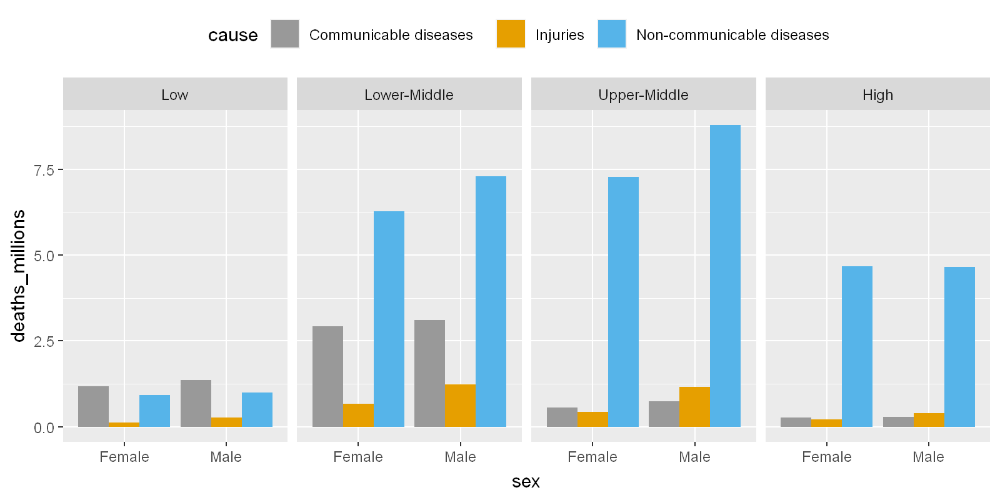

In [37]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)
gbd2017 %>%
# without the mutate(... = fct_relevel())
# the panels get ordered alphabetically
mutate(income = fct_relevel(income,
                            "Low",
                            "Lower-Middle",
                            "Upper-Middle",
                            "High")) %>%
# defining the variables using ggplot(aes(...)):
ggplot(aes(x = sex, y = deaths_millions, fill = cause)) +
# type of geom to be used: column (that's a type of barplot):
geom_col(position = "dodge") +
# facets for the income groups:
facet_wrap(~income, ncol = 4) +
# move the legend to the top of th
theme(legend.position = "top") + scale_fill_manual(values=c("#999999", "#E69F00", "#56B4E9"))

In [38]:
gbd2017$deaths_millions %>% sum()

[1] 55.74

In [39]:
gbd2017  %>% summarise(sum(deaths_millions))

sum(deaths_millions)
<dbl>
55.74


In [40]:
gbd2017  %>% group_by(cause)  %>% summarise(sum(deaths_millions))

cause,sum(deaths_millions)
<chr>,<dbl>
Communicable diseases,10.38
Injuries,4.47
Non-communicable diseases,40.89


In [41]:
gbd2017 %>%
group_by(cause, sex) %>%
summarise(deaths_per_group = sum(deaths_millions))  %>% 
ungroup() %>%
mutate(deaths_total = sum(deaths_per_group))

`summarise()` has grouped output by 'cause'. You can override using the `.groups` argument.


cause,sex,deaths_per_group,deaths_total
<chr>,<chr>,<dbl>,<dbl>
Communicable diseases,Female,4.91,55.74
Communicable diseases,Male,5.47,55.74
Injuries,Female,1.42,55.74
Injuries,Male,3.05,55.74
Non-communicable diseases,Female,19.15,55.74
Non-communicable diseases,Male,21.74,55.74


In [42]:
library(scales)
gbd2017_summarised <- gbd2017 %>%
group_by(cause, sex) %>%
summarise(deaths_per_group = sum(deaths_millions)) %>%
ungroup() %>%
mutate(deaths_total = sum(deaths_per_group),
deaths_relative = percent(deaths_per_group/deaths_total))
gbd2017_summarised


Attaching package: 'scales'


The following objects are masked from 'package:psych':

    alpha, rescale


The following object is masked from 'package:purrr':

    discard


The following object is masked from 'package:readr':

    col_factor


`summarise()` has grouped output by 'cause'. You can override using the `.groups` argument.


cause,sex,deaths_per_group,deaths_total,deaths_relative
<chr>,<chr>,<dbl>,<dbl>,<chr>
Communicable diseases,Female,4.91,55.74,8.8%
Communicable diseases,Male,5.47,55.74,9.8%
Injuries,Female,1.42,55.74,2.5%
Injuries,Male,3.05,55.74,5.5%
Non-communicable diseases,Female,19.15,55.74,34.4%
Non-communicable diseases,Male,21.74,55.74,39.0%


In [43]:
# using values from the first row as an example:
round(100*4.91/55.74, 1) %>% paste0("%")


[1] "8.8%"

In [44]:
gbd2017_summarised %>%
mutate(deaths_relative = deaths_per_group/deaths_total)

cause,sex,deaths_per_group,deaths_total,deaths_relative
<chr>,<chr>,<dbl>,<dbl>,<dbl>
Communicable diseases,Female,4.91,55.74,0.08808755
Communicable diseases,Male,5.47,55.74,0.09813419
Injuries,Female,1.42,55.74,0.02547542
Injuries,Male,3.05,55.74,0.05471834
Non-communicable diseases,Female,19.15,55.74,0.34355938
Non-communicable diseases,Male,21.74,55.74,0.39002512


In [45]:
gbd_summarised <- gbd2017 %>%
group_by(cause, sex) %>%
summarise(deaths_per_group = sum(deaths_millions)) %>%
arrange(sex)

`summarise()` has grouped output by 'cause'. You can override using the `.groups` argument.


In [46]:
gbd_summarised

cause,sex,deaths_per_group
<chr>,<chr>,<dbl>
Communicable diseases,Female,4.91
Injuries,Female,1.42
Non-communicable diseases,Female,19.15
Communicable diseases,Male,5.47
Injuries,Male,3.05
Non-communicable diseases,Male,21.74


In [47]:
aggregate(deaths_per_group~sex, gbd_summarised, sum )

sex,deaths_per_group
<chr>,<dbl>
Female,25.48
Male,30.26


In [48]:
gbd_summarised_sex <- gbd_summarised  %>% 
group_by(sex)  %>% summarise(sum(deaths_per_group))
gbd_summarised_sex

sex,sum(deaths_per_group)
<chr>,<dbl>
Female,25.48
Male,30.26


In [49]:
full_join(gbd_summarised,gbd_summarised_sex )

Joining with `by = join_by(sex)`


cause,sex,deaths_per_group,sum(deaths_per_group)
<chr>,<chr>,<dbl>,<dbl>
Communicable diseases,Female,4.91,25.48
Injuries,Female,1.42,25.48
Non-communicable diseases,Female,19.15,25.48
Communicable diseases,Male,5.47,30.26
Injuries,Male,3.05,30.26
Non-communicable diseases,Male,21.74,30.26


In [50]:
gbd_summarised %>%
group_by(sex) %>%
mutate(deaths_per_sex = sum(deaths_per_group))

cause,sex,deaths_per_group,deaths_per_sex
<chr>,<chr>,<dbl>,<dbl>
Communicable diseases,Female,4.91,25.48
Injuries,Female,1.42,25.48
Non-communicable diseases,Female,19.15,25.48
Communicable diseases,Male,5.47,30.26
Injuries,Male,3.05,30.26
Non-communicable diseases,Male,21.74,30.26


In [51]:
gbd2017 %>%
group_by(cause, sex) %>%
summarise(deaths_per_group = sum(deaths_millions)) %>%
group_by(sex) %>%
mutate(deaths_per_sex = sum(deaths_per_group),
sex_cause_perc = percent(deaths_per_group/deaths_per_sex)) %>%
arrange(sex, deaths_per_group)


`summarise()` has grouped output by 'cause'. You can override using the `.groups` argument.


cause,sex,deaths_per_group,deaths_per_sex,sex_cause_perc
<chr>,<chr>,<dbl>,<dbl>,<chr>
Injuries,Female,1.42,25.48,6%
Communicable diseases,Female,4.91,25.48,19%
Non-communicable diseases,Female,19.15,25.48,75%
Injuries,Male,3.05,30.26,10.1%
Communicable diseases,Male,5.47,30.26,18.1%
Non-communicable diseases,Male,21.74,30.26,71.8%


In [52]:
gbd_2rows <- gbd_full %>%
slice(1:2)
gbd_2rows

cause,year,sex,income,deaths_millions
<chr>,<dbl>,<chr>,<chr>,<dbl>
Communicable diseases,1990,Female,High,0.21
Communicable diseases,1990,Female,Upper-Middle,1.15


In [53]:
gbd_2rows %>%
select(cause, deaths = deaths_millions)

cause,deaths
<chr>,<dbl>
Communicable diseases,0.21
Communicable diseases,1.15


In [54]:
gbd_2rows %>%
rename(deaths = deaths_millions)

cause,year,sex,income,deaths
<chr>,<dbl>,<chr>,<chr>,<dbl>
Communicable diseases,1990,Female,High,0.21
Communicable diseases,1990,Female,Upper-Middle,1.15


In [55]:
gbd_2rows %>%
select(year, sex, income, cause, deaths_millions)

year,sex,income,cause,deaths_millions
<dbl>,<chr>,<chr>,<chr>,<dbl>
1990,Female,High,Communicable diseases,0.21
1990,Female,Upper-Middle,Communicable diseases,1.15


In [56]:
gbd_2rows %>%
select(year, sex, everything())


year,sex,cause,income,deaths_millions
<dbl>,<chr>,<chr>,<chr>,<dbl>
1990,Female,Communicable diseases,High,0.21
1990,Female,Communicable diseases,Upper-Middle,1.15


In [57]:
gbd_2rows %>%
select(starts_with("deaths"))

deaths_millions
<dbl>
0.21
1.15


In [58]:
gbd2017  %>% group_by(cause,sex)  %>% 
summarise(death_by_sANDc=sum(deaths_millions))  %>% 
arrange(sex)  %>% group_by(sex)  %>% mutate(death_by_s=sum(death_by_sANDc))

`summarise()` has grouped output by 'cause'. You can override using the `.groups` argument.


cause,sex,death_by_sANDc,death_by_s
<chr>,<chr>,<dbl>,<dbl>
Communicable diseases,Female,4.91,25.48
Injuries,Female,1.42,25.48
Non-communicable diseases,Female,19.15,25.48
Communicable diseases,Male,5.47,30.26
Injuries,Male,3.05,30.26
Non-communicable diseases,Male,21.74,30.26


In [59]:
gbd_wide <- read_csv("global_burden_disease_wide-format.csv")
gbd_long <- read_csv("global_burden_disease_cause-year-sex.csv")

Rows: 3 Columns: 5
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (1): cause
dbl (4): Female_1990, Female_2017, Male_1990, Male_2017

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 12 Columns: 4
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (2): cause, sex
dbl (2): year, deaths_millions

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [60]:
gbd_long

cause,year,sex,deaths_millions
<chr>,<dbl>,<chr>,<dbl>
Communicable diseases,1990,Female,7.30
Communicable diseases,2017,Female,4.91
Communicable diseases,1990,Male,8.06
Communicable diseases,2017,Male,5.47
Injuries,1990,Female,1.41
Injuries,2017,Female,1.42
Injuries,1990,Male,2.84
Injuries,2017,Male,3.05
Non-communicable diseases,1990,Female,12.80


# ~~ Pivot

In [61]:
gbd_long  %>% pivot_wider(names_from=year,values_from=deaths_millions) 

cause,sex,1990,2017
<chr>,<chr>,<dbl>,<dbl>
Communicable diseases,Female,7.30,4.91
Communicable diseases,Male,8.06,5.47
Injuries,Female,1.41,1.42
Injuries,Male,2.84,3.05
Non-communicable diseases,Female,12.80,19.15
Non-communicable diseases,Male,13.91,21.74


In [62]:
gbd_long  %>% pivot_wider(names_from=sex, values_from=deaths_millions)  %>% 
mutate(Male-Female)

cause,year,Female,Male,Male - Female
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Communicable diseases,1990,7.30,8.06,0.76
Communicable diseases,2017,4.91,5.47,0.56
Injuries,1990,1.41,2.84,1.43
Injuries,2017,1.42,3.05,1.63
Non-communicable diseases,1990,12.80,13.91,1.11
Non-communicable diseases,2017,19.15,21.74,2.59


In [63]:
gbd_long  %>% pivot_wider(names_from = c(sex, year), values_from =deaths_millions )

cause,Female_1990,Female_2017,Male_1990,Male_2017
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Communicable diseases,7.30,4.91,8.06,5.47
Injuries,1.41,1.42,2.84,3.05
Non-communicable diseases,12.80,19.15,13.91,21.74


In [64]:
gbd_wide

cause,Female_1990,Female_2017,Male_1990,Male_2017
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Communicable diseases,7.30,4.91,8.06,5.47
Injuries,1.41,1.42,2.84,3.05
Non-communicable diseases,12.80,19.15,13.91,21.74


In [65]:
gbd_wide %>% pivot_longer(matches('1990|2017'),
                          names_to ='sex_year',
                          values_to='value'
                         )

cause,sex_year,value
<chr>,<chr>,<dbl>
Communicable diseases,Female_1990,7.30
Communicable diseases,Female_2017,4.91
Communicable diseases,Male_1990,8.06
Communicable diseases,Male_2017,5.47
Injuries,Female_1990,1.41
Injuries,Female_2017,1.42
Injuries,Male_1990,2.84
Injuries,Male_2017,3.05
Non-communicable diseases,Female_1990,12.80


In [66]:
gbd_wide %>% pivot_longer(matches('Female|Male'),
                          names_to ='sex_year',
                          values_to='deaths_millions'
                         )

cause,sex_year,deaths_millions
<chr>,<chr>,<dbl>
Communicable diseases,Female_1990,7.30
Communicable diseases,Female_2017,4.91
Communicable diseases,Male_1990,8.06
Communicable diseases,Male_2017,5.47
Injuries,Female_1990,1.41
Injuries,Female_2017,1.42
Injuries,Male_1990,2.84
Injuries,Male_2017,3.05
Non-communicable diseases,Female_1990,12.80


In [67]:
gbd_wide %>%
select(matches("Female|Male"))

Female_1990,Female_2017,Male_1990,Male_2017
<dbl>,<dbl>,<dbl>,<dbl>
7.30,4.91,8.06,5.47
1.41,1.42,2.84,3.05
12.80,19.15,13.91,21.74


In [68]:
gbd_wide %>%
# same pivot_longer as before
pivot_longer(matches("Female|Male"),
names_to = "sex_year",
values_to = "deaths_millions") %>%
separate(sex_year, into = c("sex", "year"), sep = "_", convert = TRUE)

cause,sex,year,deaths_millions
<chr>,<chr>,<int>,<dbl>
Communicable diseases,Female,1990,7.30
Communicable diseases,Female,2017,4.91
Communicable diseases,Male,1990,8.06
Communicable diseases,Male,2017,5.47
Injuries,Female,1990,1.41
Injuries,Female,2017,1.42
Injuries,Male,1990,2.84
Injuries,Male,2017,3.05
Non-communicable diseases,Female,1990,12.80


In [69]:
gbd_long  %>% arrange(deaths_millions)

cause,year,sex,deaths_millions
<chr>,<dbl>,<chr>,<dbl>
Injuries,1990,Female,1.41
Injuries,2017,Female,1.42
Injuries,1990,Male,2.84
Injuries,2017,Male,3.05
Communicable diseases,2017,Female,4.91
Communicable diseases,2017,Male,5.47
Communicable diseases,1990,Female,7.30
Communicable diseases,1990,Male,8.06
Non-communicable diseases,1990,Female,12.80


In [70]:
gbd_factored <- gbd_long  %>% mutate(cause=factor(cause))
gbd_factored

cause,year,sex,deaths_millions
<fct>,<dbl>,<chr>,<dbl>
Communicable diseases,1990,Female,7.30
Communicable diseases,2017,Female,4.91
Communicable diseases,1990,Male,8.06
Communicable diseases,2017,Male,5.47
Injuries,1990,Female,1.41
Injuries,2017,Female,1.42
Injuries,1990,Male,2.84
Injuries,2017,Male,3.05
Non-communicable diseases,1990,Female,12.80


In [71]:
gbd_factored$cause  %>% levels()

[1] "Communicable diseases"     "Injuries"                 
[3] "Non-communicable diseases"

In [72]:
#change the order of theselevels
gbd_factored <- gbd_factored %>%
mutate(cause = cause %>%
fct_relevel("Injuries"))
gbd_factored$cause %>% levels()

[1] "Injuries"                  "Communicable diseases"    
[3] "Non-communicable diseases"

In [73]:
gbd_long <- read_csv("global_burden_disease_cause-year-sex.csv")

Rows: 12 Columns: 4
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (2): cause, sex
dbl (2): year, deaths_millions

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [74]:
gbd_long  %>%  pivot_wider(names_from = cause, values_from = deaths_millions)

year,sex,Communicable diseases,Injuries,Non-communicable diseases
<dbl>,<chr>,<dbl>,<dbl>,<dbl>
1990,Female,7.30,1.41,12.80
2017,Female,4.91,1.42,19.15
1990,Male,8.06,2.84,13.91
2017,Male,5.47,3.05,21.74


In [75]:
gbd_full = read_csv("global_burden_disease_cause-year-sex-income.csv")
glimpse(gbd_full)


Rows: 168 Columns: 5
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (3): cause, sex, income
dbl (2): year, deaths_millions

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Rows: 168
Columns: 5
$ cause           <chr> "Communicable diseases", "Communicable diseases", "Com…
$ year            <dbl> 1990, 1990, 1990, 1990, 1990, 1990, 1990, 1990, 1990, …
$ sex             <chr> "Female", "Female", "Female", "Female", "Male", "Male"…
$ income          <chr> "High", "Upper-Middle", "Lower-Middle", "Low", "High",…
$ deaths_millions <dbl> 0.21, 1.15, 4.43, 1.51, 0.26, 1.35, 4.73, 1.72, 0.20, …


In [76]:
gbd_full  %>% group_by(year, cause)  %>% summarise(sum(deaths_millions))

`summarise()` has grouped output by 'year'. You can override using the `.groups` argument.


year,cause,sum(deaths_millions)
<dbl>,<chr>,<dbl>
1990,Communicable diseases,15.36
1990,Injuries,4.25
1990,Non-communicable diseases,26.71
1995,Communicable diseases,15.11
1995,Injuries,4.53
1995,Non-communicable diseases,29.27
2000,Communicable diseases,14.81
2000,Injuries,4.56
2000,Non-communicable diseases,31.01


In [77]:
yearly_death <- gbd_full  %>% group_by (year)  %>% summarise(sum_y = sum(deaths_millions))
yearly_death

year,sum_y
<dbl>,<dbl>
1990,46.32
1995,48.91
2000,50.38
2005,51.25
2010,52.63
2015,54.62
2017,55.74


In [78]:
year_cause <- gbd_full  %>% group_by(year, cause)  %>% summarise(sum_d=sum(deaths_millions))
year_cause

`summarise()` has grouped output by 'year'. You can override using the `.groups` argument.


year,cause,sum_d
<dbl>,<chr>,<dbl>
1990,Communicable diseases,15.36
1990,Injuries,4.25
1990,Non-communicable diseases,26.71
1995,Communicable diseases,15.11
1995,Injuries,4.53
1995,Non-communicable diseases,29.27
2000,Communicable diseases,14.81
2000,Injuries,4.56
2000,Non-communicable diseases,31.01


In [79]:
full_join(yearly_death, year_cause )  %>%  mutate(pct = percent(sum_d/sum_y))

Joining with `by = join_by(year)`


year,sum_y,cause,sum_d,pct
<dbl>,<dbl>,<chr>,<dbl>,<chr>
1990,46.32,Communicable diseases,15.36,33.161%
1990,46.32,Injuries,4.25,9.175%
1990,46.32,Non-communicable diseases,26.71,57.664%
1995,48.91,Communicable diseases,15.11,30.893%
1995,48.91,Injuries,4.53,9.262%
1995,48.91,Non-communicable diseases,29.27,59.845%
2000,50.38,Communicable diseases,14.81,29.397%
2000,50.38,Injuries,4.56,9.051%
2000,50.38,Non-communicable diseases,31.01,61.552%


In [80]:
gbd_full  %>%  group_by(year, cause)  %>% summarise(sum_yc = sum(deaths_millions))  %>% 
group_by(year)  %>% mutate(deaths_per_year=sum(sum_yc), pct=percent(sum_yc/deaths_per_year))  %>% 
select(year, cause, pct) %>% pivot_wider(names_from = cause, values_from = pct)

`summarise()` has grouped output by 'year'. You can override using the `.groups` argument.


year,Communicable diseases,Injuries,Non-communicable diseases
<dbl>,<chr>,<chr>,<chr>
1990,33%,9%,58%
1995,31%,9%,60%
2000,29%,9%,62%
2005,27%,9%,64%
2010,24%,9%,67%
2015,20%,8%,72%
2017,19%,8%,73%


In [81]:
gbd_full %>%
filter(year == 1990)  %>% group_by(sex, income)  %>% summarise(sum_d = sum(deaths_millions))  %>% 
pivot_wider(names_from = income, values_from = sum_d)

`summarise()` has grouped output by 'sex'. You can override using the `.groups` argument.


sex,High,Low,Lower-Middle,Upper-Middle
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Female,4.14,2.22,8.47,6.68
Male,4.46,2.57,9.83,7.95


# 4 ~ Gapminder

In [82]:
library(gapminder)
head(gapminder)

country,continent,year,lifeExp,pop,gdpPercap
<fct>,<fct>,<int>,<dbl>,<int>,<dbl>
Afghanistan,Asia,1952,28.801,8425333,779.4453
Afghanistan,Asia,1957,30.332,9240934,820.8530
Afghanistan,Asia,1962,31.997,10267083,853.1007
Afghanistan,Asia,1967,34.020,11537966,836.1971
Afghanistan,Asia,1972,36.088,13079460,739.9811
Afghanistan,Asia,1977,38.438,14880372,786.1134


In [83]:
ind <- sapply(gapminder, is.numeric)
sapply(gapminder[,!ind], n_distinct)

country continent 
      142         5

In [84]:
gapdata2007 <- gapminder %>% filter(year==2007)
gapdata <- gapminder

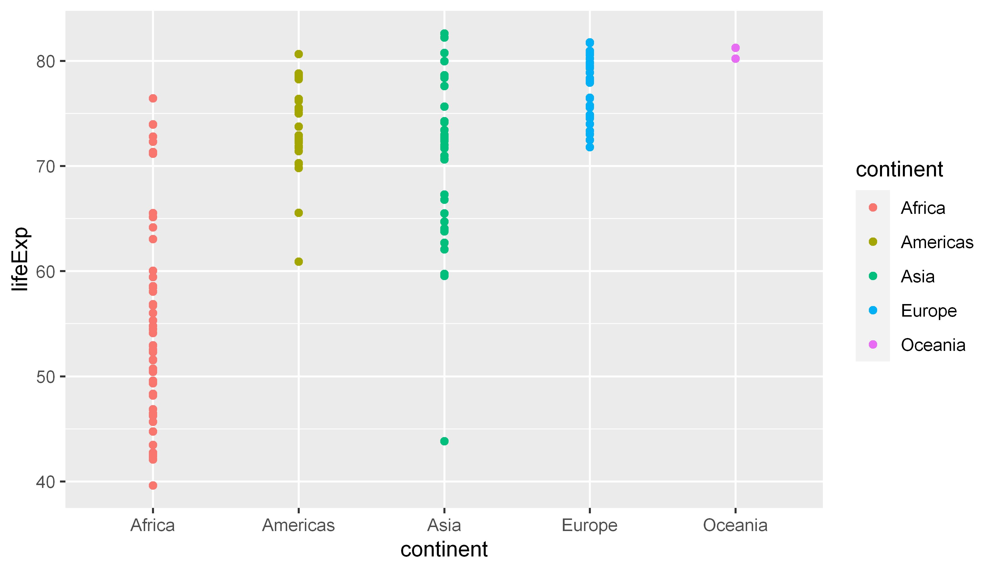

In [85]:
options(repr.plot.width = 7,  repr.plot.height = 4, repr.plot.res = 500)
gapdata2007  %>% ggplot(aes(continent, lifeExp, colour=continent)) + geom_point()

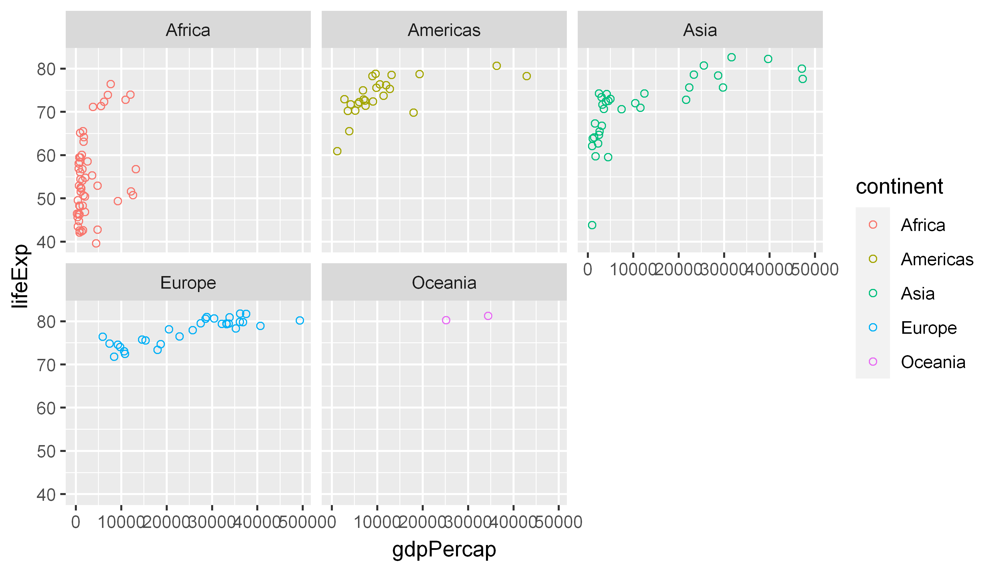

In [86]:
gapdata2007 %>%
ggplot(aes(x = gdpPercap, y = lifeExp, colour = continent)) +
geom_point(shape = 1) +
facet_wrap(~continent)


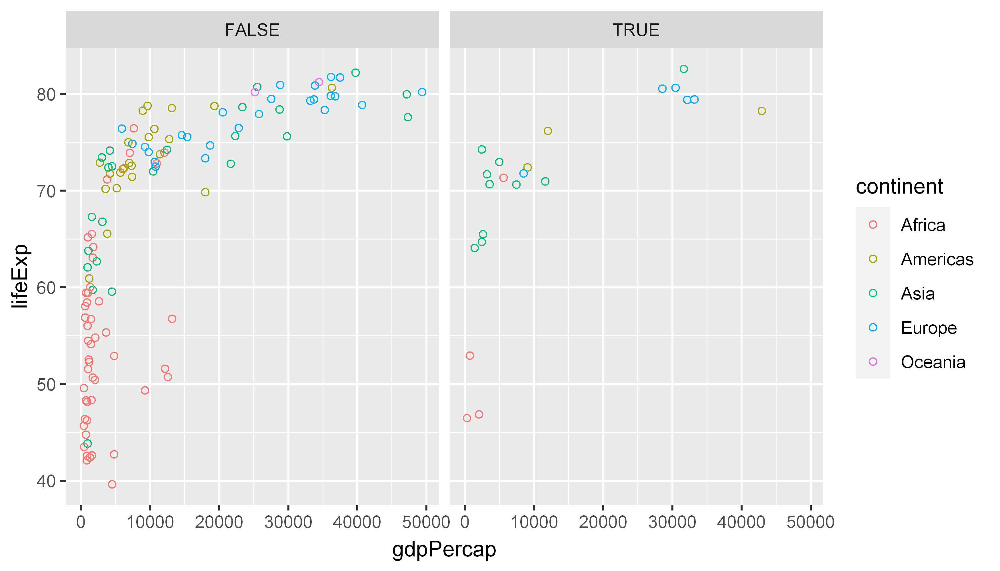

In [87]:
gapdata2007 %>%
ggplot(aes(x = gdpPercap, y = lifeExp, colour = continent)) +
geom_point(shape = 1) +
facet_wrap(~pop > 50000000)


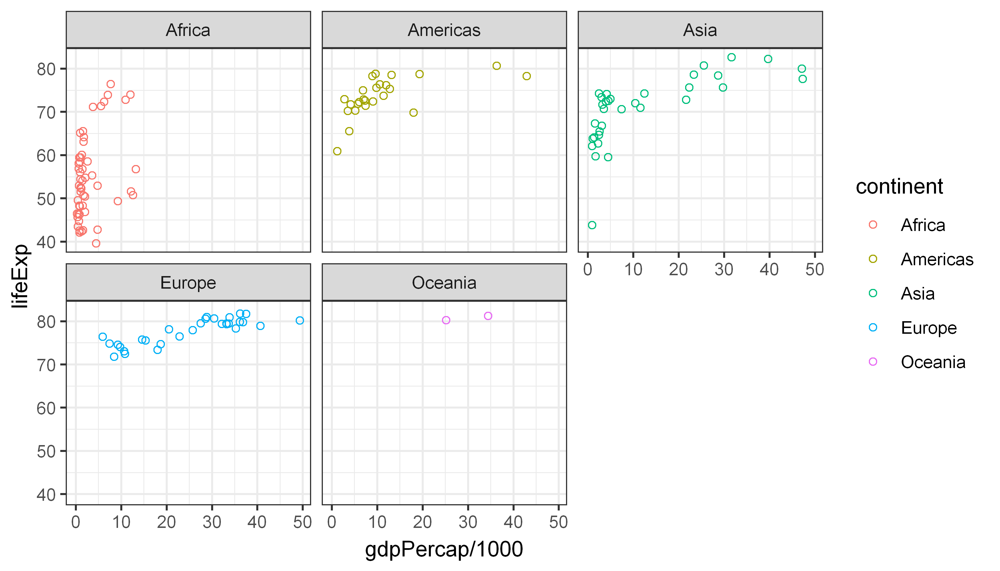

In [88]:
gapdata2007 %>%
ggplot(aes(x = gdpPercap/1000, y = lifeExp, colour = continent)) +
geom_point(shape = 1) +
facet_wrap(~continent) +
theme_bw()

In [89]:
theme_set(theme_bw())

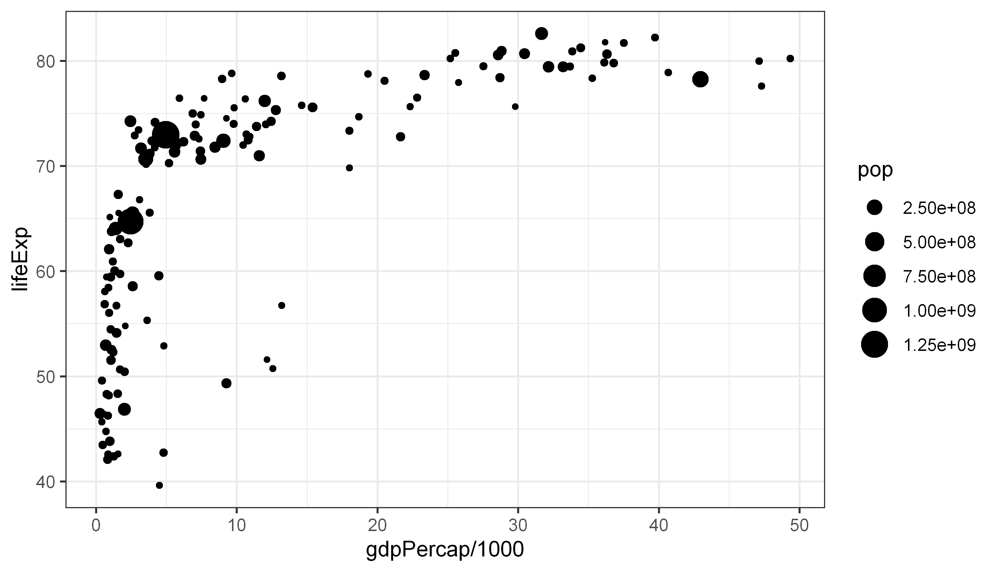

In [90]:
gapdata2007 %>%
ggplot(aes(x = gdpPercap/1000, y = lifeExp, size = pop)) +
geom_point()

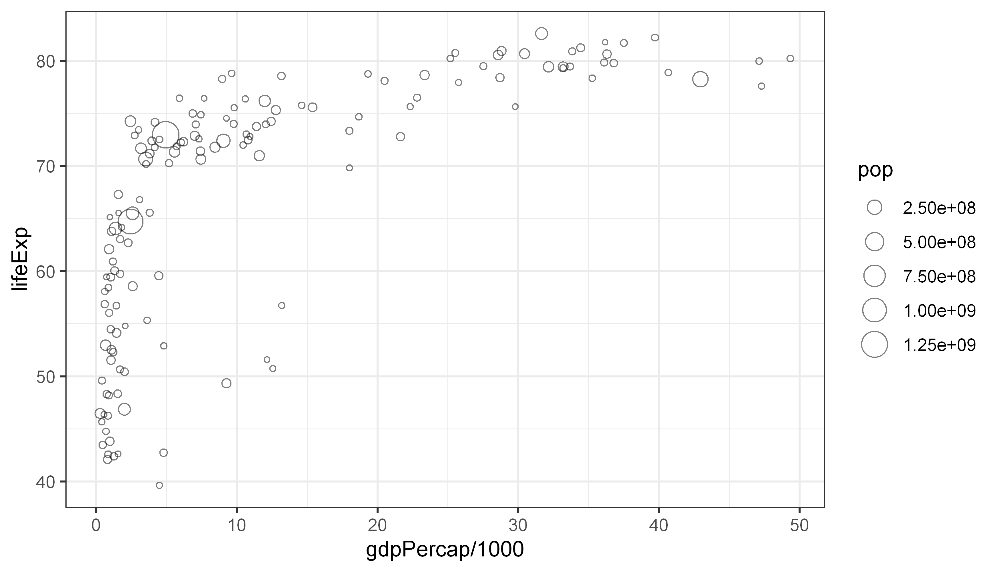

In [91]:
gapdata2007 %>%
ggplot(aes(x = gdpPercap/1000, y = lifeExp, size = pop)) +
geom_point(shape = 1, alpha = 0.5)

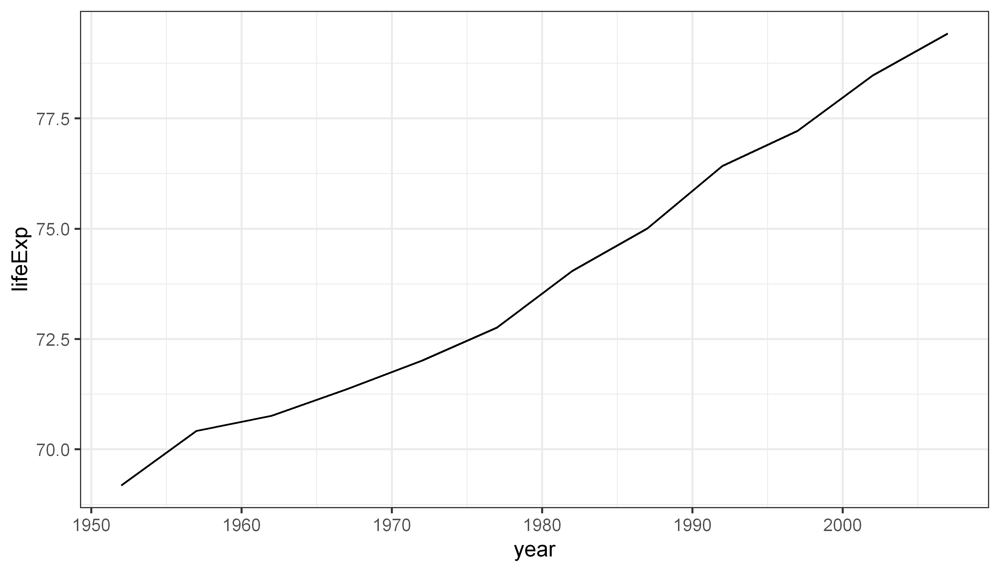

In [92]:
gapdata %>%
filter(country == "United Kingdom") %>%
ggplot(aes(x = year, y = lifeExp)) +
geom_line()


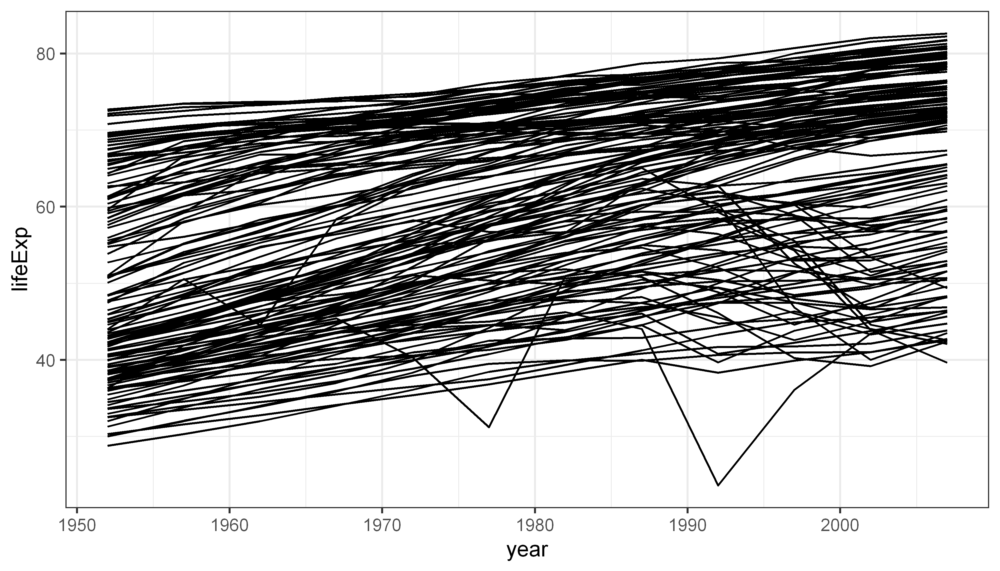

In [93]:
gapdata %>%
ggplot(aes(x = year, y = lifeExp, group = country)) +
geom_line()

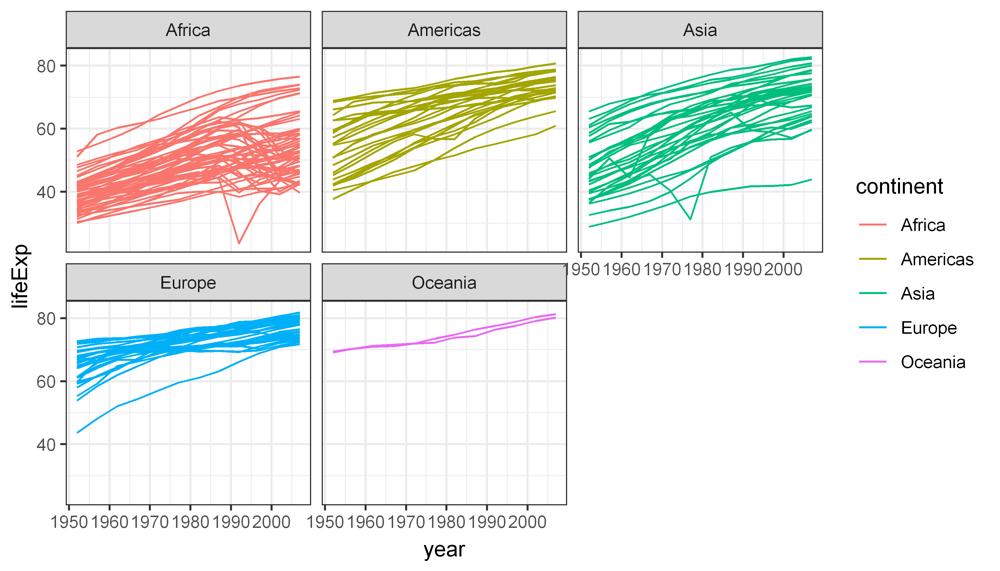

In [94]:
gapdata  %>% ggplot(aes(year, lifeExp, group=country, color=continent)) + geom_line()+
facet_wrap(~continent)

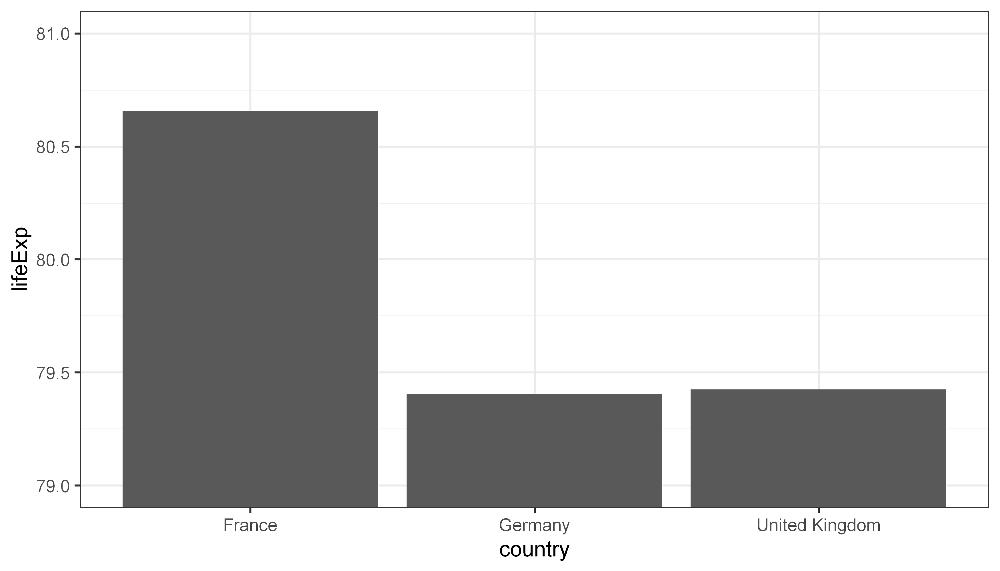

In [95]:
gapdata2007 %>%
filter(country %in% c("United Kingdom", "France", "Germany")) %>%
ggplot(aes(x = country, y = lifeExp)) +
geom_col() + coord_cartesian(ylim=c(79, 81))

Colour is the
border around a geom, whereas fill is inside it

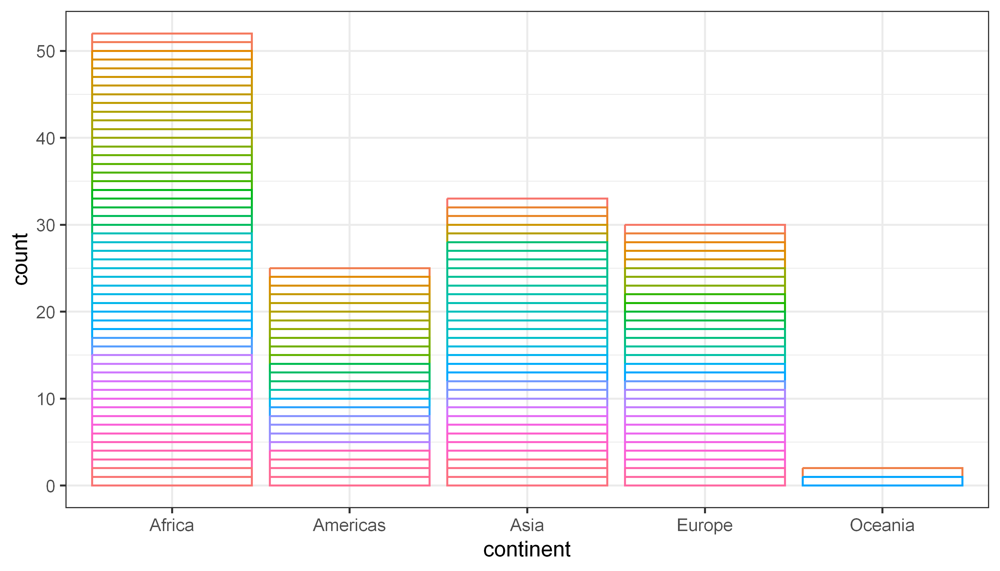

In [96]:
gapdata2007 %>%
ggplot(aes(x = continent, colour = country)) +
geom_bar(fill = NA) +
theme(legend.position = "none")

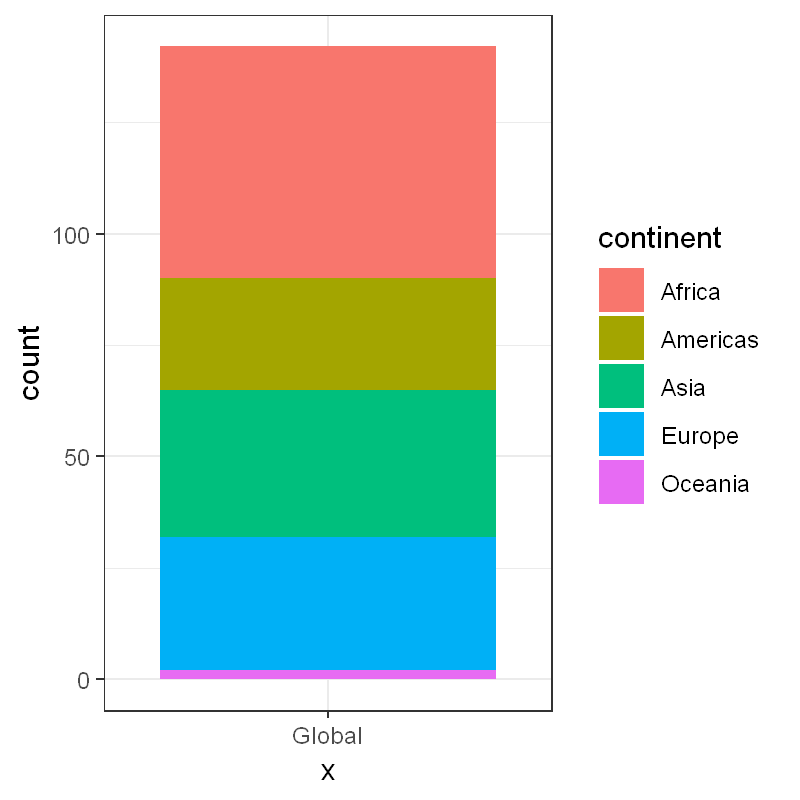

In [97]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 200)
gapdata2007 %>%
ggplot(aes(x = "Global", fill = continent)) +
geom_bar()

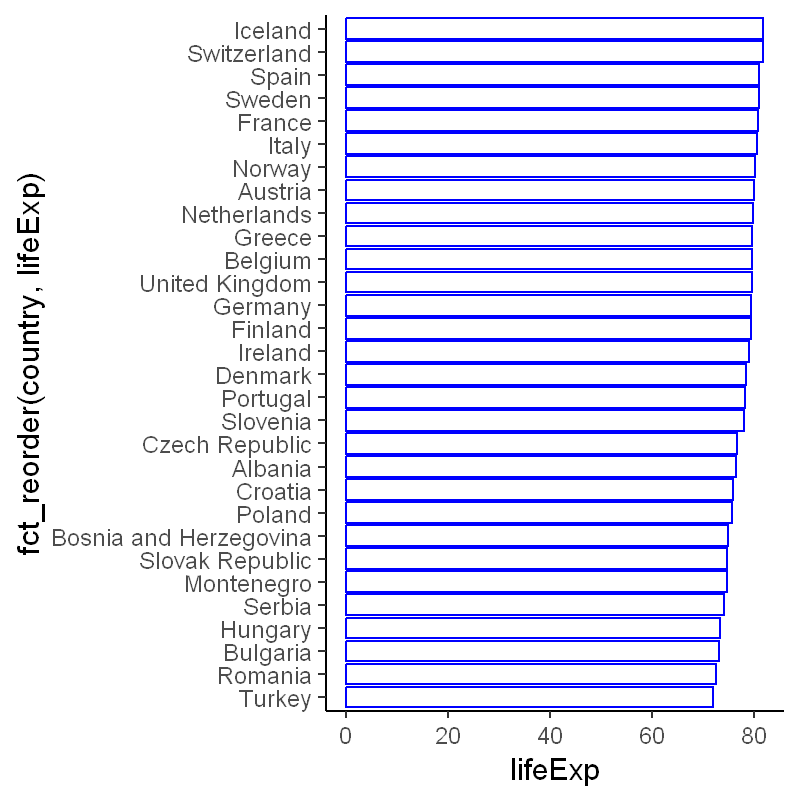

In [98]:
gapdata2007  %>% filter(continent=='Europe')  %>% 
ggplot(aes(fct_reorder(country, lifeExp),lifeExp)) + geom_col(fill='white', colour='blue')+ 
coord_flip() + theme_classic()

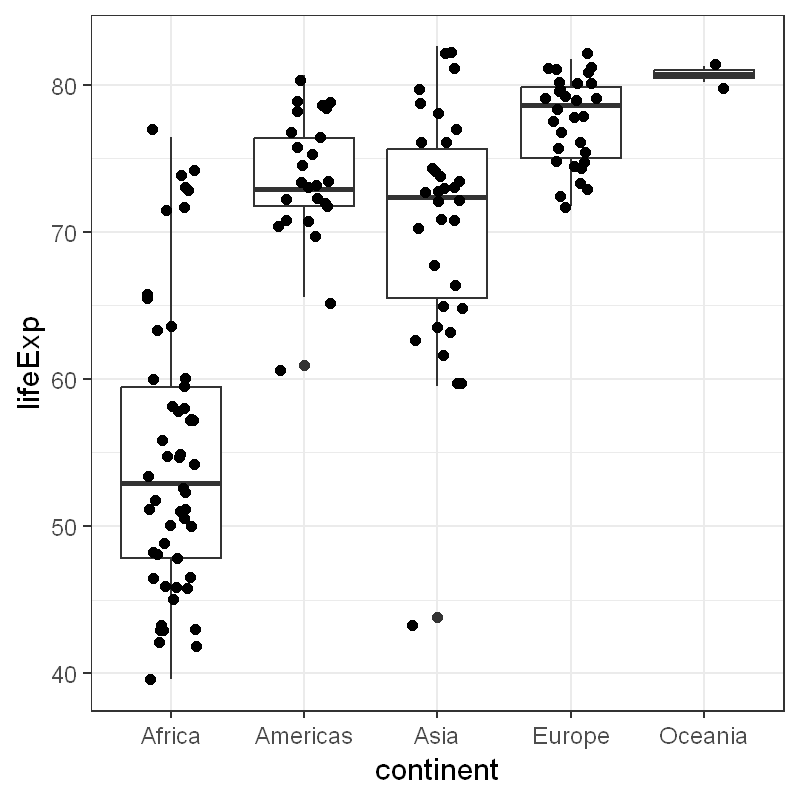

In [99]:
gapdata2007 %>%
ggplot(aes(x = continent, y = lifeExp)) +
geom_boxplot() + geom_jitter(width = 0.2, height = 0.6)

In [100]:
gapdata2007  %>% group_by(continent)  %>% filter(lifeExp == max(lifeExp))

country,continent,year,lifeExp,pop,gdpPercap
<fct>,<fct>,<int>,<dbl>,<int>,<dbl>
Australia,Oceania,2007,81.235,20434176,34435.367
Canada,Americas,2007,80.653,33390141,36319.235
Iceland,Europe,2007,81.757,301931,36180.789
Japan,Asia,2007,82.603,127467972,31656.068
Reunion,Africa,2007,76.442,798094,7670.123


In [101]:
label_data <- gapdata2007 %>%
group_by(continent) %>%
filter(lifeExp == max(lifeExp)) %>%
select(country, continent, lifeExp)
label_data

country,continent,lifeExp
<fct>,<fct>,<dbl>
Australia,Oceania,81.235
Canada,Americas,80.653
Iceland,Europe,81.757
Japan,Asia,82.603
Reunion,Africa,76.442


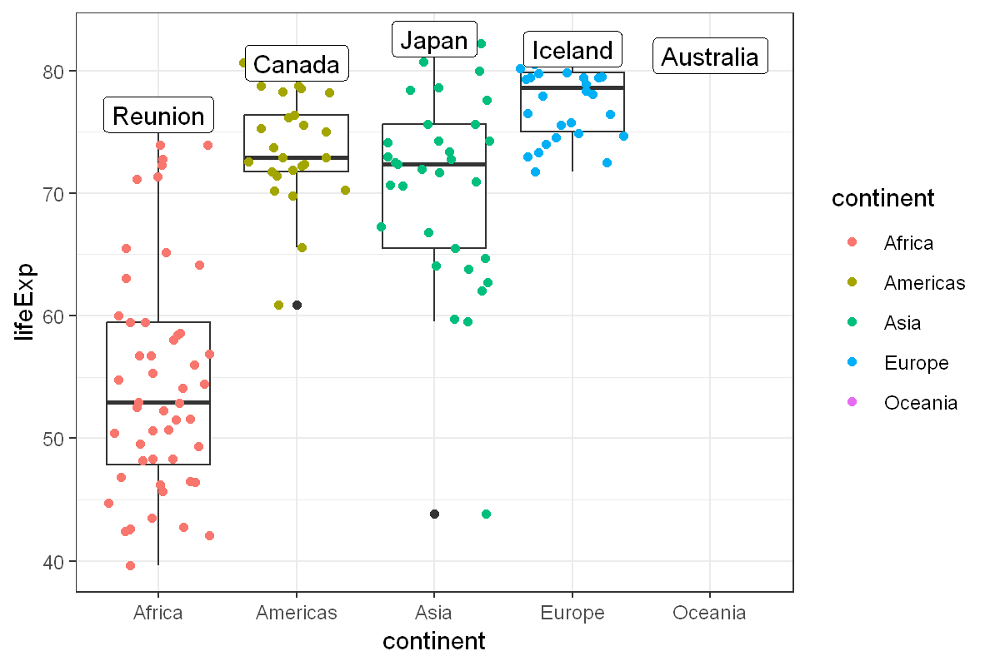

In [102]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
gapdata2007 %>%
ggplot(aes(x = continent, y = lifeExp)) +
# First geom - boxplot
geom_boxplot() +
# Second geom - jitter with its own aes(colour = )
geom_jitter(aes(colour = continent)) +
# Third geom - label, with its own dataset (label_data) and aes(label = )
geom_label(data = label_data, aes(label = country))


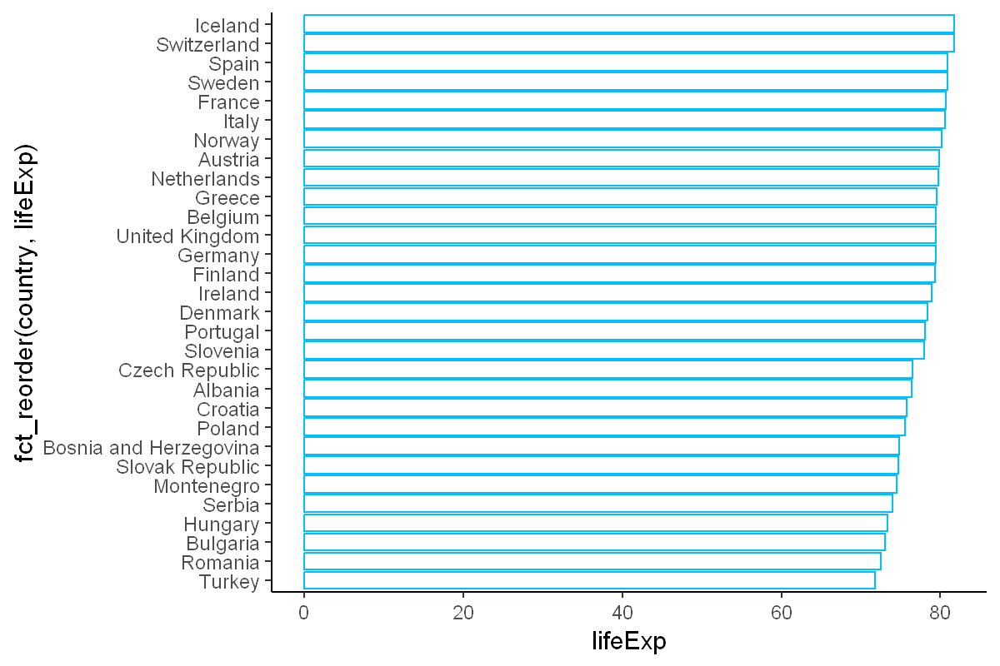

In [103]:
library(tidyverse)
library(gapminder)
gapminder %>%
filter(year == 2007) %>%
filter(continent == "Europe") %>%
ggplot(aes(x = fct_reorder(country, lifeExp), y = lifeExp)) +
geom_col(colour = "deepskyblue", fill = NA) +
coord_flip() +
theme_classic()

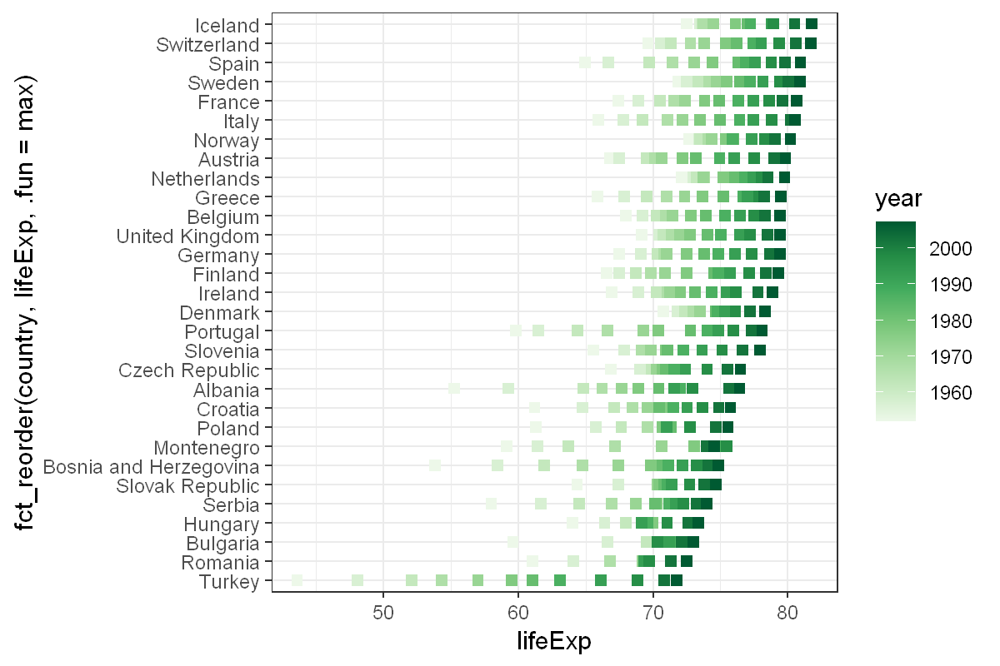

In [104]:
gapdata %>%
filter(continent == "Europe") %>%
ggplot(aes(y = fct_reorder(country, lifeExp, .fun=max),
           x = lifeExp,
           colour = year)) +
geom_point(shape = 15, size = 2) +
scale_colour_distiller(palette = "Greens", direction = 1) +
theme_bw()

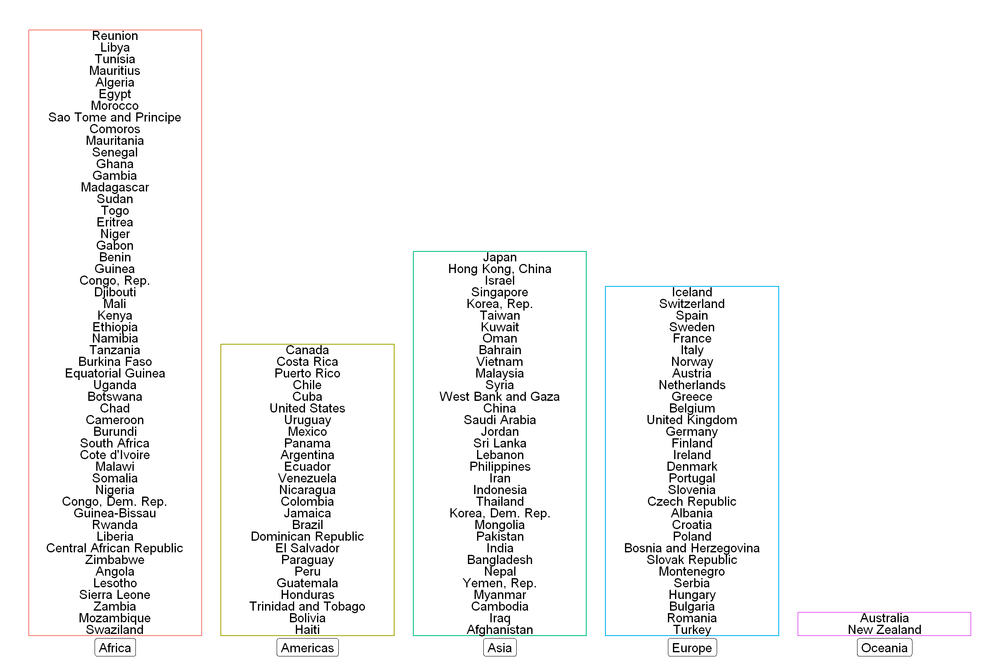

In [105]:
options(repr.plot.width =12, repr.plot.height = 8, repr.plot.res = 200)

gapdata2007 %>%  arrange(lifeExp)  %>% 
group_by(continent) %>%
mutate(country_number = seq_along(country))  %>% 
ggplot(aes(x = continent)) +
geom_bar(aes(colour = continent), fill = NA, show.legend = FALSE) +
geom_text(aes(y = country_number, label = country), vjust = 1)+
geom_label(aes(label = continent), y = -1) +
theme_void()

`geom_smooth()` using formula = 'y ~ x'


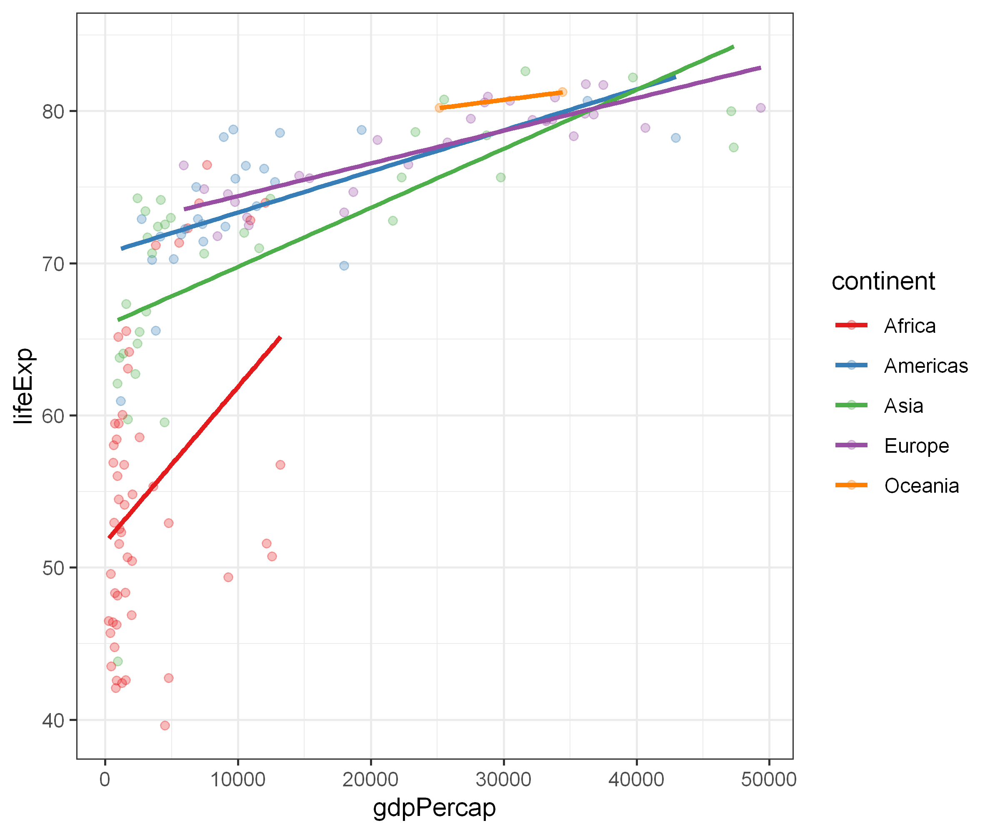

In [106]:
options(repr.plot.width =6, repr.plot.height = 5, repr.plot.res = 400)

p0 <- gapminder %>%
filter(year == 2007) %>%
ggplot(aes(y = lifeExp, x = gdpPercap, colour = continent)) +
geom_point(alpha = 0.3) +
theme_bw() +
geom_smooth(method = "lm", se = FALSE) +
scale_colour_brewer(palette = "Set1")
p0

`geom_smooth()` using formula = 'y ~ x'


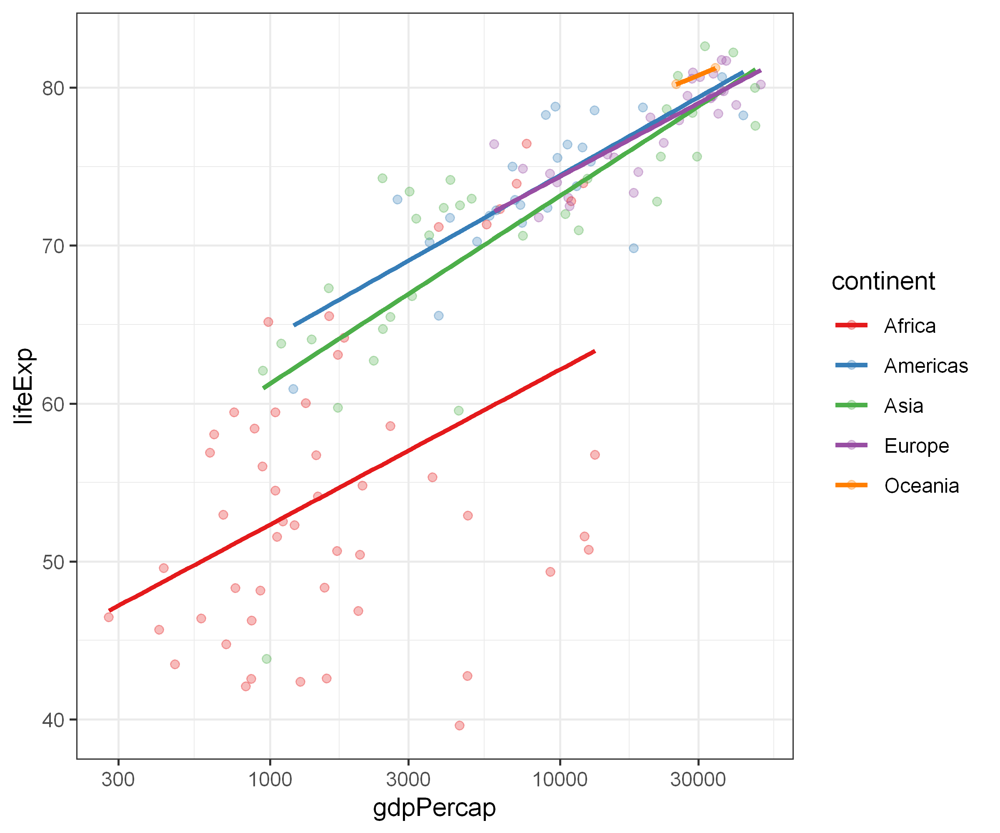

In [107]:
p1 <- p0 + scale_x_log10() 
p1

`geom_smooth()` using formula = 'y ~ x'


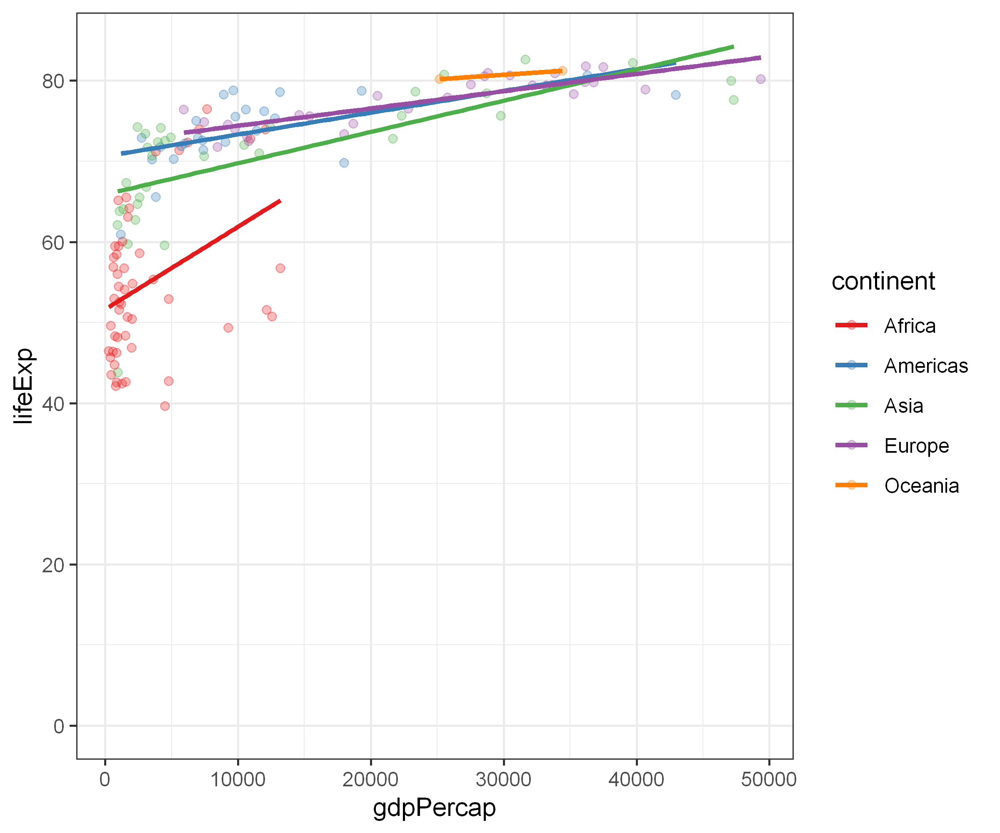

In [108]:
p2 <- p0 + expand_limits(y = 0)
p2

`geom_smooth()` using formula = 'y ~ x'


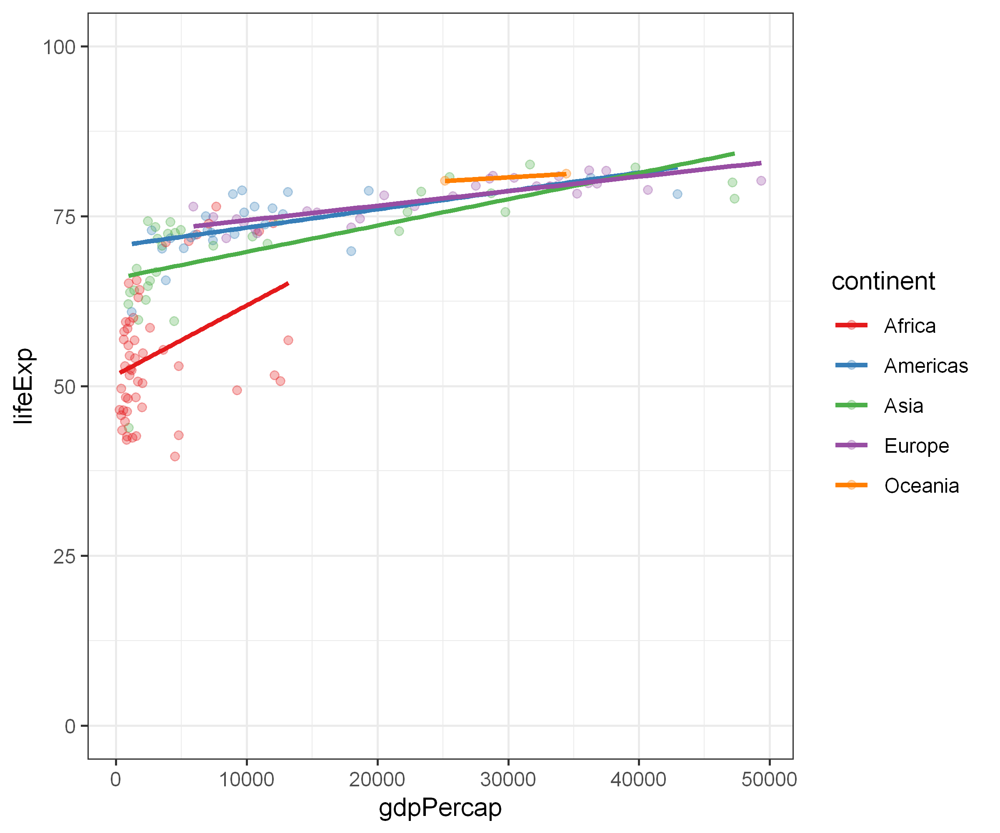

In [109]:
p3 <- p0 + expand_limits(y = c(0, 100))
p3

In [110]:
p4 <- p0 +
expand_limits(y = c(0, 100)) +
coord_cartesian(expand = FALSE)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


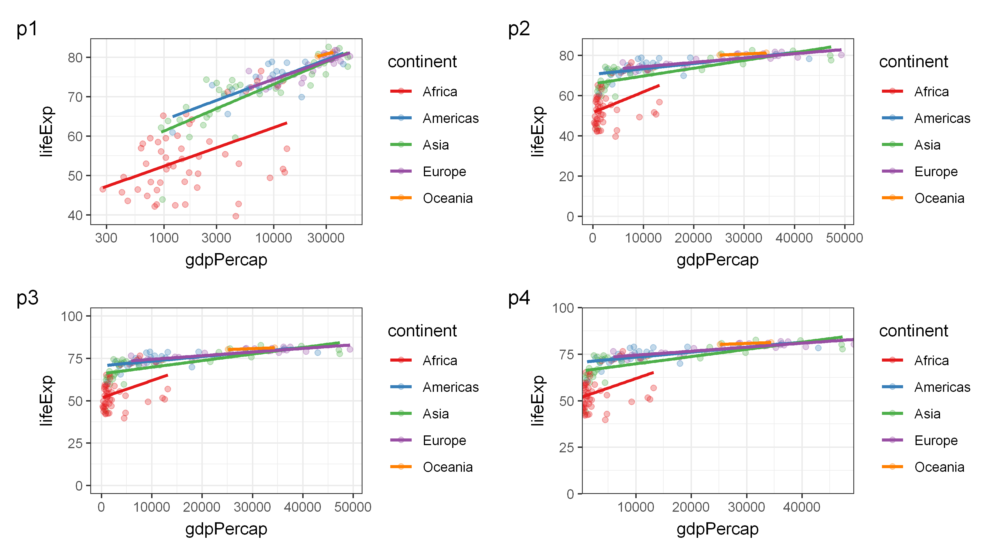

In [111]:
library(patchwork)
options(repr.plot.width =9, repr.plot.height = 5, repr.plot.res = 400)
p1 + p2 + p3 + p4 + plot_annotation(tag_levels = "1", tag_prefix = "p")


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
"Removed 114 rows containing non-finite values (`stat_smooth()`)."
Warning message:
"Removed 114 rows containing missing values (`geom_point()`)."


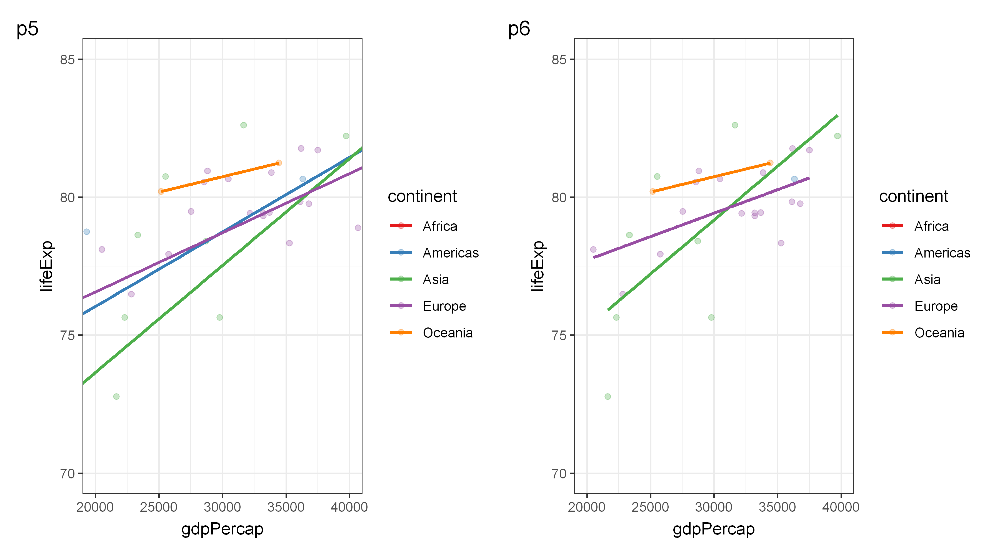

In [112]:
p5 <- p0 +
coord_cartesian(ylim = c(70, 85), xlim = c(20000, 40000))
p6 <- p0 +
scale_y_continuous(limits = c(70, 85)) +
scale_x_continuous(limits = c(20000, 40000))
p5 + labs(tag = "p5") + p6 + labs(tag = "p6")

In [113]:
# calculating the maximum value to be included in the axis breaks:
max_value = gapminder %>%
filter(year == 2007) %>%
summarise(max_lifeExp = max(lifeExp)) %>%
pull(max_lifeExp) %>%
round(1)
max_value

[1] 82.6

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


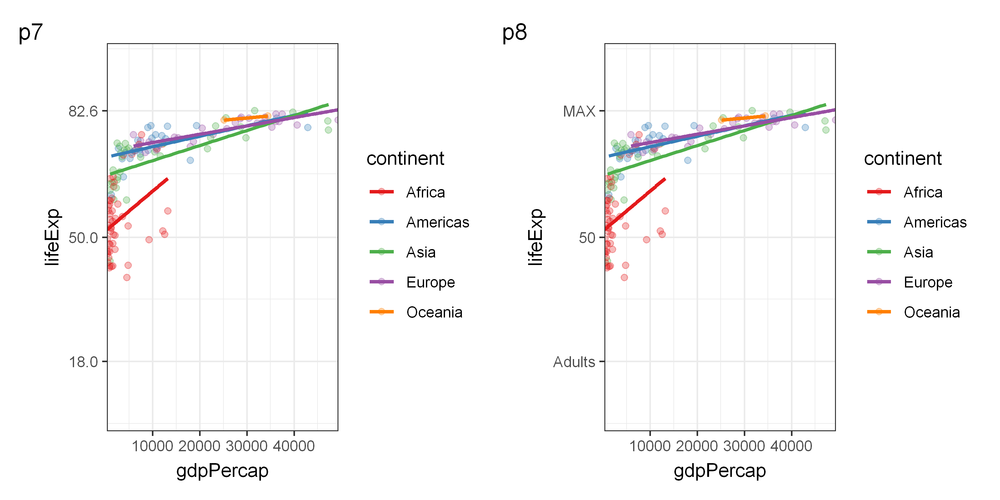

In [114]:
options(repr.plot.width =8, repr.plot.height = 4, repr.plot.res = 400)

# using scale_y_continuous(breaks = ...):
p7 <- p0 +
coord_cartesian(ylim = c(0, 100), expand = 0) +
scale_y_continuous(breaks = c(18, 50, max_value))
# we may also include custom labels for our breaks:
p8 <- p0 +
coord_cartesian(ylim = c(0, 100), expand = 0) +
scale_y_continuous(breaks = c(18, 50, max_value), labels = c("Adults", "50", "MAX"))
p7 + labs(tag = "p7") + p8 + labs(tag = "p8")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
`geom_smooth()` using formula = 'y ~ x'


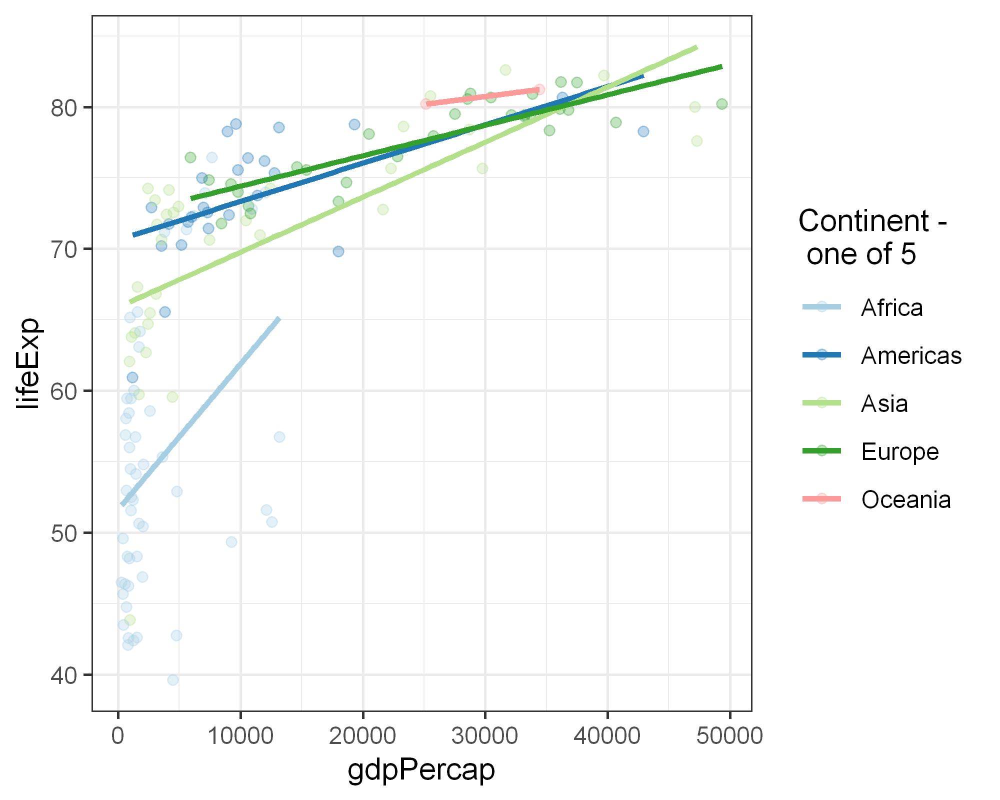

In [115]:
options(repr.plot.width =5, repr.plot.height = 4, repr.plot.res = 400)

p10 <- p0 +
scale_color_brewer("Continent - \n one of 5", palette = "Paired")
p10

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


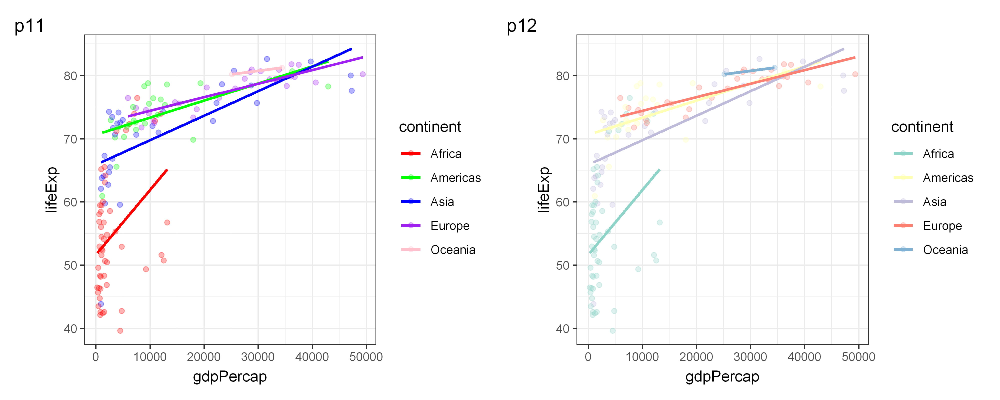

In [116]:
options(repr.plot.width =10, repr.plot.height = 4, repr.plot.res = 400)

p11 <- p0 +
scale_color_manual(values = c("red", "green", "blue", "purple", "pink"))

p12 <- p0 +
scale_color_manual(values = c("#8dd3c7", "#ffffb3", "#bebada",
"#fb8072", "#80b1d3"))
p11 + labs(tag = "p11") + p12 + labs(tag = "p12")


`geom_smooth()` using formula = 'y ~ x'


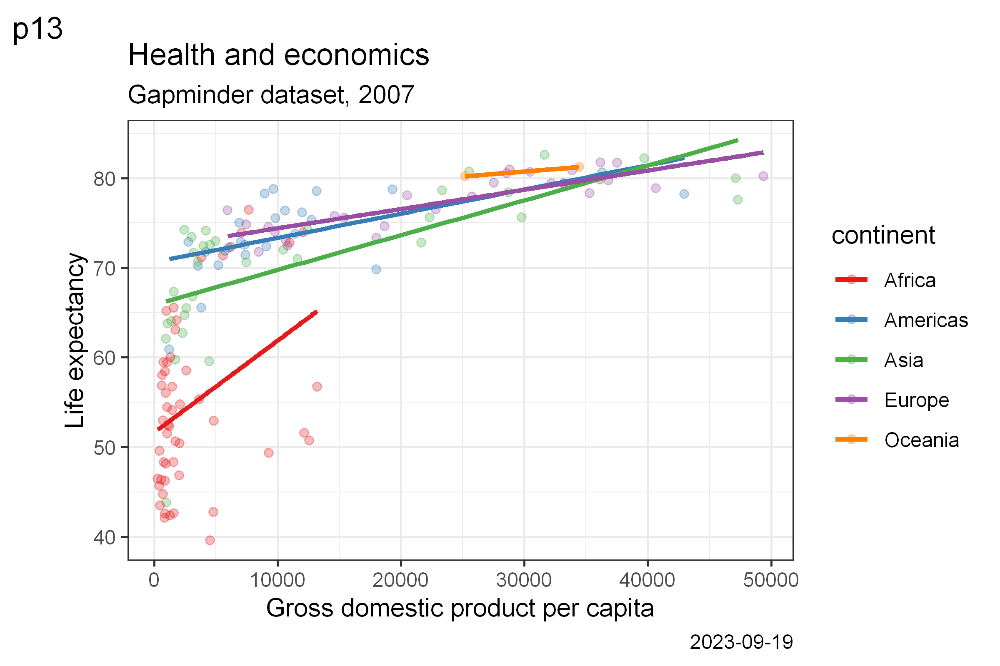

In [117]:
options(repr.plot.width =6, repr.plot.height = 4, repr.plot.res = 400)

p13 <- p0 +
labs(x = "Gross domestic product per capita",
y = "Life expectancy",
title = "Health and economics",
subtitle = "Gapminder dataset, 2007",
caption = Sys.Date(),
tag = "p13")
p13

`geom_smooth()` using formula = 'y ~ x'


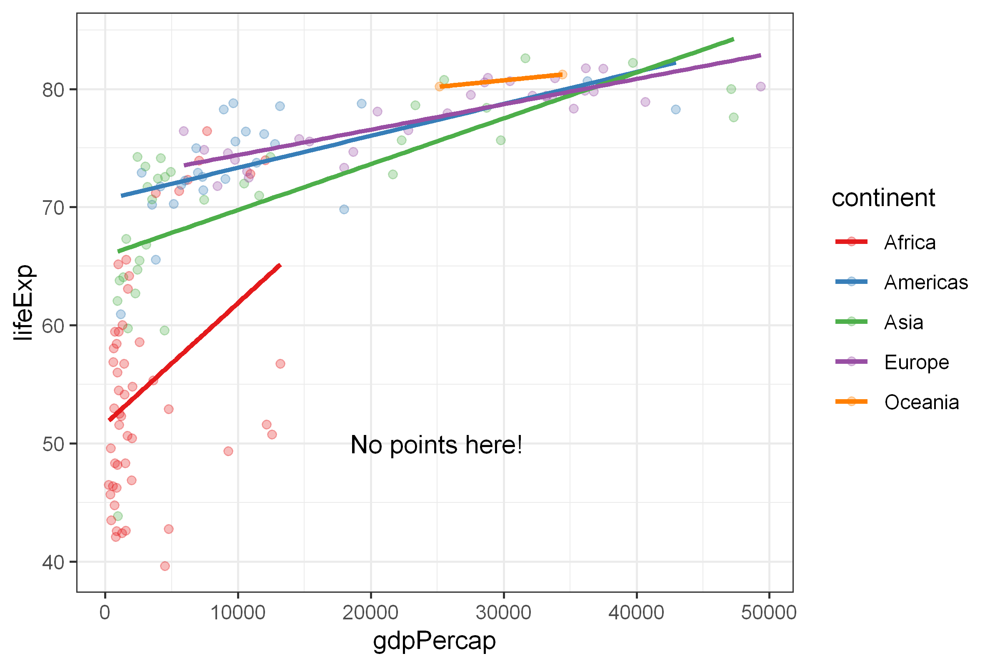

In [118]:
p14 <- p0 +
annotate("text",
x = 25000,
y = 50,
label = "No points here!")
p14

`geom_smooth()` using formula = 'y ~ x'


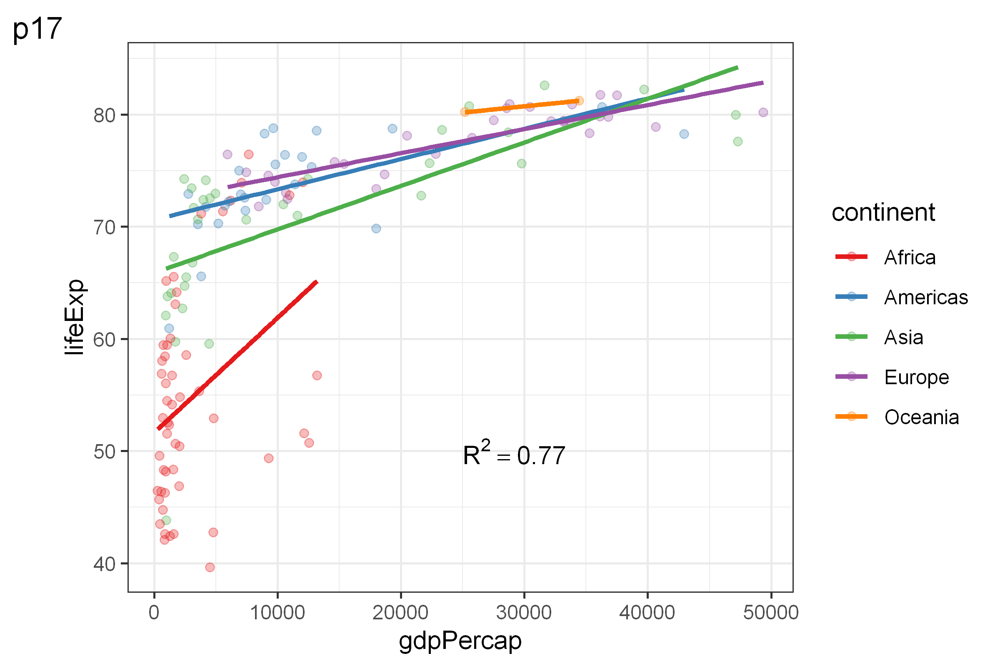

In [119]:
    # a value we made up for this example
# a real analysis would get it from the linear model object
fit_glance <- tibble(r.squared = 0.7693465)
plot_rsquared <- paste0(
"R^2 == ",
fit_glance$r.squared %>% round(2))
p17 <- p0 +
annotate("text",
x = 25000,
y = 50,
label = plot_rsquared, parse = TRUE,
hjust = 0)
p17 + labs(tag = "p17")

`geom_smooth()` using formula = 'y ~ x'


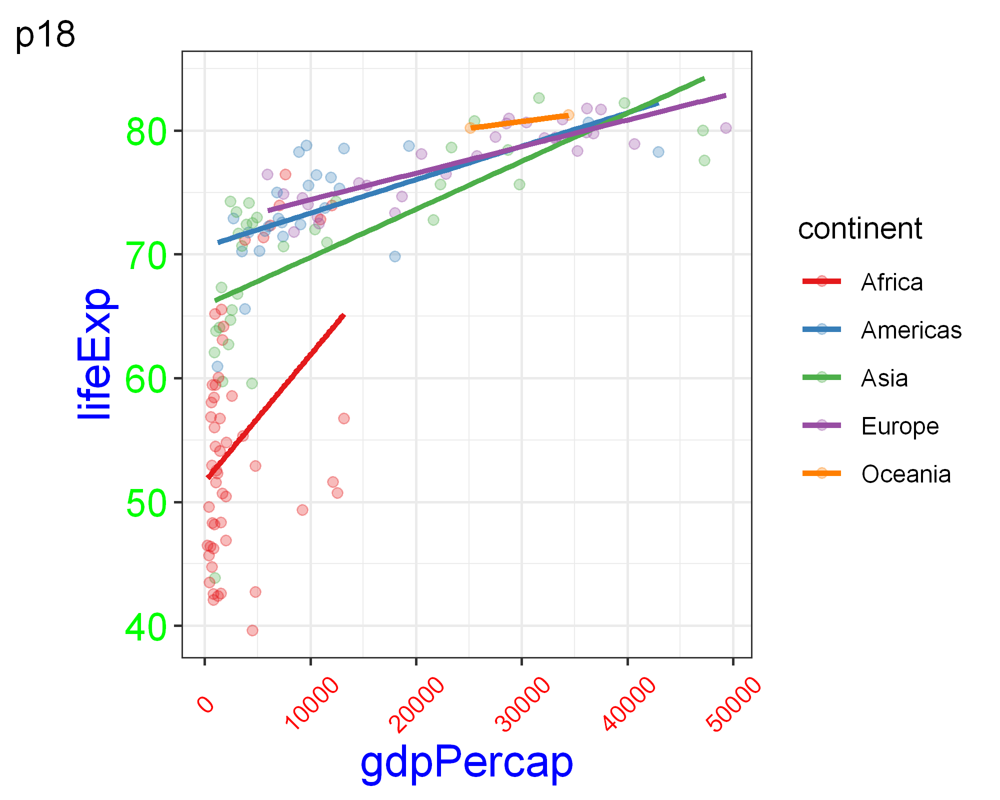

In [120]:
options(repr.plot.width =5, repr.plot.height = 4, repr.plot.res = 400)
p18 <- p0 +
theme(axis.text.y = element_text(colour = "green", size = 14),
axis.text.x = element_text(colour = "red", angle = 45, vjust = 0.5),
axis.title = element_text(colour = "blue", size = 16)
)
p18 + labs(tag = "p18")


`geom_smooth()` using formula = 'y ~ x'


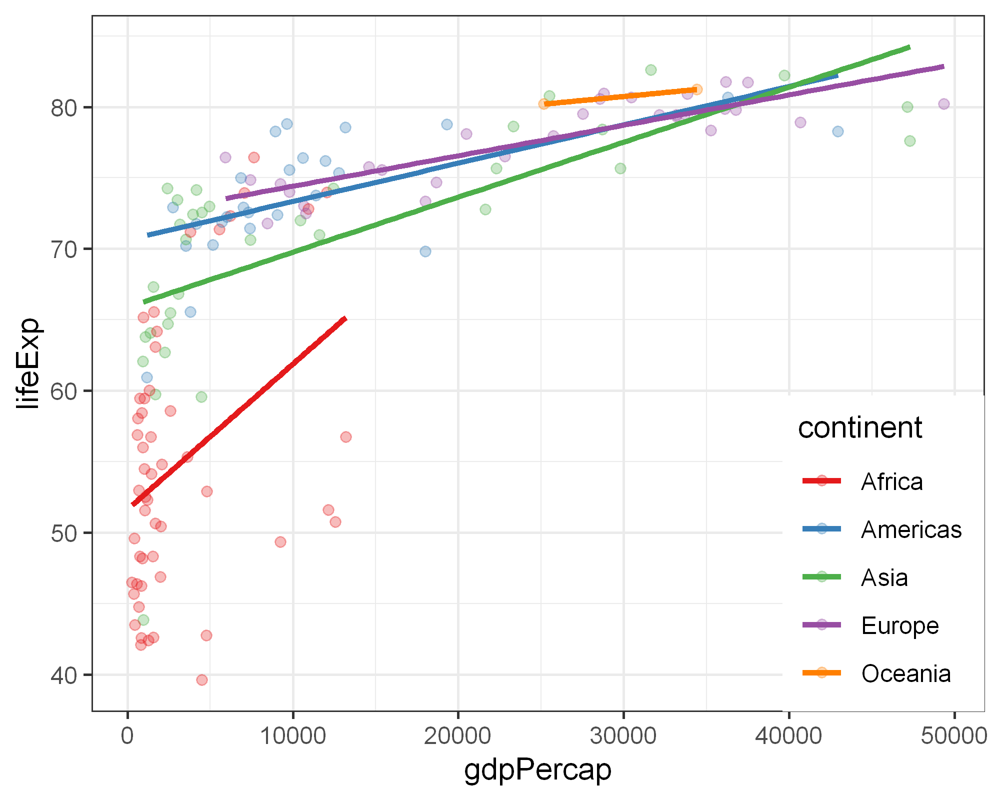

In [121]:
p20 <- p0 +
theme(legend.position = c(1,0), #bottom-right corner
legend.justification = c(1,0))

p20

`geom_smooth()` using formula = 'y ~ x'


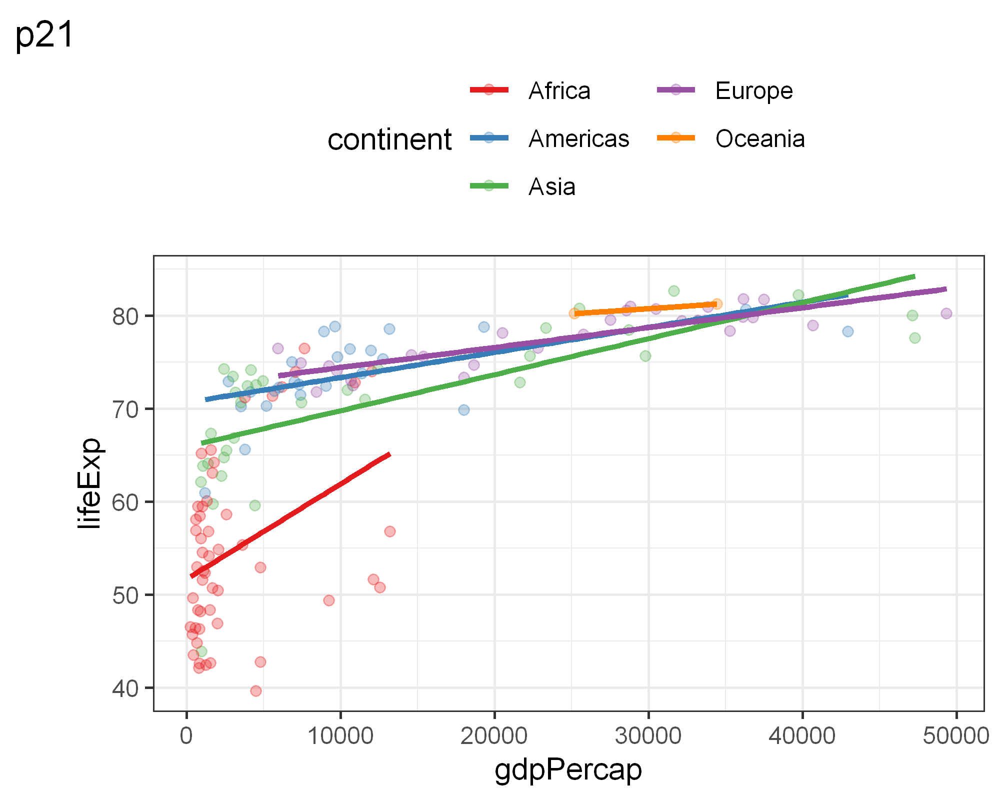

In [122]:
p21 <- p0 +
guides(colour = guide_legend(ncol = 2)) +
theme(legend.position = "top") # moving to the top optional
p21 + labs(tag = "p21")


# ~ Data analysis

emphasise the importance of understanding the underlying data
through visualisation, rather than relying on statistical tests or, heaven forbid,
the p-value alone

In [123]:
glimpse(gapdata)

Rows: 1,704
Columns: 6
$ country   <fct> "Afghanistan", "Afghanistan", "Afghanistan", "Afghanistan", …
$ continent <fct> Asia, Asia, Asia, Asia, Asia, Asia, Asia, Asia, Asia, Asia, …
$ year      <int> 1952, 1957, 1962, 1967, 1972, 1977, 1982, 1987, 1992, 1997, …
$ lifeExp   <dbl> 28.801, 30.332, 31.997, 34.020, 36.088, 38.438, 39.854, 40.8…
$ pop       <int> 8425333, 9240934, 10267083, 11537966, 13079460, 14880372, 12…
$ gdpPercap <dbl> 779.4453, 820.8530, 853.1007, 836.1971, 739.9811, 786.1134, …


In [124]:
missing_glimpse(gapdata)

,label,var_type,n,missing_n,missing_percent
,<chr>,<chr>,<int>,<int>,<chr>
country,country,<fct>,1704,0,0.0
continent,continent,<fct>,1704,0,0.0
year,year,<int>,1704,0,0.0
lifeExp,lifeExp,<dbl>,1704,0,0.0
pop,pop,<int>,1704,0,0.0
gdpPercap,gdpPercap,<dbl>,1704,0,0.0


In [125]:
ff_glimpse(gapdata)

Warning message:
"`fct_explicit_na()` was deprecated in forcats 1.0.0.
ℹ Please use `fct_na_value_to_level()` instead.
ℹ The deprecated feature was likely used in the finalfit package.
  Please report the issue at <https://github.com/ewenharrison/finalfit/issues>."


$Continuous
              label var_type    n missing_n missing_percent       mean
year           year    <int> 1704         0             0.0     1979.5
lifeExp     lifeExp    <dbl> 1704         0             0.0       59.5
pop             pop    <int> 1704         0             0.0 29601212.3
gdpPercap gdpPercap    <dbl> 1704         0             0.0     7215.3
                   sd     min quartile_25    median quartile_75          max
year             17.3  1952.0      1965.8    1979.5      1993.2       2007.0
lifeExp          12.9    23.6        48.2      60.7        70.8         82.6
pop       106157896.7 60011.0   2793664.0 7023595.5  19585221.8 1318683096.0
gdpPercap      9857.5   241.2      1202.1    3531.8      9325.5     113523.1

$Categorical
              label var_type    n missing_n missing_percent levels_n
country     country    <fct> 1704         0             0.0      142
continent continent    <fct> 1704         0             0.0        5
                                                     levels
country                                                   -
continent "Africa", "Americas", "Asia", "Europe", "Oceania"
                    levels_count               levels_percent
country                        -                            -
continent 624, 300, 396, 360, 24 36.6, 17.6, 23.2, 21.1,  1.4

Always plot your data first. Never skip this step!
We are particularly interested in the distribution. There’s that word again.
The shape of the data. Is it normal? Is it skewed? Does it differ between
regions and years?


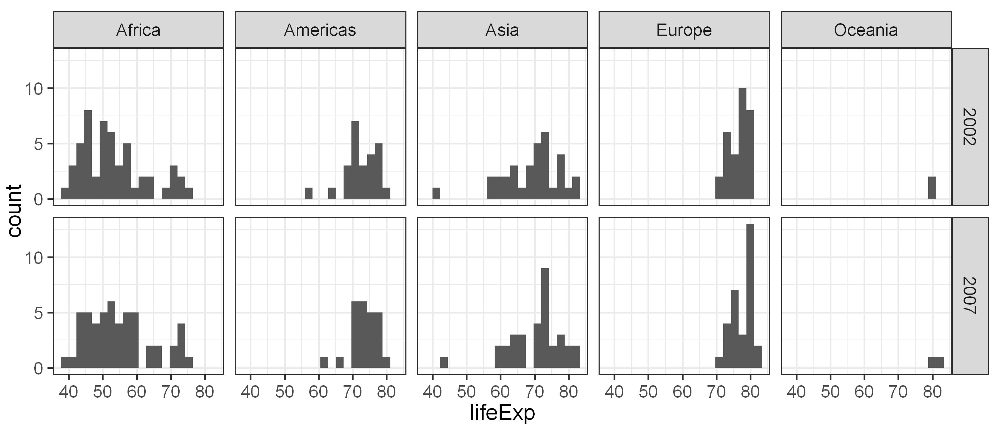

In [126]:
options(repr.plot.width =7, repr.plot.height = 3, repr.plot.res = 400)
gapdata %>%
filter(year %in% c(2002, 2007)) %>%
ggplot(aes(x = lifeExp)) + # remember aes()
geom_histogram(bins = 20) + # histogram with 20 bars
facet_grid(year ~ continent) # optional: add scales="free"

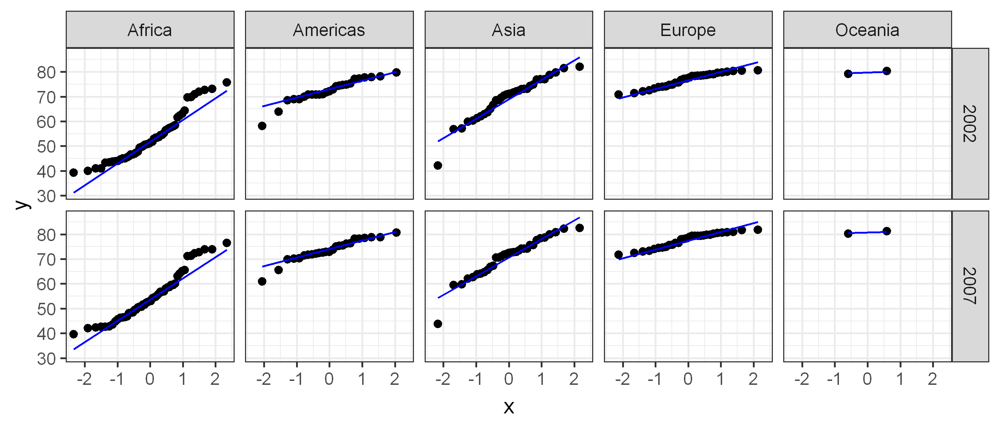

In [127]:
gapdata %>%
filter(year %in% c(2002, 2007)) %>%
ggplot(aes(sample = lifeExp)) + # Q-Q plot requires 'sample'
geom_qq() + # defaults to normal distribution
geom_qq_line(colour = "blue") + # add the theoretical line
facet_grid(year ~ continent)

A Q-Q plot simply plots the quantiles for our data against the theoretical
quantiles for a particular distribution (the default shown below is the normal
distribution). If our data follow that distribution (e.g., normal), then our data
points fall on the theoretical straight line.

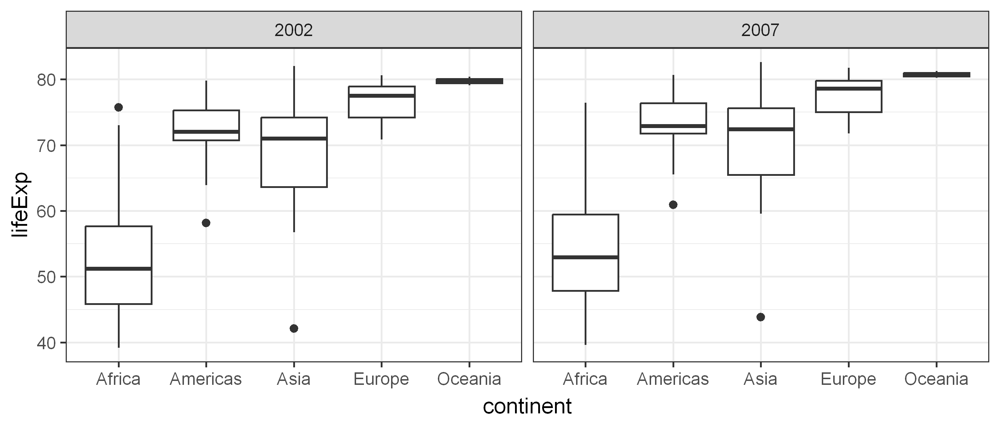

In [128]:
gapdata %>%
filter(year %in% c(2002, 2007)) %>%
ggplot(aes(x = continent, y = lifeExp)) +
geom_boxplot() +
facet_wrap(~ year)

The data in Africa looks skewed, particularly in 2002 -
**the lines/whiskers are unequal lengths.**

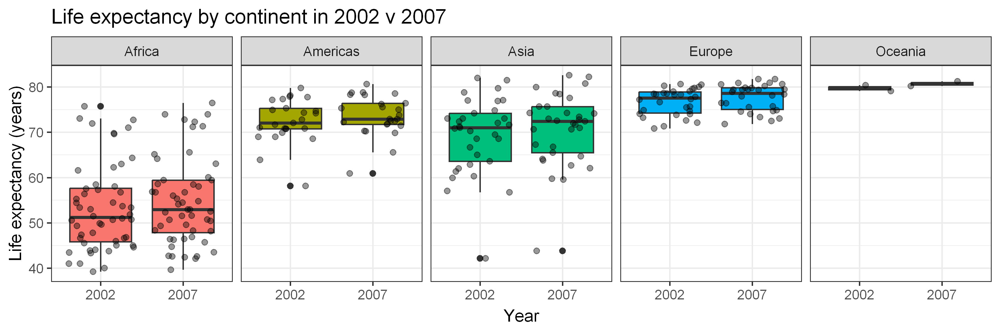

In [129]:
options(repr.plot.width =9, repr.plot.height = 3, repr.plot.res = 400)

gapdata %>%
filter(year %in% c(2002, 2007)) %>%
ggplot(aes(x = factor(year), y = lifeExp)) +
geom_boxplot(aes(fill = continent)) + # add colour to boxplots
geom_jitter(alpha = 0.4) + # alpha = transparency
facet_wrap(~ continent, ncol = 5) + # spread by continent
theme(legend.position = "none") + # remove legend
xlab("Year") + # label x-axis
ylab("Life expectancy (years)") + # label y-axis
ggtitle("Life expectancy by continent in 2002 v 2007") # add title

 The most useful
in our context is a two-sample test of independent groups. Repeated-measures
data, such as comparing the same countries in different years, can be analysed
using a paired t-test.

In [130]:
ttest_data <- gapdata %>% # save as object ttest_data
filter(year == 2007) %>% # 2007 only
filter(continent %in% c("Asia", "Europe")) # Asia/Europe only

ttest_result <- ttest_data %>% # example using pipe
t.test(lifeExp ~ continent, data = .) # note data = ., see below
ttest_result


	Welch Two Sample t-test

data:  lifeExp by continent
t = -4.6468, df = 41.529, p-value = 3.389e-05
alternative hypothesis: true difference in means between group Asia and group Europe is not equal to 0
95 percent confidence interval:
 -9.926525 -3.913705
sample estimates:
  mean in group Asia mean in group Europe 
            70.72848             77.64860 


The Welch two-sample t-test is the most flexible and copes with differences
in variance (variability) between groups, as in this example.

In [131]:
ttest_result$p.value # Extracted element of result object

[1] 3.38922e-05

In [132]:
ttest_result$conf.int # Extracted element of result object

[1] -9.926525 -3.913705
attr(,"conf.level")
[1] 0.95

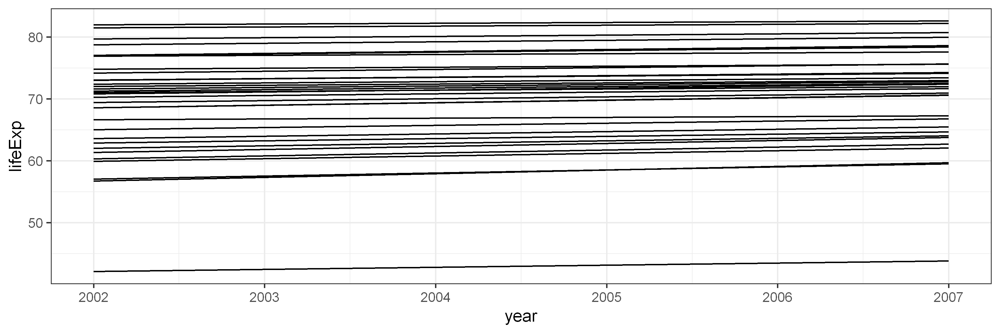

In [133]:
paired_data <- gapdata %>% # save as object paired_data
filter(year %in% c(2002, 2007)) %>% # 2002 and 2007 only
filter(continent == "Asia") # Asia only
paired_data %>%
ggplot(aes(x = year, y = lifeExp,group = country)) + # for individual country lines
geom_line()

In [134]:
paired_table <- paired_data %>% # save object paired_data
select(country, year, lifeExp) %>% # select vars interest
pivot_wider(names_from = year, # put years in columns
values_from = lifeExp) %>%
mutate(dlifeExp = `2007` - `2002`)# difference in means
paired_table

country,2002,2007,dlifeExp
<fct>,<dbl>,<dbl>,<dbl>
Afghanistan,42.129,43.828,1.699
Bahrain,74.795,75.635,0.840
Bangladesh,62.013,64.062,2.049
Cambodia,56.752,59.723,2.971
China,72.028,72.961,0.933
"Hong Kong, China",81.495,82.208,0.713
India,62.879,64.698,1.819
Indonesia,68.588,70.650,2.062
Iran,69.451,70.964,1.513


In [135]:
# Mean of difference in years
paired_table %>% summarise( mean(dlifeExp) )

mean(dlifeExp)
<dbl>
1.494606


In [136]:
paired_data  %>% head()

country,continent,year,lifeExp,pop,gdpPercap
<fct>,<fct>,<int>,<dbl>,<int>,<dbl>
Afghanistan,Asia,2002,42.129,25268405,726.7341
Afghanistan,Asia,2007,43.828,31889923,974.5803
Bahrain,Asia,2002,74.795,656397,23403.5593
Bahrain,Asia,2007,75.635,708573,29796.0483
Bangladesh,Asia,2002,62.013,135656790,1136.3904
Bangladesh,Asia,2007,64.062,150448339,1391.2538


In [137]:
paired_data %>%
t.test(lifeExp ~ year, data = ., paired = TRUE)


	Paired t-test

data:  lifeExp by year
t = -14.338, df = 32, p-value = 1.758e-15
alternative hypothesis: true mean difference is not equal to 0
95 percent confidence interval:
 -1.706941 -1.282271
sample estimates:
mean difference 
      -1.494606 


**Compare the mean of one group: one sample t-tests**

In [138]:
library(broom)

In [139]:
gapdata %>%
filter(year == 2007) %>% # 2007 only
group_by(continent) %>% # split by continent
do( # dplyr function
t.test(.$lifeExp, mu = 77) %>% # compare mean to 77 years
tidy() # tidy into tibble
)

continent,estimate,statistic,p.value,parameter,conf.low,conf.high,method,alternative
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Africa,54.80604,-16.617857,3.149284e-22,51,52.12481,57.48726,One Sample t-test,two.sided
Americas,73.60812,-3.818870,8.316842e-04,24,71.77499,75.44125,One Sample t-test,two.sided
Asia,70.72848,-4.523902,7.881720e-05,32,67.90467,73.55230,One Sample t-test,two.sided
Europe,77.64860,1.192199,2.428480e-01,29,76.53592,78.76128,One Sample t-test,two.sided
Oceania,80.71950,7.215325,8.767311e-02,1,74.16945,87.26955,One Sample t-test,two.sided


Oceania’sconfidence intervals are especially wide
as the dataset only includes two countries. Therefore, we can’t conclude that
its value isn’t different to 77, but that we don’t have enough observations
and the estimate is uncertain. It doesn’t make sense to report the results of a
statistical test - whether the p-value is significant or not - without assessing
the confidence intervals.

In [140]:
# note that we're using dlifeExp
# so the differences we calculated above
t.test(paired_table$dlifeExp, mu = 0)


	One Sample t-test

data:  paired_table$dlifeExp
t = 14.338, df = 32, p-value = 1.758e-15
alternative hypothesis: true mean is not equal to 0
95 percent confidence interval:
 1.282271 1.706941
sample estimates:
mean of x 
 1.494606 


**Compare the means of more than two groups**

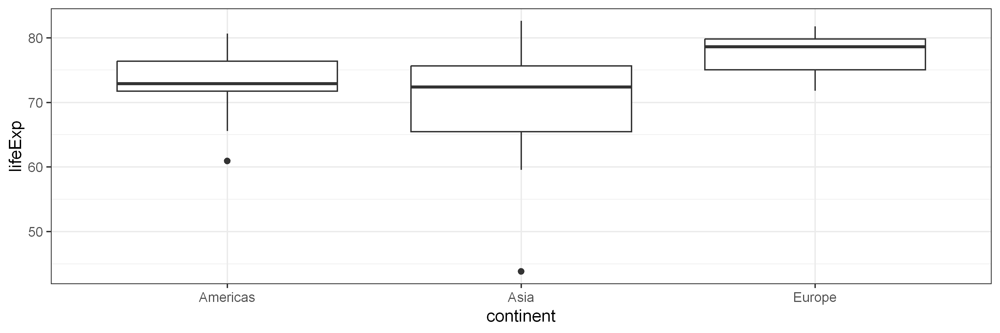

In [141]:
gapdata %>%
filter(year == 2007) %>%
filter(continent %in%
c("Americas", "Europe", "Asia")) %>%
ggplot(aes(x = continent, y=lifeExp)) +
geom_boxplot()

Analysis of variance is a collection of statistical tests which can be used to
test the difference in means between two or more groups.
In base R form, it produces an ANOVA table which includes an F-test. This
so-called omnibus test tells you whether there are any differences in the comparison of means of the included groups.

In [142]:
aov_data <- gapdata %>%
filter(year == 2007) %>%
filter(continent %in% c("Americas", "Europe", "Asia"))
fit = aov(lifeExp ~ continent, data = aov_data)
summary(fit)

            Df Sum Sq Mean Sq F value   Pr(>F)    
continent    2  755.6   377.8   11.63 3.42e-05 ***
Residuals   85 2760.3    32.5                     
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

We can conclude from the significant F-test that the mean life expectancy
across the three continents is not the same. This does not mean that all included groups are significantly different from each other

In [143]:
library(broom)
gapdata %>%
filter(year == 2007) %>%
filter(continent %in% c("Americas", "Europe", "Asia")) %>%
aov(lifeExp~continent, data = .) %>%
tidy()

term,df,sumsq,meansq,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
continent,2,755.6178,377.80892,11.63417,3.41973e-05
Residuals,85,2760.2966,32.47408,NA,NA


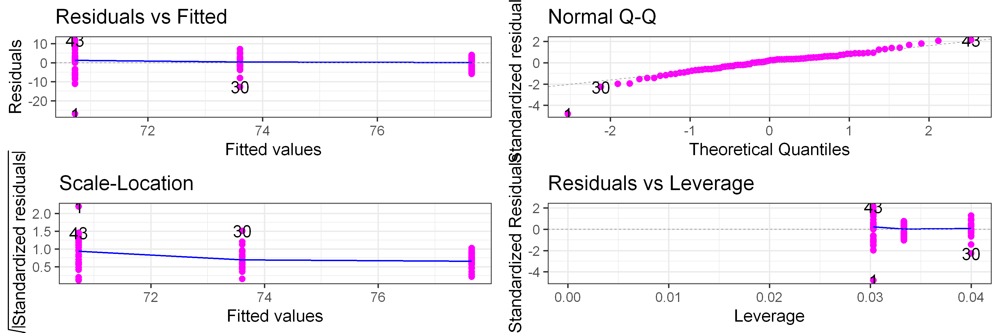

In [144]:
library(ggfortify)
autoplot(fit, colour = 'magenta', conf.int.colour = 'red')

When multiple statistical tests are performed simultaneously on a single data set, the chances of obtaining false positives increases. For example, if 20 different statistical tests are run on the same data, we would expect about 1 test to produce a falsely significant result just by random chance, even if the null hypothesis were true in all cases.

The Bonferroni correction helps address this by lowering the typical cutoff for statistical significance (usually denoted by alpha or p-value). It works by dividing the standard alpha level (often 0.05) by the number of comparisons made.

For example, if 20 comparisons are made, the Bonferroni corrected alpha level would be 0.05/20 = 0.0025. Now, a p-value of less than 0.0025 would be needed to consider a result statistically significant.

This makes it much less likely to incorrectly reject a true null hypothesis. The tradeoff is reduced power to detect real effects that are present.

The Bonferroni correction is a conservative approach, but helps ensure the familywise error rate is controlled when multiple comparisons pose a risk of false positives from data mining or chance findings

In [145]:
pairwise.t.test(aov_data$lifeExp, aov_data$continent,
                p.adjust.method = "bonferroni")


	Pairwise comparisons using t tests with pooled SD 

data:  aov_data$lifeExp and aov_data$continent 

       Americas Asia   
Asia   0.180    -      
Europe 0.031    1.9e-05

P value adjustment method: bonferroni 

**“know your data”, “be sensible, look at the effect size”**


In [146]:
pairwise.t.test(aov_data$lifeExp, aov_data$continent,
p.adjust.method = "fdr")


	Pairwise comparisons using t tests with pooled SD 

data:  aov_data$lifeExp and aov_data$continent 

       Americas Asia   
Asia   0.060    -      
Europe 0.016    1.9e-05

P value adjustment method: fdr 

In [147]:
pairwise.t.test(aov_data$lifeExp, aov_data$continent,
p.adjust.method = "fdr")


	Pairwise comparisons using t tests with pooled SD 

data:  aov_data$lifeExp and aov_data$continent 

       Americas Asia   
Asia   0.060    -      
Europe 0.016    1.9e-05

P value adjustment method: fdr 

For instance, if you are examining length of hospital stay it is likely that your
data are highly right skewed - most patients are discharged from hospital in
a few days while a smaller number stay for a long time. Is a comparison of
means ever going to be the correct approach here? Perhaps you should consider
a **time-to-event analysis** for instance

1. Transform the data;
2. Perform non-parametric tests.


Remember, the Welch t-test is reasonably robust to divergence from the normality assumption, so small deviations can be safely ignored.
Otherwise, the data can be transformed to another scale to deal with a skew.
A natural log scale is common.



Moderate right skew (+) Square-root sqrt()

Substantial right skew (++) Natural log* log()

Substantial right skew (+++) Base-10 log* log10()

In [148]:
africa2002 <- gapdata %>% # save as africa2002
filter(year == 2002) %>% # only 2002
filter(continent == "Africa") %>% # only Africa
select(country, lifeExp) %>% # only these variables
mutate(lifeExp_log = log(lifeExp)) # log life expectancy)
head(africa2002)

country,lifeExp,lifeExp_log
<fct>,<dbl>,<dbl>
Algeria,70.994,4.262595
Angola,41.003,3.713645
Benin,54.406,3.996474
Botswana,46.634,3.842330
Burkina Faso,50.650,3.924939
Burundi,47.360,3.857778


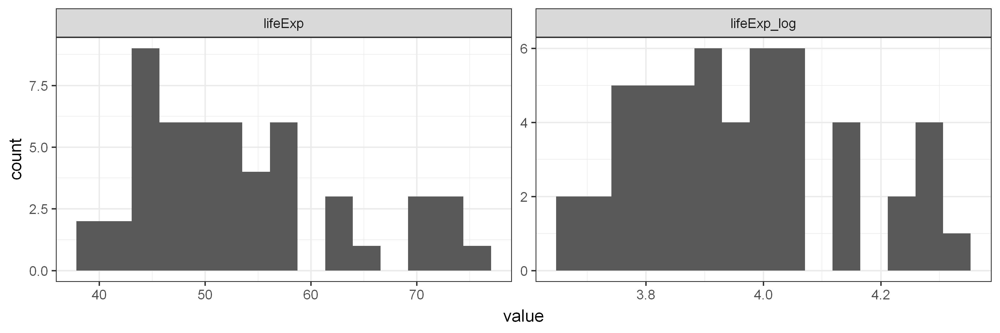

In [149]:
africa2002 %>%
# pivot lifeExp and lifeExp_log values to same column (for easy plotting):
pivot_longer(contains("lifeExp")) %>%
ggplot(aes(x = value)) +
geom_histogram(bins = 15) + # make histogram
facet_wrap(~name, scales = "free") # facet with axes free to vary


## Non Parametric test

The Mann-Whitney U test is also called the Wilcoxon rank-sum test and
uses a rank-based method to compare two groups (note the Wilcoxon signedrank test is for paired data). Rank-based just means ordering your grouped
continuous data from smallest to largest value and assigning a rank (1, 2, 3
…) to each measurement.
We can use it to test for a difference in life expectancies for African countries
between 1982 and 2007

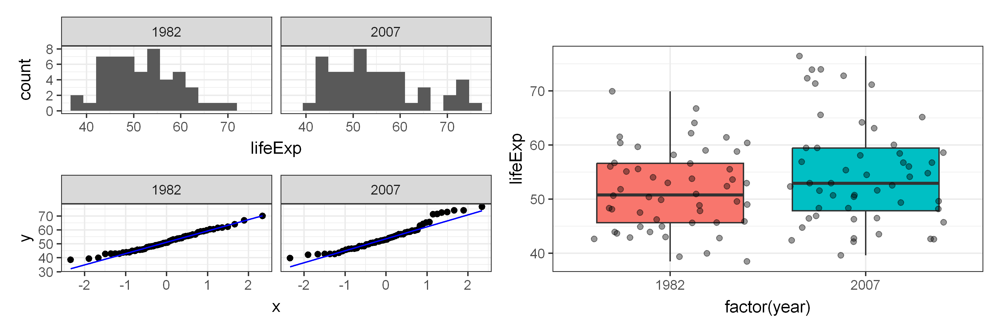

In [150]:
africa_data <- gapdata %>%
filter(year %in% c(1982, 2007)) %>% # only 1982 and 2007
filter(continent %in% c("Africa")) # only Africa
p1 <- africa_data %>% # save plot as p1
ggplot(aes(x = lifeExp)) +
geom_histogram(bins = 15) +
facet_wrap(~year)

p2 <- africa_data %>% # save plot as p2
ggplot(aes(sample = lifeExp)) + # `sample` for Q-Q plot
geom_qq() +
geom_qq_line(colour = "blue") +
facet_wrap(~year)
p3 <- africa_data %>% # save plot as p3
ggplot(aes(x = factor(year), # try without factor(year) to
y = lifeExp)) + # see the difference
geom_boxplot(aes(fill = factor(year))) + # colour boxplot
geom_jitter(alpha = 0.4) + # add data points
theme(legend.position = "none") # remove legend
library(patchwork) # great for combining plots
p1 / p2 | p3


In [151]:
glimpse(africa_data)

Rows: 104
Columns: 6
$ country   <fct> "Algeria", "Algeria", "Angola", "Angola", "Benin", "Benin", …
$ continent <fct> Africa, Africa, Africa, Africa, Africa, Africa, Africa, Afri…
$ year      <int> 1982, 2007, 1982, 2007, 1982, 2007, 1982, 2007, 1982, 2007, …
$ lifeExp   <dbl> 61.368, 72.301, 39.942, 42.731, 50.904, 56.728, 61.484, 50.7…
$ pop       <int> 20033753, 33333216, 7016384, 12420476, 3641603, 8078314, 970…
$ gdpPercap <dbl> 5745.1602, 6223.3675, 2756.9537, 4797.2313, 1277.8976, 1441.…


In [152]:
africa_data %>%
wilcox.test(lifeExp ~ year, data = .)


	Wilcoxon rank sum test with continuity correction

data:  lifeExp by year
W = 1130, p-value = 0.1499
alternative hypothesis: true location shift is not equal to 0


The non-parametric equivalent to ANOVA, is the Kruskal-Wallis test

In [153]:
library(broom)
gapdata %>%
filter(year == 2007) %>%
filter(continent %in% c("Americas", "Europe", "Asia")) %>%
kruskal.test(lifeExp~continent, data = .) %>%
tidy()

statistic,p.value,parameter,method
<dbl>,<dbl>,<int>,<chr>
21.61837,2.021298e-05,2,Kruskal-Wallis rank sum test


In [154]:
dependent <- "year"
explanatory <- c("lifeExp", "pop", "gdpPercap")
africa_data %>%
mutate(year = factor(year)) %>%
summary_factorlist(dependent, explanatory,
cont = "median", p = TRUE)

label,levels,1982,2007,p
<chr>,<chr>,<chr>,<chr>,<chr>
lifeExp,Median (IQR),50.8 (45.6 to 56.6),52.9 (47.8 to 59.4),0.149
pop,Median (IQR),5668228.5 (1569553.8 to 9788207.8),10093310.5 (2909226.5 to 19363654.5),0.033
gdpPercap,Median (IQR),1323.7 (828.7 to 2787.6),1452.3 (863.0 to 3993.5),0.503


In [155]:
explanatory <- c("lifeExp", "pop", "gdpPercap")
africa_data %>%
mutate(year = factor(year)) %>%
summary_factorlist(dependent, explanatory,cont_nonpara = c(1, 3), # variable 1&3 are non-parametric
cont_range = TRUE, # lower and upper quartile
p = TRUE, # include hypothesis test
p_cont_para = "t.test", # use t.test/aov for parametric
add_row_totals = TRUE, # row totals
include_row_missing_col = FALSE, # missing values row totals
add_dependent_label = TRUE) # dependent label

Dependent: year,Total N,,1982,2007,p
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
lifeExp,104 (100.0),Median (IQR),50.8 (45.6 to 56.6),52.9 (47.8 to 59.4),0.149
pop,104 (100.0),Mean (SD),9602857.4 (13456243.4),17875763.3 (24917726.2),0.038
gdpPercap,104 (100.0),Median (IQR),1323.7 (828.7 to 2787.6),1452.3 (863.0 to 3993.5),0.503


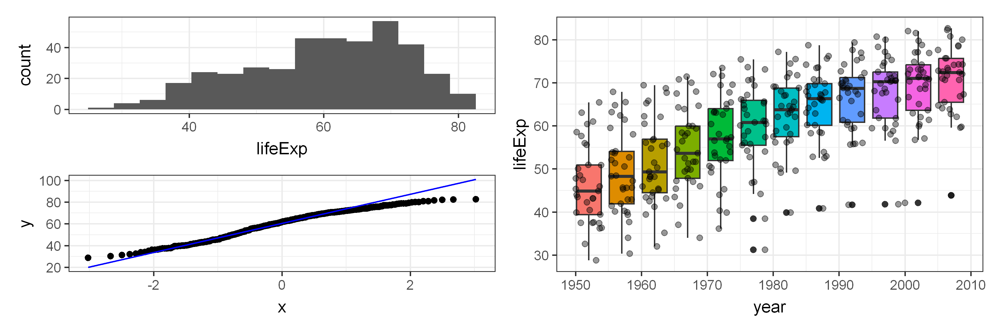

In [156]:
asia_data <- gapdata %>%
filter(continent %in% c("Asia"))
p1 <- asia_data %>%
ggplot(aes(x = lifeExp)) +
geom_histogram(bins = 15)

p2 <- asia_data %>%
ggplot(aes(sample = lifeExp)) + # sample = for Q-Q plot
geom_qq() +
geom_qq_line(colour = "blue")

p3 <- asia_data %>%
ggplot(aes(x = year, y = lifeExp)) +
geom_boxplot(aes(fill = factor(year))) + # optional: year as factor
geom_jitter(alpha = 0.4) +
theme(legend.position = "none")


p1 / p2 | p3

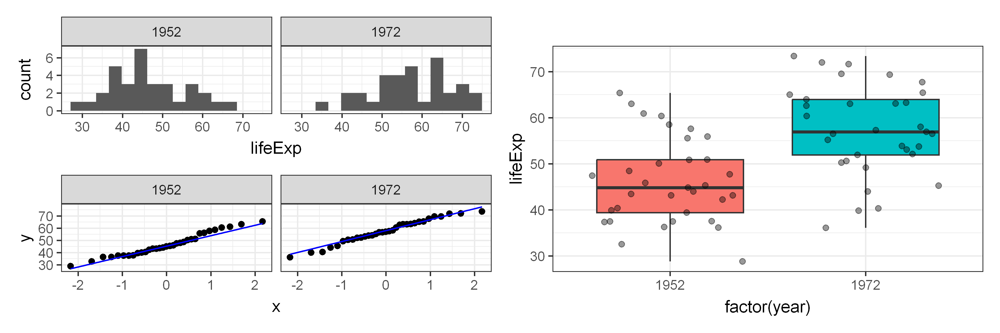

In [157]:
asia_2years <- asia_data %>%
filter(year %in% c(1952, 1972))

p1 <- asia_2years %>%
ggplot(aes(x = lifeExp)) +
geom_histogram(bins = 15) +
facet_wrap(~year)

p2 <- asia_2years %>%
ggplot(aes(sample = lifeExp)) +
geom_qq() +
geom_qq_line(colour = "blue") +
facet_wrap(~year)

p3 <- asia_2years %>%
ggplot(aes(x = factor(year), y = lifeExp)) +
geom_boxplot(aes(fill = factor(year))) +
geom_jitter(alpha = 0.4) +
theme(legend.position = "none")
library(patchwork)
p1 / p2 | p3


In [158]:
asia_2years %>%
t.test(lifeExp ~ year, data = .)


	Welch Two Sample t-test

data:  lifeExp by year
t = -4.7007, df = 63.869, p-value = 1.428e-05
alternative hypothesis: true difference in means between group 1952 and group 1972 is not equal to 0
95 percent confidence interval:
 -15.681981  -6.327769
sample estimates:
mean in group 1952 mean in group 1972 
          46.31439           57.31927 


In [159]:
gapdata %>%
filter(year == 2007) %>%
group_by(continent) %>%
do(t.test(.$lifeExp, mu = 70) %>%
tidy()
)

continent,estimate,statistic,p.value,parameter,conf.low,conf.high,method,alternative
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Africa,54.80604,-11.3765663,1.325523e-15,51,52.12481,57.48726,One Sample t-test,two.sided
Americas,73.60812,4.0623312,4.500690e-04,24,71.77499,75.44125,One Sample t-test,two.sided
Asia,70.72848,0.5254861,6.028679e-01,32,67.90467,73.55230,One Sample t-test,two.sided
Europe,77.64860,14.0589736,1.764715e-14,29,76.53592,78.76128,One Sample t-test,two.sided
Oceania,80.71950,20.7943744,3.059143e-02,1,74.16945,87.26955,One Sample t-test,two.sided


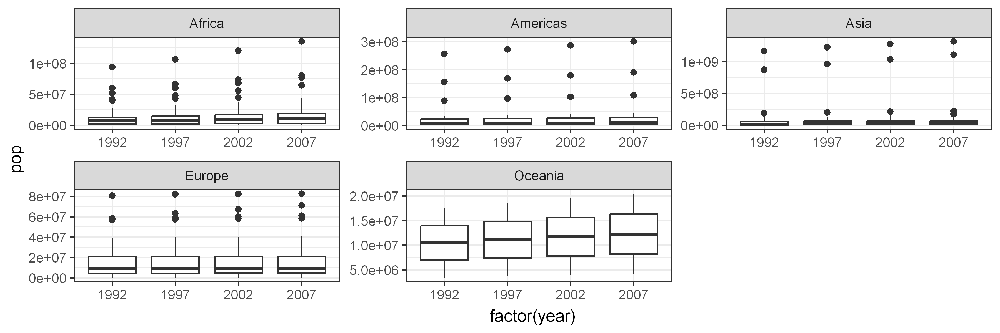

In [160]:
gapdata %>%
filter(year >= 1990) %>%
ggplot(aes(x = factor(year), y = pop)) +
geom_boxplot() +
facet_wrap(~continent, scale='free')

# ~ Linear regression

In [161]:
gapdata %>%
filter(year >= 1990) %>%
group_by(continent) %>%
do(kruskal.test(pop ~ year, data = .) %>%
tidy())

continent,statistic,p.value,parameter,method
<fct>,<dbl>,<dbl>,<int>,<chr>
Africa,2.0963626,0.5526490,3,Kruskal-Wallis rank sum test
Americas,0.8467485,0.8382558,3,Kruskal-Wallis rank sum test
Asia,1.5744112,0.6652057,3,Kruskal-Wallis rank sum test
Europe,0.2065565,0.9765240,3,Kruskal-Wallis rank sum test
Oceania,1.6666667,0.6443698,3,Kruskal-Wallis rank sum test


In [162]:
library(tidyverse)
library(gapminder) # dataset
library(finalfit)
library(broom)
theme_set(theme_bw())
gapdata <- gapminder

`geom_smooth()` using formula = 'y ~ x'


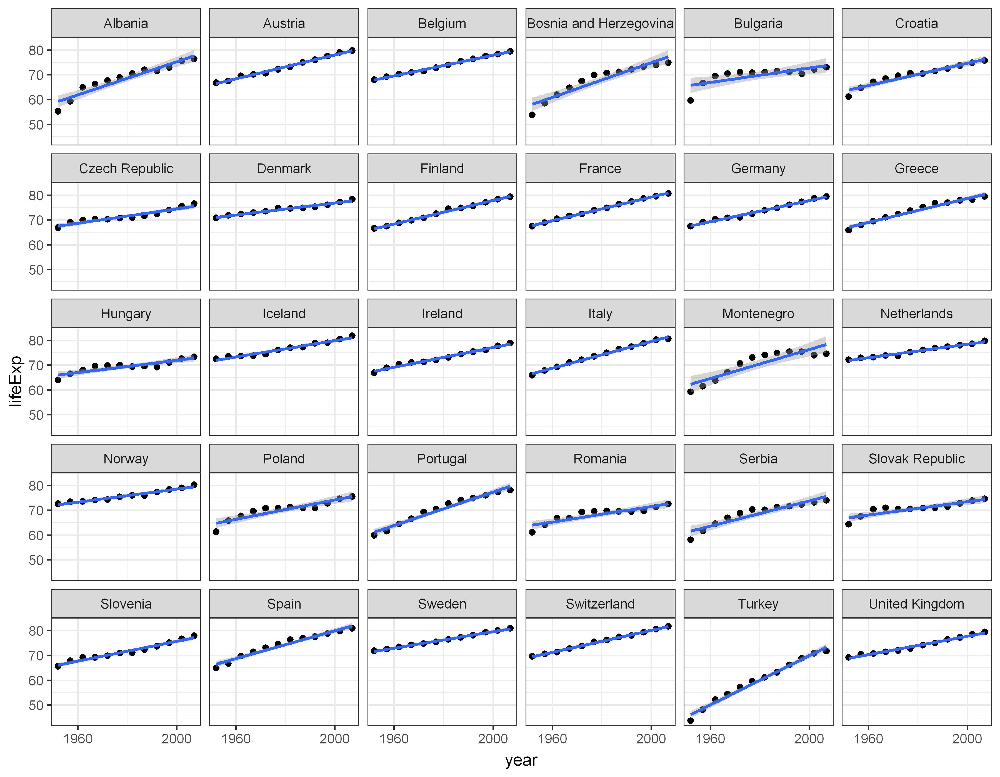

In [163]:
options(repr.plot.width =9, repr.plot.height = 7, repr.plot.res = 400)

gapdata %>%
filter(continent == "Europe") %>% # Europe only
ggplot(aes(x = year, y = lifeExp)) + # lifeExp~year
geom_point() + # plot points
facet_wrap(~ country) + # facet by country
scale_x_continuous(breaks = c(1960, 2000)) + # adjust x-axis
geom_smooth(method = "lm") # add regression lines

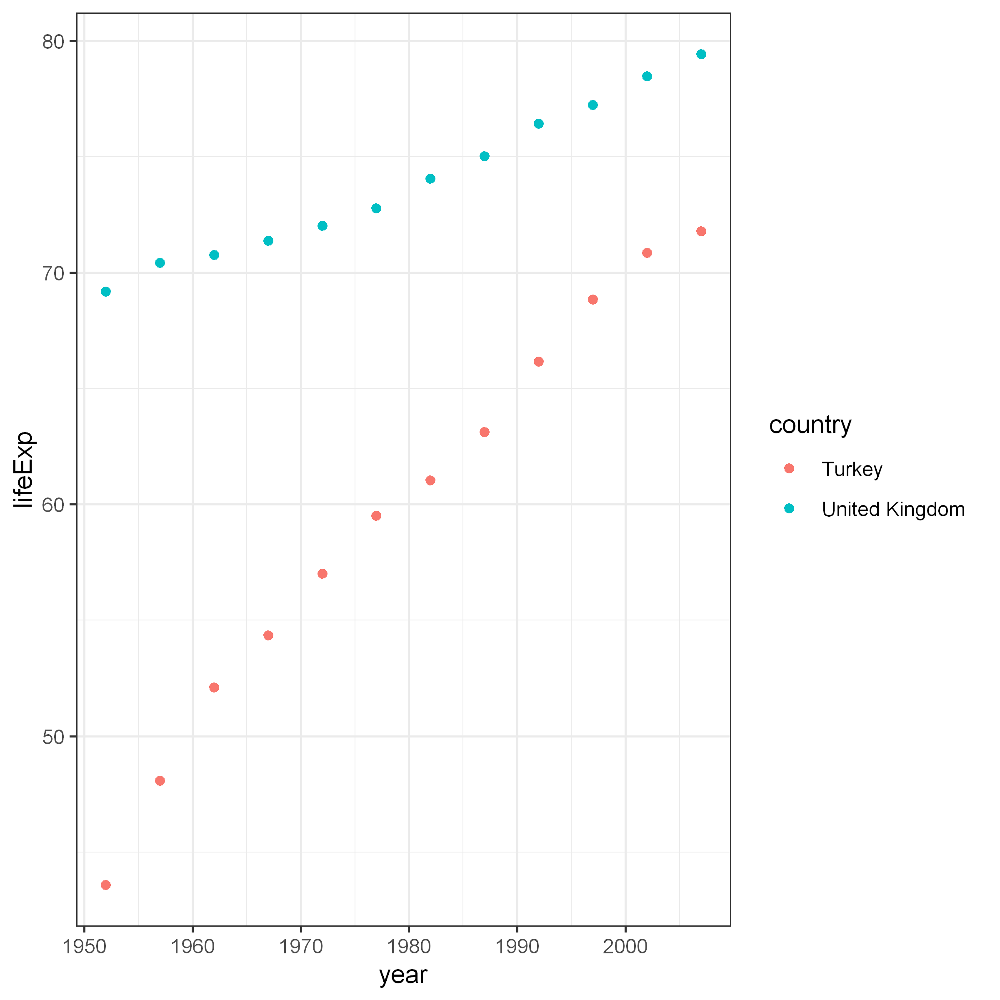

In [164]:
options(repr.plot.width =6, repr.plot.height = 6, repr.plot.res = 400)
gapdata %>%
filter(country %in% c("Turkey", "United Kingdom")) %>%
ggplot(aes(x = year, y = lifeExp, colour = country)) +
geom_point()

In [165]:
gapdata <- gapdata %>%
mutate(year_from1952 = year - 1952)

In [166]:
fit_uk <- gapdata %>%
filter(country == "United Kingdom") %>%
lm(lifeExp ~ year_from1952, data = .)

fit_turkey <- gapdata %>%
filter(country == "Turkey") %>%
lm(lifeExp ~ year_from1952, data = .)

In [167]:
# United Kingdom
fit_uk <- gapdata %>%
filter(country == "United Kingdom") %>%
lm(lifeExp~year, data = .)
fit_uk %>%
summary()


Call:
lm(formula = lifeExp ~ year, data = .)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.69767 -0.31962  0.06642  0.36601  0.68165 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -2.942e+02  1.464e+01  -20.10 2.05e-09 ***
year         1.860e-01  7.394e-03   25.15 2.26e-10 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.4421 on 10 degrees of freedom
Multiple R-squared:  0.9844,	Adjusted R-squared:  0.9829 
F-statistic: 632.5 on 1 and 10 DF,  p-value: 2.262e-10


In [168]:
# Turkey
fit_turkey <- gapdata %>%
filter(country == "Turkey") %>%lm(lifeExp~year, data = .)
fit_turkey %>%
summary()


Call:
lm(formula = lifeExp ~ year, data = .)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.4373 -0.3457  0.1653  0.9008  1.1033 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -924.58989   37.97715  -24.35 3.12e-10 ***
year           0.49724    0.01918   25.92 1.68e-10 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.147 on 10 degrees of freedom
Multiple R-squared:  0.9853,	Adjusted R-squared:  0.9839 
F-statistic: 671.8 on 1 and 10 DF,  p-value: 1.681e-10


## Model 1: year only

In [169]:
gapdata_UK_T <- gapdata %>%
filter(country %in% c("Turkey", "United Kingdom"))

fit_both1 <- gapdata_UK_T %>%
lm(lifeExp ~ year_from1952, data = .)
fit_both1


Call:
lm(formula = lifeExp ~ year_from1952, data = .)

Coefficients:
  (Intercept)  year_from1952  
      57.4154         0.3416  


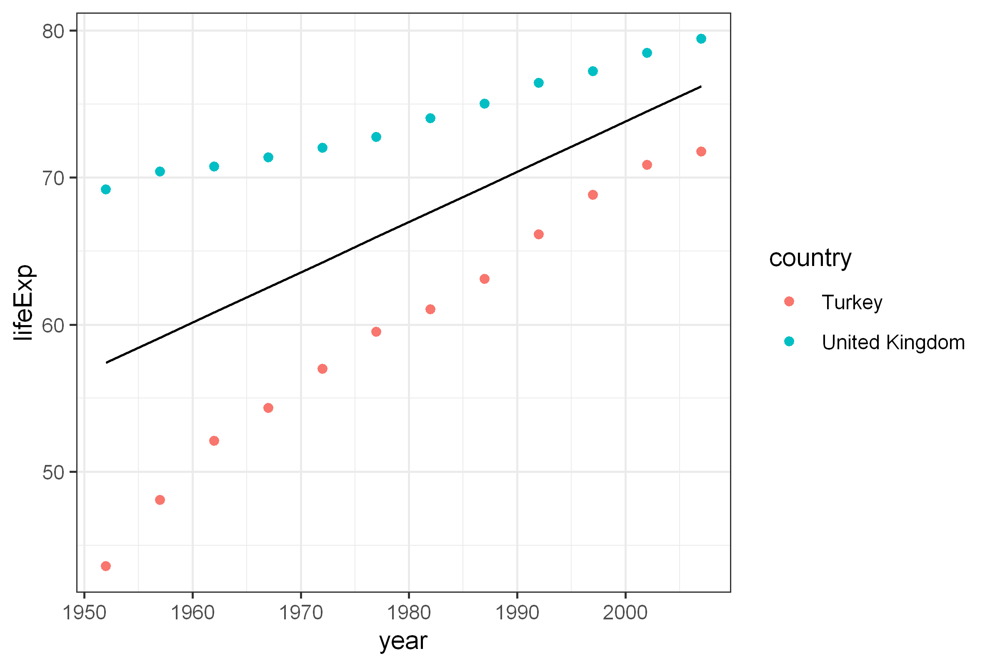

In [170]:
options(repr.plot.width =6, repr.plot.height = 4, repr.plot.res = 400)
gapdata_UK_T %>%
mutate(pred_lifeExp = predict(fit_both1)) %>%
ggplot() +geom_point(aes(x = year, y = lifeExp, colour = country)) +
geom_line(aes(x = year, y = pred_lifeExp))

In [171]:
gapdata_UK_T %>%
mutate(pred_lifeExp = predict(fit_both1)) %>%
select(country, year, lifeExp, pred_lifeExp) %>% 
group_by(country) %>%
slice(1, 6, 12)

country,year,lifeExp,pred_lifeExp
<fct>,<int>,<dbl>,<dbl>
Turkey,1952,43.585,57.41542
Turkey,1977,59.507,65.95549
Turkey,2007,71.777,76.20358
United Kingdom,1952,69.180,57.41542
United Kingdom,1977,72.760,65.95549
United Kingdom,2007,79.425,76.20358


## Model 2: year + country

In [172]:
fit_both2 <- gapdata_UK_T %>%
lm(lifeExp ~ year_from1952 + country, data = .)
fit_both2


Call:
lm(formula = lifeExp ~ year_from1952 + country, data = .)

Coefficients:
          (Intercept)          year_from1952  countryUnited Kingdom  
              50.3023                 0.3416                14.2262  


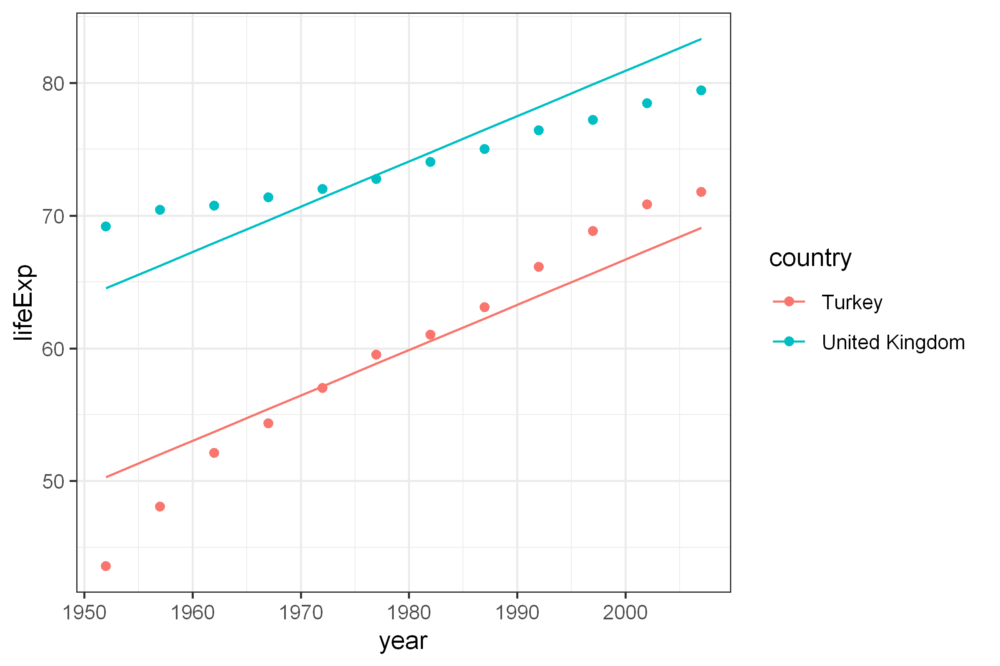

In [173]:
gapdata_UK_T %>%
mutate(pred_lifeExp = predict(fit_both2)) %>%
ggplot() +
geom_point(aes(x = year, y = lifeExp, colour = country)) +
geom_line(aes(x = year, y = pred_lifeExp, colour = country))

## Model 3: year * country

myfit = lm(lifeExp ~ year * country, data = gapdata)

This equivalent to: myfit = lm(lifeExp ~ year + country + year:country, data = gapdata)

In [174]:
fit_both3 <- gapdata_UK_T %>%
lm(lifeExp ~ year_from1952 * country, data = .)
fit_both3


Call:
lm(formula = lifeExp ~ year_from1952 * country, data = .)

Coefficients:
                        (Intercept)                        year_from1952  
                            46.0223                               0.4972  
              countryUnited Kingdom  year_from1952:countryUnited Kingdom  
                            22.7862                              -0.3113  


In [175]:
summary(fit_both3)


Call:
lm(formula = lifeExp ~ year_from1952 * country, data = .)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.43732 -0.32516  0.09415  0.40049  1.10328 

Coefficients:
                                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)                         46.02232    0.47203   97.50  < 2e-16 ***
year_from1952                        0.49724    0.01454   34.20  < 2e-16 ***
countryUnited Kingdom               22.78621    0.66755   34.13  < 2e-16 ***
year_from1952:countryUnited Kingdom -0.31127    0.02056  -15.14 2.03e-12 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.8693 on 20 degrees of freedom
Multiple R-squared:  0.9932,	Adjusted R-squared:  0.9922 
F-statistic: 980.2 on 3 and 20 DF,  p-value: < 2.2e-16


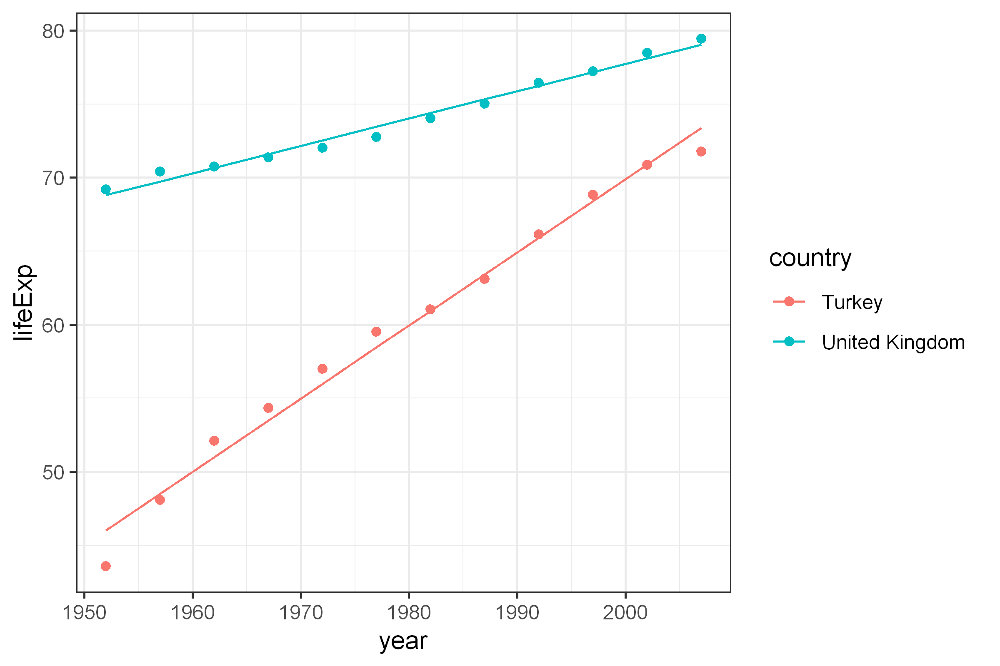

In [176]:
gapdata_UK_T %>%
mutate(pred_lifeExp = predict(fit_both3)) %>%
ggplot() +
geom_point(aes(x = year, y = lifeExp, colour = country)) +
geom_line(aes(x = year, y = pred_lifeExp, colour = country))

In [177]:
gapdata_UK_T %>%
mutate(pred_lifeExp = predict(fit_both3)) %>%
select(country, year, lifeExp, pred_lifeExp) %>% 
group_by(country) %>%
slice(1, 6, 12)

country,year,lifeExp,pred_lifeExp
<fct>,<int>,<dbl>,<dbl>
Turkey,1952,43.585,46.02232
Turkey,1977,59.507,58.45332
Turkey,2007,71.777,73.37051
United Kingdom,1952,69.180,68.80853
United Kingdom,1977,72.760,73.45767
United Kingdom,2007,79.425,79.03664


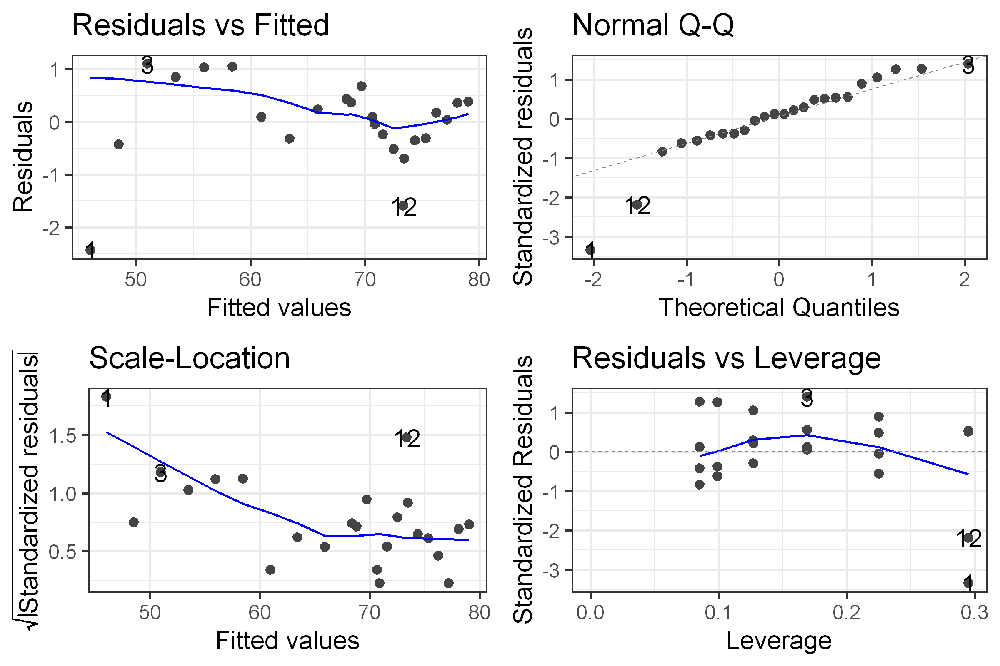

In [178]:
library(ggfortify)
autoplot(fit_both3)


1. As few explanatory variables should be used as possible (parsimony);
2. Explanatory variables associated with the outcome variable in previous studies should be accounted for;
3. Demographic variables should be included in model exploration;
4. Population stratification should be incorporated if available;
5. Interactions should be checked and included if influential;
6. Final model selection should be performed using a “criterion-based
approach”

• minimise the Akaike information criterion (AIC)
• maximise the adjusted R-squared value.


- **Prediction**: fitting a predictive model to an observed dataset, then using that model to make predictions about an outcome from a new set of explanatory variables;

- **Explanation**: fit a model to explain the inter-relationships between a set of variables.

1. Linear relationship between predictors and outcome;
2. Independence of residuals;
3. Normal distribution of residuals;
4. Equal variance of residuals

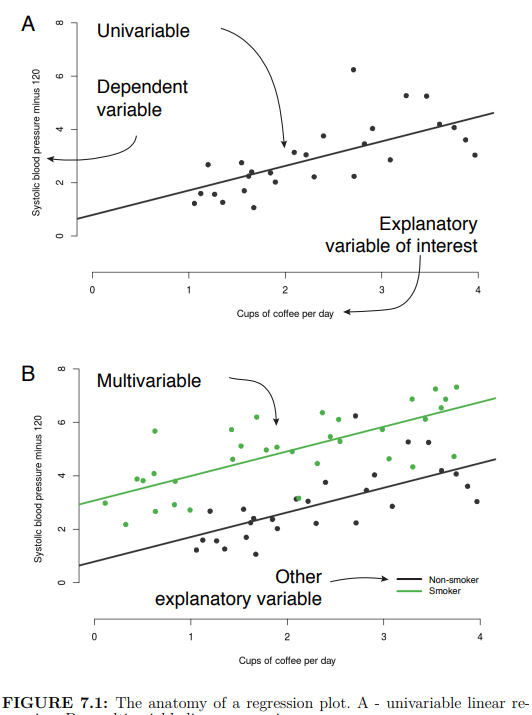`

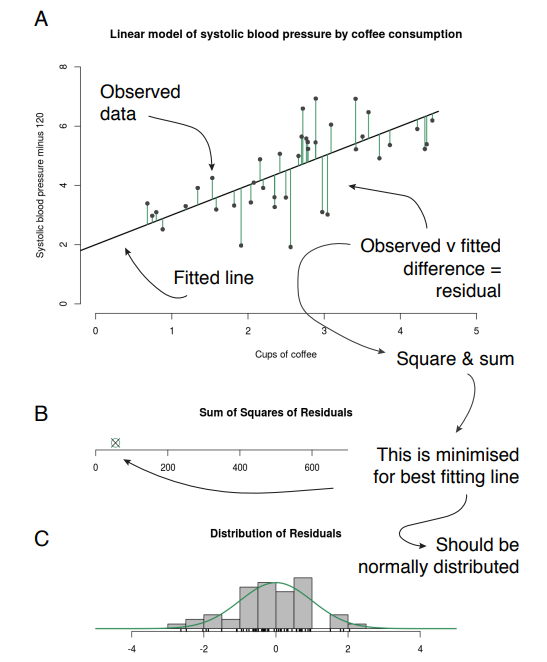

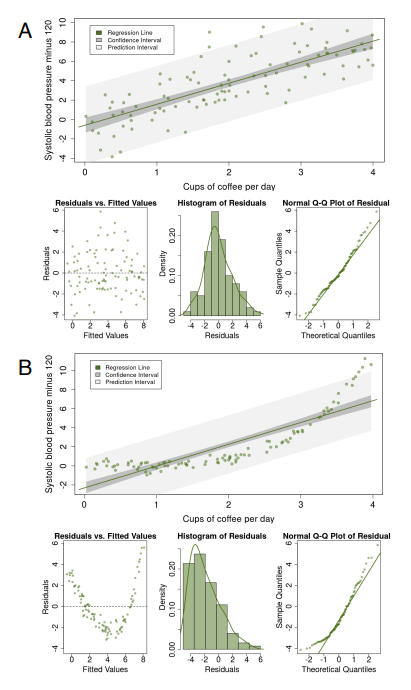

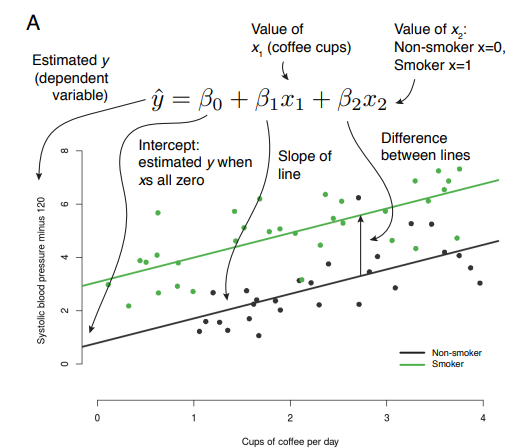

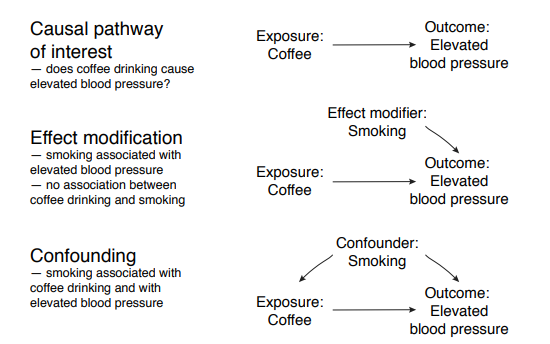

Additive vs. multiplicative effect modification (interaction)

• 𝑖𝑛𝑡𝑒𝑟𝑐𝑒𝑝𝑡 = 1: the blood pressure ( ) for non-smokers who drink no coffee ̂𝑦
(all 𝑥 = 0);

• 𝛽1 = 1 (coffee): the additional blood pressure for each cup of coffee drunk
by non-smokers (slope of the line when 𝑥2 = 0);

• 𝛽2 = 1 (smoking): the difference in blood pressure between non-smokers and
smokers who drink no coffee (𝑥1 = 0);

• 𝛽3 = 1 (coffee:smoking interaction): the blood pressure ( ) in addition to ̂𝑦 𝛽1 and 𝛽2, for each cup of coffee drunk by smokers (𝑥2 = 1).

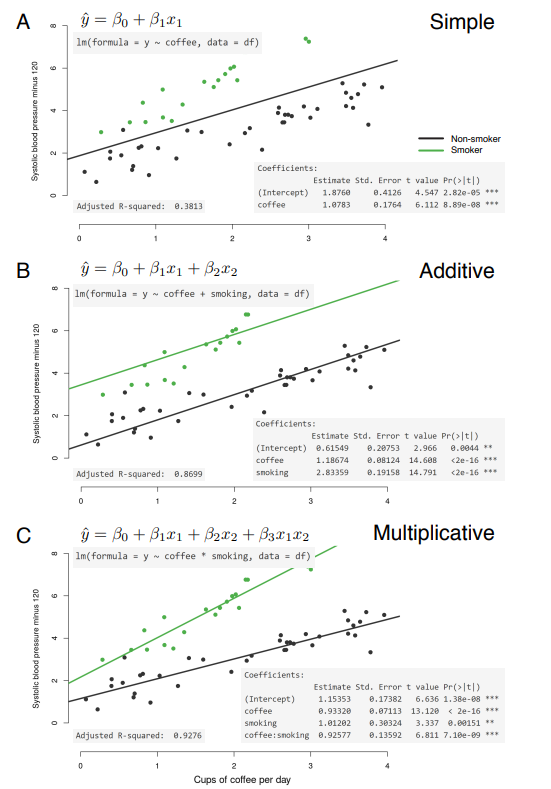

The last important concept to mention here is confounding. Confounding is a
situation in which the association between an explanatory variable (exposure)
and outcome (dependent variable) is distorted by the presence of another
explanatory variable

In our example, confounding exists if there is an association between smoking
and blood pressure AND smoking and coffee consumption (Figure 7.5C). This
exists if smokers drink more coffee than non-smokers.

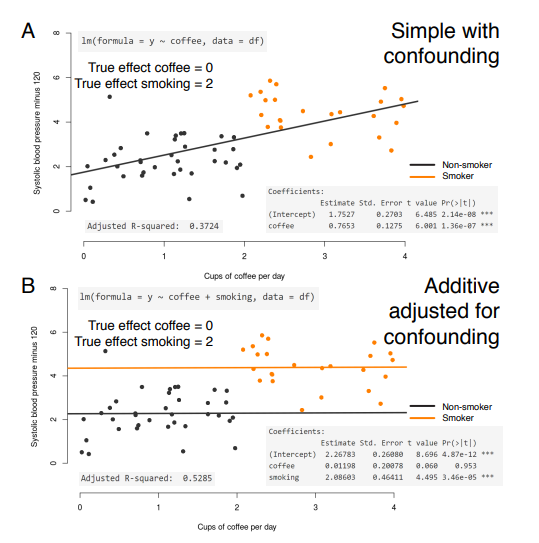

If we only fit blood pressure by coffee consumption (Figure 7.7A), then we
may mistakenly conclude a relationship between coffee consumption and blood
pressure. But this does not exist, because the ground truth we have set is
that no relationship exists between coffee and blood pressure. We are actually
looking at the effect of smoking on blood pressure, which is confounding the
effect of coffee on blood pressure.

# Fitting more complex models

In [179]:
wcgsdata <- finalfit::wcgs 

In [180]:
ff_glimpse(wcgsdata)

,label,var_type,n,missing_n,missing_percent,mean,sd,min,quartile_25,median,quartile_75,max
,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
id,Subject ID,<int>,3154,0,0.0,10477.9,5877.4,2001.0,3741.2,11405.5,13114.8,22101.0
age,Age (years),<int>,3154,0,0.0,46.3,5.5,39.0,42.0,45.0,50.0,59.0
height,Height (inches),<int>,3154,0,0.0,69.8,2.5,60.0,68.0,70.0,72.0,78.0
weight,Weight (pounds),<int>,3154,0,0.0,170.0,21.1,78.0,155.0,170.0,182.0,320.0
sbp,Systolic BP (mmHg),<int>,3154,0,0.0,128.6,15.1,98.0,120.0,126.0,136.0,230.0
dbp,Diastolic BP (mmHg),<int>,3154,0,0.0,82.0,9.7,58.0,76.0,80.0,86.0,150.0
chol,Cholesterol (mg/100 ml),<int>,3142,12,0.4,226.4,43.4,103.0,197.2,223.0,253.0,645.0
ncigs,Cigarettes/day,<int>,3154,0,0.0,11.6,14.5,0.0,0.0,0.0,20.0,99.0
timechd,Time to CHD event,<int>,3154,0,0.0,2683.9,666.5,18.0,2842.2,2942.0,3036.8,3430.0


`geom_smooth()` using formula = 'y ~ x'


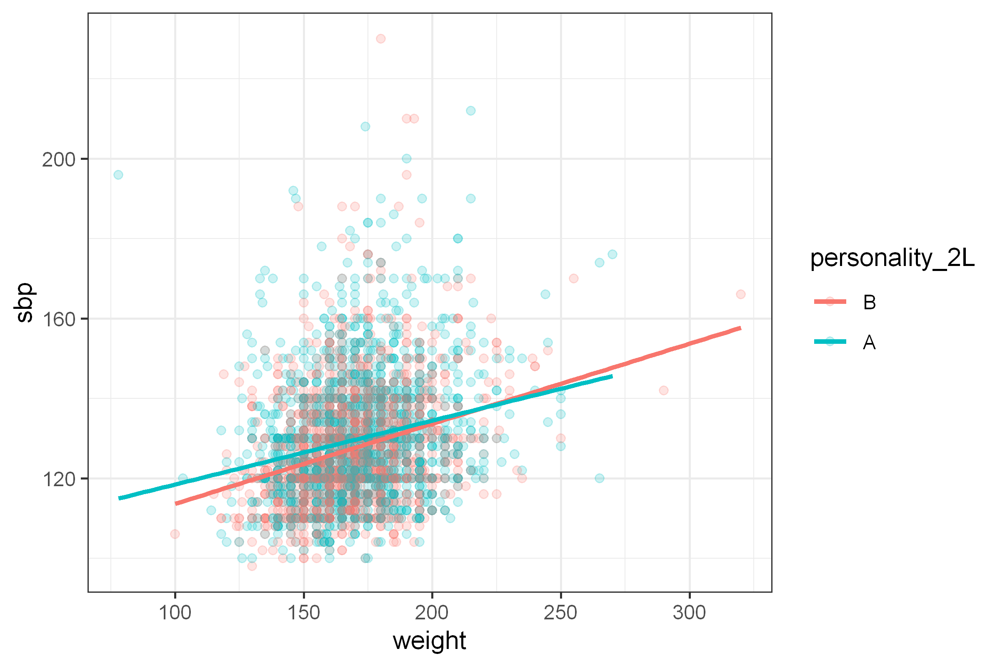

In [181]:
wcgsdata %>%
ggplot(aes(y = sbp, x = weight,colour = personality_2L)) + # Personality type
geom_point(alpha = 0.2) + # Add transparency
geom_smooth(method = "lm", se = FALSE)

In [182]:
dependent <- "sbp"
explanatory <- "personality_2L"
fit_sbp1 <- wcgsdata %>%
finalfit(dependent, explanatory, metrics = TRUE)
fit_sbp1

[[1]]
 Dependent: Systolic BP (mmHg)        unit        value
              Personality type B Mean (sd) 127.5 (14.4)
                               A Mean (sd) 129.8 (15.7)
    Coefficient (univariable)  Coefficient (multivariable)
                            -                            -
 2.32 (1.26 to 3.37, p<0.001) 2.32 (1.26 to 3.37, p<0.001)

[[2]]
                                                                                                                                                            
 Number in dataframe = 3154, Number in model = 3154, Missing = 0, Log-likelihood = -13031.39, AIC = 26068.8, R-squared = 0.0059, Adjusted R-squared = 0.0056

, missing data from any variable results in
the entire row being excluded from the analysis 

In [183]:
dependent <- "sbp"
explanatory <- c("weight", "personality_2L")
fit_sbp2 <- wcgsdata %>%
finalfit(dependent, explanatory, metrics = TRUE)
fit_sbp2

[[1]]
 Dependent: Systolic BP (mmHg)                   unit        value
               Weight (pounds) [78.0,320.0] Mean (sd) 128.6 (15.1)
              Personality type            B Mean (sd) 127.5 (14.4)
                                          A Mean (sd) 129.8 (15.7)
    Coefficient (univariable)  Coefficient (multivariable)
 0.18 (0.16 to 0.21, p<0.001) 0.18 (0.16 to 0.20, p<0.001)
                            -                            -
 2.32 (1.26 to 3.37, p<0.001) 1.99 (0.97 to 3.01, p<0.001)

[[2]]
                                                                                                                                                          
 Number in dataframe = 3154, Number in model = 3154, Missing = 0, Log-likelihood = -12928.82, AIC = 25865.6, R-squared = 0.068, Adjusted R-squared = 0.068

There is little change in the size of the coefficients for each variable in the
multivariable analysis, meaning that they are reasonably independent.

In [184]:
dependent <- "sbp"
explanatory <- c("personality_2L", "weight", "age",
"height", "chol", "smoking")
fit_sbp3 <- wcgsdata %>%
finalfit(dependent, explanatory, metrics = TRUE)
fit_sbp3

[[1]]
 Dependent: Systolic BP (mmHg)                    unit        value
              Personality type             B Mean (sd) 127.5 (14.4)
                                           A Mean (sd) 129.8 (15.7)
               Weight (pounds)  [78.0,320.0] Mean (sd) 128.6 (15.1)
                   Age (years)   [39.0,59.0] Mean (sd) 128.6 (15.1)
               Height (inches)   [60.0,78.0] Mean (sd) 128.6 (15.1)
       Cholesterol (mg/100 ml) [103.0,645.0] Mean (sd) 128.6 (15.1)
                       Smoking    Non-smoker Mean (sd) 128.6 (15.6)
                                      Smoker Mean (sd) 128.7 (14.6)
     Coefficient (univariable)     Coefficient (multivariable)
                             -                               -
  2.32 (1.26 to 3.37, p<0.001)    1.44 (0.44 to 2.43, p=0.005)
  0.18 (0.16 to 0.21, p<0.001)    0.24 (0.21 to 0.27, p<0.001)
  0.45 (0.36 to 0.55, p<0.001)    0.43 (0.33 to 0.52, p<0.001)
 0.11 (-0.10 to 0.32, p=0.302) -0.84 (-1.08 to -0.61, p<0.001)
  0.04 (0.03 to 0.05, p<0.001)    0.03 (0.02 to 0.04, p<0.001)
                             -                               -
 0.08 (-0.98 to 1.14, p=0.883)   0.95 (-0.05 to 1.96, p=0.063)

[[2]]
                                                                                                                                                         
 Number in dataframe = 3154, Number in model = 3142, Missing = 12, Log-likelihood = -12772.04, AIC = 25560.1, R-squared = 0.12, Adjusted R-squared = 0.12

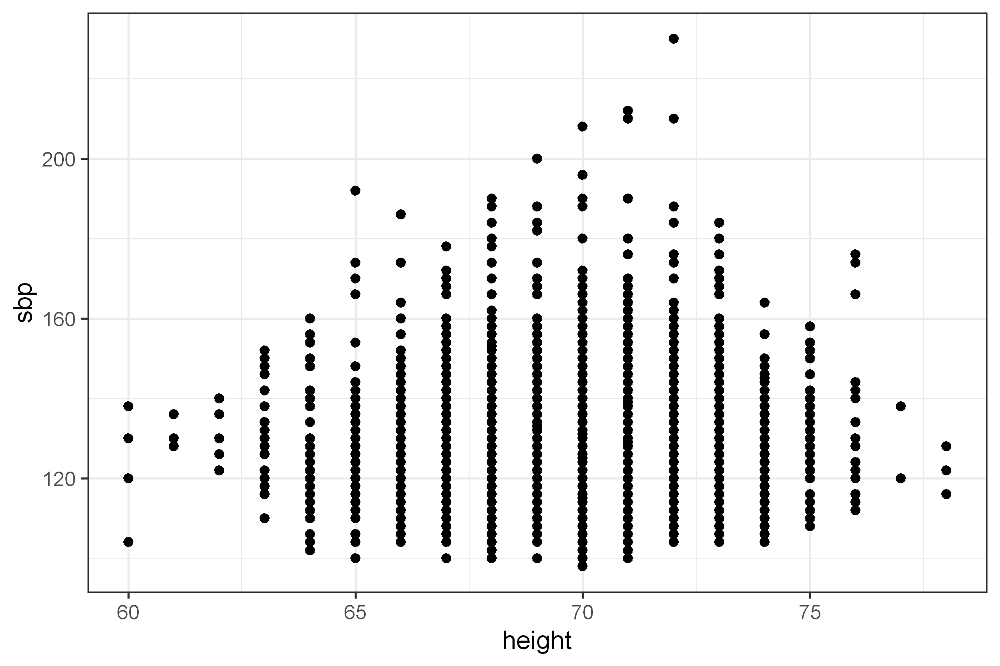

In [185]:
wcgsdata  %>% ggplot(aes(height, sbp)) + geom_point()

For instance, in this
example the effect of height changes size and direction. This is because of the
close association between weight and height. For instance, it may be more
sensible to work with body mass index (𝑤𝑒𝑖𝑔ℎ𝑡/ℎ𝑒𝑖𝑔ℎ𝑡2
) rather than the two
separate variables.

In general, variables that are highly correlated with each other should be
treated carefully in regression analysis. This is called collinearity and can lead
to unstable estimates of coefficients. 

In [186]:
options(repr.plot.width =12, repr.plot.height = 12, repr.plot.res = 700)
pairs.panels(wcgsdata)

In [187]:
wcgsdata <- wcgsdata %>%
mutate(bmi = ((weight*0.4536) / (height*0.0254)^2) %>%
ff_label("BMI"))

In [188]:
explanatory <- c("personality_2L", "bmi", "age","chol", "smoking")
fit_sbp4 <- wcgsdata %>%
finalfit(dependent, explanatory, metrics = TRUE)
fit_sbp4

[[1]]
 Dependent: Systolic BP (mmHg)                    unit        value
              Personality type             B Mean (sd) 127.5 (14.4)
                                           A Mean (sd) 129.8 (15.7)
                           BMI   [11.2,39.0] Mean (sd) 128.6 (15.1)
                   Age (years)   [39.0,59.0] Mean (sd) 128.6 (15.1)
       Cholesterol (mg/100 ml) [103.0,645.0] Mean (sd) 128.6 (15.1)
                       Smoking    Non-smoker Mean (sd) 128.6 (15.6)
                                      Smoker Mean (sd) 128.7 (14.6)
     Coefficient (univariable)   Coefficient (multivariable)
                             -                             -
  2.32 (1.26 to 3.37, p<0.001)  1.51 (0.51 to 2.50, p=0.003)
  1.69 (1.50 to 1.89, p<0.001)  1.65 (1.46 to 1.85, p<0.001)
  0.45 (0.36 to 0.55, p<0.001)  0.41 (0.32 to 0.50, p<0.001)
  0.04 (0.03 to 0.05, p<0.001)  0.03 (0.02 to 0.04, p<0.001)
                             -                             -
 0.08 (-0.98 to 1.14, p=0.883) 0.98 (-0.03 to 1.98, p=0.057)

[[2]]
                                                                                                                                                         
 Number in dataframe = 3154, Number in model = 3142, Missing = 12, Log-likelihood = -12775.03, AIC = 25564.1, R-squared = 0.12, Adjusted R-squared = 0.12

In [189]:
dependent <- "sbp"
explanatory <- c("personality_2L", "bmi", "age",
"chol", "smoking")
explanatory_multi <- c("bmi", "personality_2L", "age",
"chol")
fit_sbp5 <- wcgsdata %>%
finalfit(dependent, explanatory,
explanatory_multi,
keep_models = TRUE, metrics = TRUE)
fit_sbp5

,Dependent: Systolic BP (mmHg),,unit,value,Coefficient (univariable),Coefficient (multivariable full),Coefficient (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
5,Personality type,B,Mean (sd),127.5 (14.4),-,-,-
4,,A,Mean (sd),129.8 (15.7),"2.32 (1.26 to 3.37, p<0.001)","1.51 (0.51 to 2.50, p=0.003)","1.56 (0.57 to 2.56, p=0.002)"
2,BMI,"[11.2,39.0]",Mean (sd),128.6 (15.1),"1.69 (1.50 to 1.89, p<0.001)","1.65 (1.46 to 1.85, p<0.001)","1.62 (1.43 to 1.82, p<0.001)"
1,Age (years),"[39.0,59.0]",Mean (sd),128.6 (15.1),"0.45 (0.36 to 0.55, p<0.001)","0.41 (0.32 to 0.50, p<0.001)","0.41 (0.32 to 0.50, p<0.001)"
3,Cholesterol (mg/100 ml),"[103.0,645.0]",Mean (sd),128.6 (15.1),"0.04 (0.03 to 0.05, p<0.001)","0.03 (0.02 to 0.04, p<0.001)","0.03 (0.02 to 0.04, p<0.001)"
6,Smoking,Non-smoker,Mean (sd),128.6 (15.6),-,-,-
7,,Smoker,Mean (sd),128.7 (14.6),"0.08 (-0.98 to 1.14, p=0.883)","0.98 (-0.03 to 1.98, p=0.057)",-


1. As few explanatory variables should be used as possible (parsimony);
2. Explanatory variables associated with the outcome variable in previous studies should be accounted for;
3. Demographic variables should be included in model exploration;
4. Population stratification should be incorporated if available;
5. Interactions should be checked and included if influential;
6. Final model selection should be performed using a “criterion-based
approach”


# Working with categorical outcome variables

# Chi-Square, Pearson residual

In [190]:
meldata <- boot::melanoma
summary(meldata)

      time          status          sex              age             year     
 Min.   :  10   Min.   :1.00   Min.   :0.0000   Min.   : 4.00   Min.   :1962  
 1st Qu.:1525   1st Qu.:1.00   1st Qu.:0.0000   1st Qu.:42.00   1st Qu.:1968  
 Median :2005   Median :2.00   Median :0.0000   Median :54.00   Median :1970  
 Mean   :2153   Mean   :1.79   Mean   :0.3854   Mean   :52.46   Mean   :1970  
 3rd Qu.:3042   3rd Qu.:2.00   3rd Qu.:1.0000   3rd Qu.:65.00   3rd Qu.:1972  
 Max.   :5565   Max.   :3.00   Max.   :1.0000   Max.   :95.00   Max.   :1977  
   thickness         ulcer      
 Min.   : 0.10   Min.   :0.000  
 1st Qu.: 0.97   1st Qu.:0.000  
 Median : 1.94   Median :0.000  
 Mean   : 2.92   Mean   :0.439  
 3rd Qu.: 3.56   3rd Qu.:1.000  
 Max.   :17.42   Max.   :1.000  

In [191]:
meldata <- meldata %>%
mutate(sex.factor = # Make new variable
       sex %>% # from existing variable
       factor() %>% # convert to factor
       fct_recode( # forcats function
           "Female" = "0", # new on left, old on right
           "Male" = "1") %>%
       ff_label("Sex"), # Optional label for finalfit
       # same thing but more condensed code:
       
       ulcer.factor = factor(ulcer) %>%
       fct_recode("Present" = "1",
                  "Absent" = "0") %>%
       ff_label("Ulcerated tumour"),
       
       status.factor = factor(status) %>%
       fct_recode("Died melanoma" = "1",
                  "Alive" = "2",
                  "Died - other causes" = "3") %>%
       ff_label("Status"))

In [192]:
meldata$age %>%
summary()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   42.00   54.00   52.46   65.00   95.00 

In [193]:
meldata %>%
ggplot(aes(x = age)) +
geom_histogram()

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


Equal intervals:

In [194]:
meldata <- meldata %>%
mutate(
    age.factor =age %>%cut(4)
)
meldata$age.factor %>%
summary()

(3.91,26.8] (26.8,49.5] (49.5,72.2] (72.2,95.1] 
         16          68         102          19

Quantiles:

In [195]:
meldata <- meldata %>%
mutate(
age.factor =
age %>%
Hmisc::cut2(g=4) # Note, cut2 comes from the Hmisc package
)
meldata$age.factor %>%
summary()

[ 4,43) [43,55) [55,66) [66,95] 
     55      49      53      48

In [196]:
meldata <- meldata %>%
mutate(
age.factor =
age %>%
cut(breaks = c(4,20,40,60,95), include.lowest = TRUE) %>%
fct_recode(
"≤20" = "[4,20]",
"21 to 40" = "(20,40]",
"41 to 60" = "(40,60]",
">60" = "(60,95]"
) %>%
ff_label("Age (years)")
)
head(meldata$age.factor)

[1] >60      41 to 60 41 to 60 >60      41 to 60 21 to 40
Levels: ≤20 21 to 40 41 to 60 >60

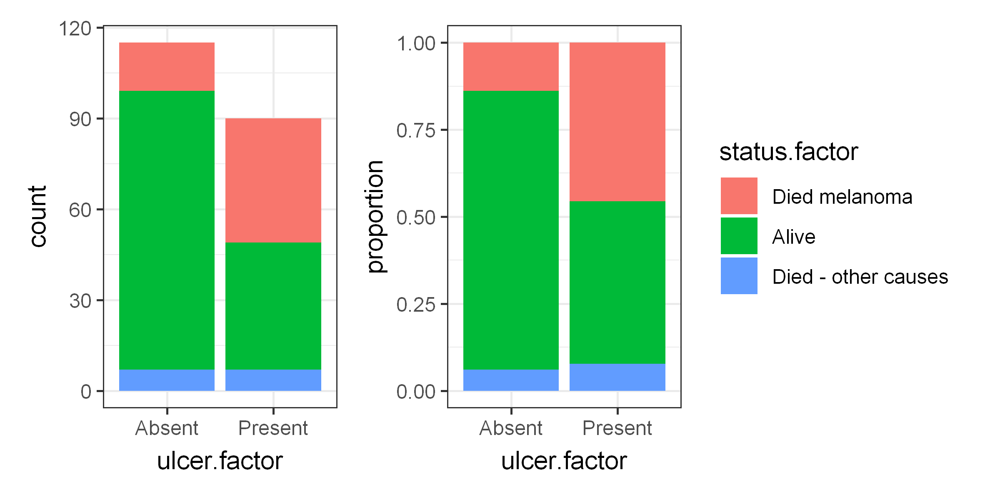

In [197]:
options(repr.plot.width =6, repr.plot.height = 3, repr.plot.res = 400)
p1 <- meldata %>%
ggplot(aes(x = ulcer.factor, fill = status.factor)) +
geom_bar() +
theme(legend.position = "none")
p2 <- meldata %>%
ggplot(aes(x = ulcer.factor, fill = status.factor)) +
geom_bar(position = "fill") +
ylab("proportion")
library(patchwork)
p1 + p2

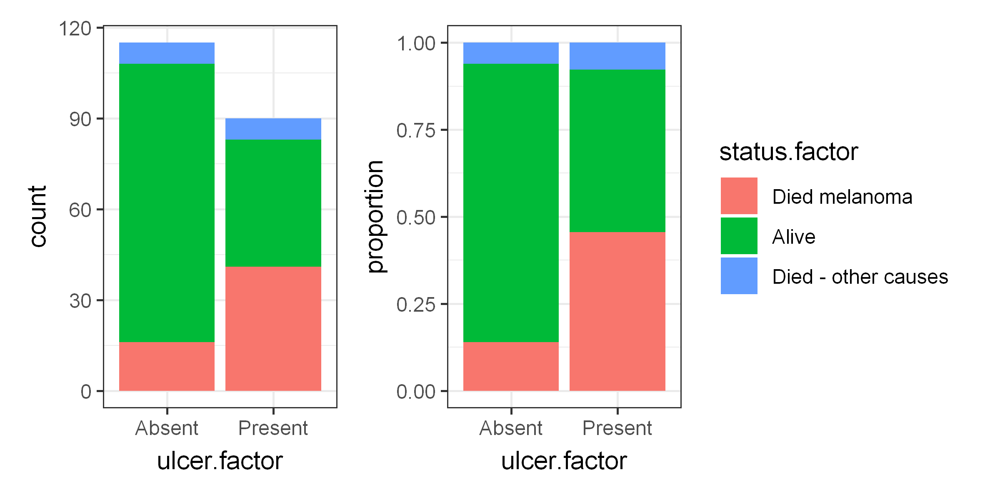

In [198]:
p1 <- meldata %>%
ggplot(aes(x = ulcer.factor, fill = status.factor)) +
geom_bar(position = position_stack(reverse = TRUE)) +
theme(legend.position = "none")
p2 <- meldata %>%
ggplot(aes(x = ulcer.factor, fill = status.factor)) +
geom_bar(position = position_fill(reverse = TRUE)) +
ylab("proportion")
library(patchwork)
p1 + p2


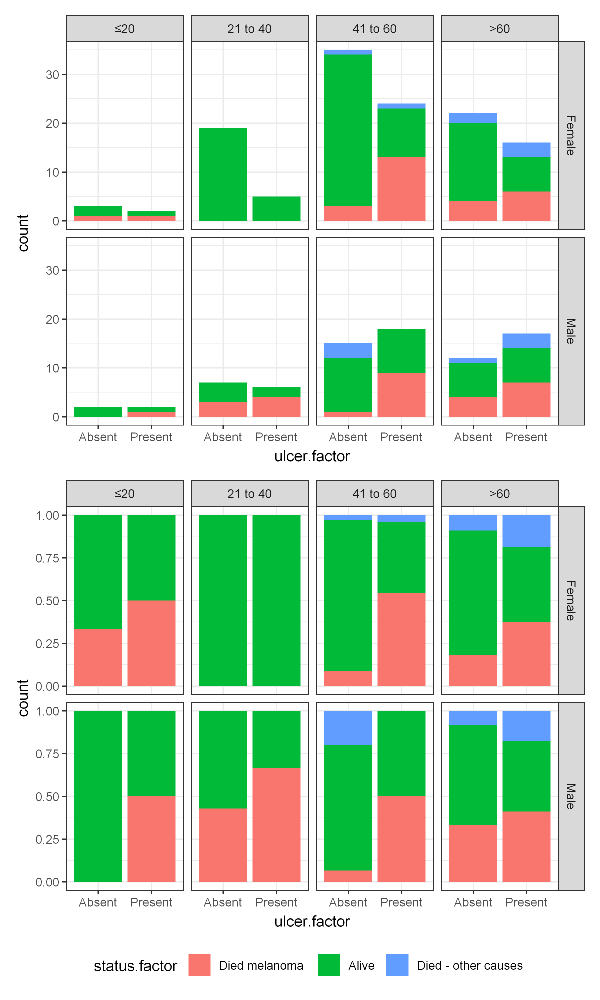

In [199]:
options(repr.plot.width =6, repr.plot.height = 10, repr.plot.res = 400)
p1 <- meldata %>%
ggplot(aes(x = ulcer.factor, fill=status.factor)) +
geom_bar(position = position_stack(reverse = TRUE)) +
facet_grid(sex.factor ~ age.factor) +
theme(legend.position = "none")
p2 <- meldata %>%
ggplot(aes(x = ulcer.factor, fill=status.factor)) +
geom_bar(position = position_fill(reverse = TRUE)) +
facet_grid(sex.factor ~ age.factor)+theme(legend.position = "bottom")
p1 / p2

In [200]:
meldata <- meldata %>%
mutate(
status_dss = fct_collapse(
    status.factor,
    "Alive" = c("Alive", "Died - other causes"))
)
meldata$status_dss %>% levels()

[1] "Died melanoma" "Alive"

Pearson’s chi-squared and Fisher’s exact tests

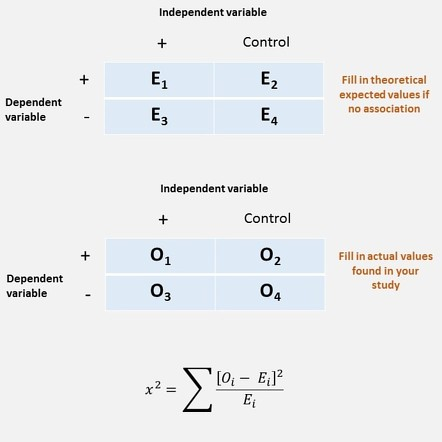

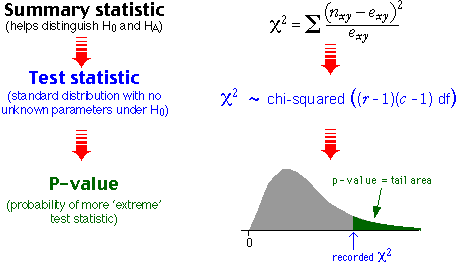

In [201]:
meldata <- meldata %>%
mutate(status_dss = status_dss %>%
fct_relevel("Alive")
)

In [202]:
library(finalfit)
meldata %>%
summary_factorlist(dependent = "status_dss",
explanatory = "ulcer.factor")

label,levels,Alive,Died melanoma
<chr>,<chr>,<chr>,<chr>
Ulcerated tumour,Absent,99 (66.9),16 (28.1)
,Present,49 (33.1),41 (71.9)


In [203]:
library(finalfit)
meldata %>%
summary_factorlist(dependent = "status_dss",
explanatory =
c("ulcer.factor", "age.factor",
"sex.factor", "thickness")
)


label,levels,Alive,Died melanoma
<chr>,<chr>,<chr>,<chr>
Ulcerated tumour,Absent,99 (66.9),16 (28.1)
,Present,49 (33.1),41 (71.9)
Age (years),≤20,6 (4.1),3 (5.3)
,21 to 40,30 (20.3),7 (12.3)
,41 to 60,66 (44.6),26 (45.6)
,>60,46 (31.1),21 (36.8)
Sex,Female,98 (66.2),28 (49.1)
,Male,50 (33.8),29 (50.9)
thickness,Mean (SD),2.4 (2.5),4.3 (3.6)


In [204]:
table(meldata$ulcer.factor, meldata$status_dss) # both give same result
with(meldata, table(ulcer.factor, status_dss))

         
          Alive Died melanoma
  Absent     99            16
  Present    49            41

            status_dss
ulcer.factor Alive Died melanoma
     Absent     99            16
     Present    49            41

In [205]:
library(magrittr)
meldata %$% # note $ sign here
table(ulcer.factor, status_dss)


Attaching package: 'magrittr'


The following object is masked from 'package:purrr':

    set_names


The following object is masked from 'package:tidyr':

    extract




            status_dss
ulcer.factor Alive Died melanoma
     Absent     99            16
     Present    49            41

In [206]:
meldata %$%
table(ulcer.factor, status_dss) %>%
prop.table(margin = 1) # 1: row, 2: column etc.

            status_dss
ulcer.factor     Alive Died melanoma
     Absent  0.8608696     0.1391304
     Present 0.5444444     0.4555556

In [207]:
meldata %$% # note $ sign here
table(ulcer.factor, status_dss) %>%
chisq.test()


	Pearson's Chi-squared test with Yates' continuity correction

data:  .
X-squared = 23.631, df = 1, p-value = 1.167e-06


In [208]:
library(broom)
meldata %$% # note $ sign here
table(ulcer.factor, status_dss) %>%
chisq.test() %>%
tidy()

statistic,p.value,parameter,method
<dbl>,<dbl>,<int>,<chr>
23.6309,1.166987e-06,1,Pearson's Chi-squared test with Yates' continuity correction


In [209]:
meldata %$% # note $ sign here
table(age.factor, status_dss) %>%
chisq.test()

Warning message in chisq.test(.):
"Chi-squared approximation may be incorrect"



	Pearson's Chi-squared test

data:  .
X-squared = 2.0198, df = 3, p-value = 0.5683


In [210]:
meldata %$% # note $ sign here
table(age.factor, status_dss) %>%
fisher.test()


	Fisher's Exact Test for Count Data

data:  .
p-value = 0.5437
alternative hypothesis: two.sided


In [211]:
library(finalfit)
meldata %>%
summary_factorlist(dependent = "status_dss",
explanatory = "ulcer.factor",
p = TRUE)

label,levels,Alive,Died melanoma,p
<chr>,<chr>,<chr>,<chr>,<chr>
Ulcerated tumour,Absent,99 (66.9),16 (28.1),<0.001
,Present,49 (33.1),41 (71.9),


In [212]:
meldata %>%
summary_factorlist(dependent = "status_dss",
explanatory =
c("ulcer.factor", "age.factor",
"sex.factor", "thickness"),
p = TRUE)

Warning message:
"There was 1 warning in `dplyr::summarise()`.
ℹ In argument: `chisq.test(age.factor, status_dss)$p.value`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect"


label,levels,Alive,Died melanoma,p
<chr>,<chr>,<chr>,<chr>,<chr>
Ulcerated tumour,Absent,99 (66.9),16 (28.1),<0.001
,Present,49 (33.1),41 (71.9),
Age (years),≤20,6 (4.1),3 (5.3),0.568
,21 to 40,30 (20.3),7 (12.3),
,41 to 60,66 (44.6),26 (45.6),
,>60,46 (31.1),21 (36.8),
Sex,Female,98 (66.2),28 (49.1),0.036
,Male,50 (33.8),29 (50.9),
thickness,Mean (SD),2.4 (2.5),4.3 (3.6),<0.001


Note that for continuous expanatory variables, an F-test (ANOVA) is performed by default. If variables are considered non-parametric (cont = "mean"),
then a Kruskal-Wallis test is used.
\

In [213]:
meldata %>%
summary_factorlist(dependent = "status_dss",
explanatory =c("ulcer.factor", "age.factor",
"sex.factor", "thickness"),p = TRUE,p_cat = "fisher")

label,levels,Alive,Died melanoma,p
<chr>,<chr>,<chr>,<chr>,<chr>
Ulcerated tumour,Absent,99 (66.9),16 (28.1),<0.001
,Present,49 (33.1),41 (71.9),
Age (years),≤20,6 (4.1),3 (5.3),0.544
,21 to 40,30 (20.3),7 (12.3),
,41 to 60,66 (44.6),26 (45.6),
,>60,46 (31.1),21 (36.8),
Sex,Female,98 (66.2),28 (49.1),0.026
,Male,50 (33.8),29 (50.9),
thickness,Mean (SD),2.4 (2.5),4.3 (3.6),<0.001


In [214]:
res <- prop.test(x = c(490, 400), n = c(500, 500))
# Printing the results
res 


	2-sample test for equality of proportions with continuity correction

data:  c(490, 400) out of c(500, 500)
X-squared = 80.909, df = 1, p-value < 2.2e-16
alternative hypothesis: two.sided
95 percent confidence interval:
 0.1408536 0.2191464
sample estimates:
prop 1 prop 2 
  0.98   0.80 


The chi-square test of independence is used to analyze the frequency table (i.e. contengency table) formed by two categorical variables. The chi-square test evaluates whether there is a significant association between the categories of the two variables

In [215]:
housetasks <- read.delim('sthda.com_sthda_RDoc_data_housetasks.txt', row.names = 1)

In [216]:
housetasks

,Wife,Alternating,Husband,Jointly
,<int>,<int>,<int>,<int>
Laundry,156,14,2,4
Main_meal,124,20,5,4
Dinner,77,11,7,13
Breakfeast,82,36,15,7
Tidying,53,11,1,57
Dishes,32,24,4,53
Shopping,33,23,9,55
Official,12,46,23,15
Driving,10,51,75,3


In [217]:
library(gplots)


Attaching package: 'gplots'


The following object is masked from 'package:stats':

    lowess




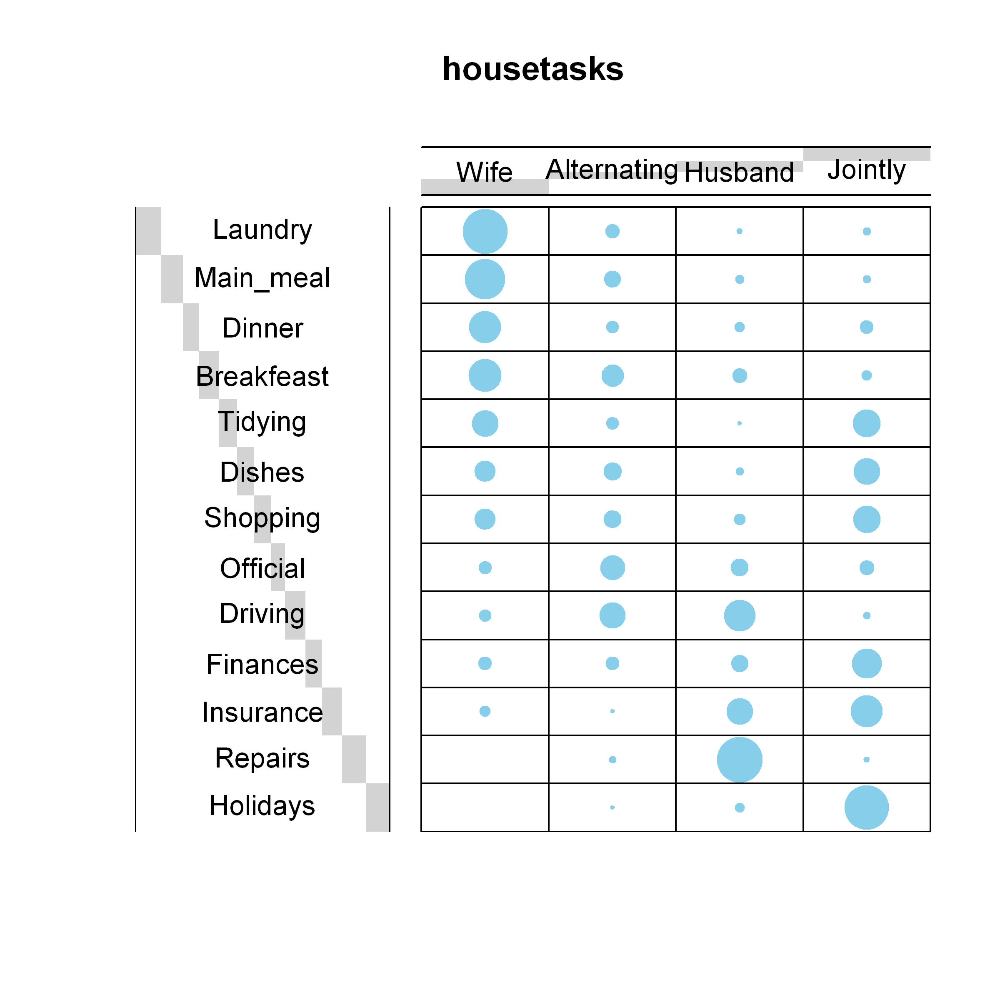

In [218]:
# 1. convert the data as a table
options(repr.plot.width =6, repr.plot.height = 6, repr.plot.res = 400)

dt <- as.table(as.matrix(housetasks))
# 2. Graph
balloonplot(t(dt), main ="housetasks", xlab ="", ylab="",
            label = FALSE, show.margins = FALSE)

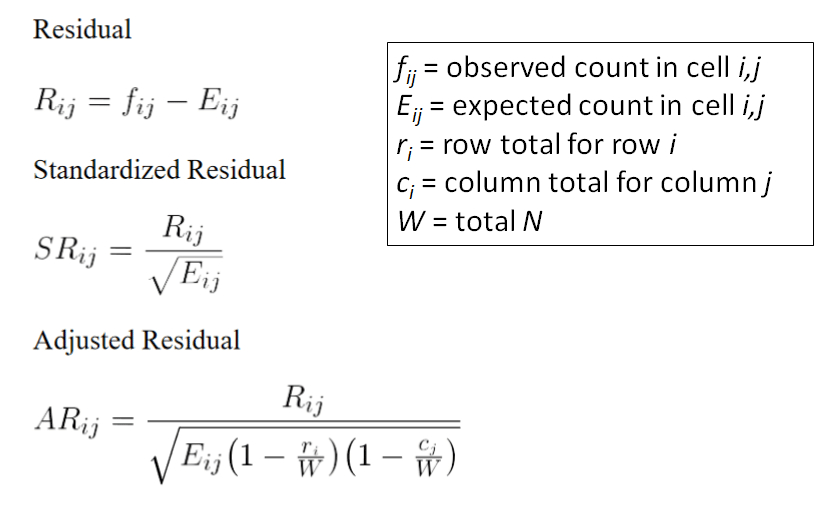

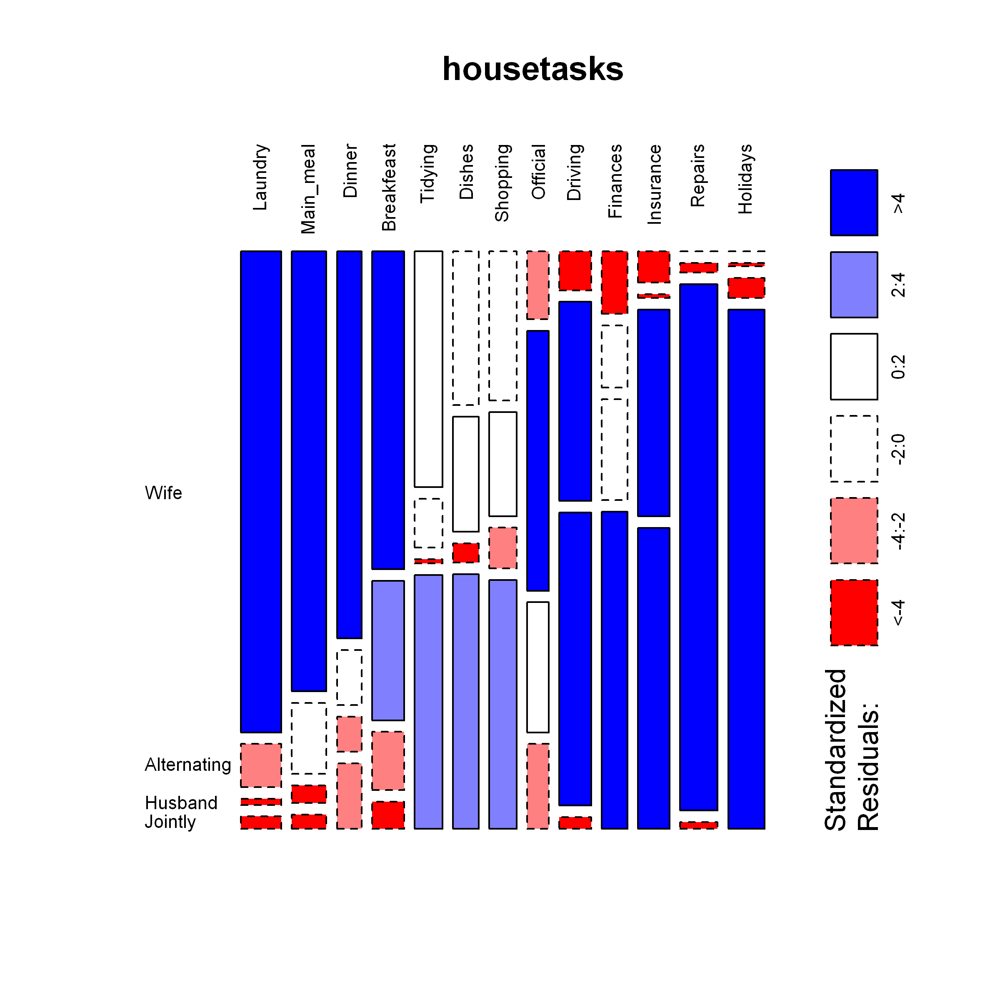

In [219]:
options(repr.plot.width =6, repr.plot.height = 6, repr.plot.res = 400)
library("graphics")
mosaicplot(dt, shade = TRUE, las=2,
           main = "housetasks")

A commonly stated assumption of the chi-squared test is the requirement
to have an expected count of at least 5 in each cell of the 2x2 table. For
larger tables, all expected counts should be > 1 and no more than 20% of all
cells should have expected counts < 5. If this assumption is not fulfilled, an
alternative test is Fisher’s exact test. For instance, if we are testing across a
2x4 table created from our age.factor variable and status_dss, then we receive
a warning

http://www.sthda.com/english/wiki/chi-square-test-of-independence-in-r

https://www.simplilearn.com/tutorials/statistics-tutorial/chi-square-test

# Logistic regression

: Multivariable logistic regression (A) with additive (B) and
multiplicative (C) effect modification.

In [220]:
melanoma <- boot::melanoma

In [221]:
summary(melanoma)

      time          status          sex              age             year     
 Min.   :  10   Min.   :1.00   Min.   :0.0000   Min.   : 4.00   Min.   :1962  
 1st Qu.:1525   1st Qu.:1.00   1st Qu.:0.0000   1st Qu.:42.00   1st Qu.:1968  
 Median :2005   Median :2.00   Median :0.0000   Median :54.00   Median :1970  
 Mean   :2153   Mean   :1.79   Mean   :0.3854   Mean   :52.46   Mean   :1970  
 3rd Qu.:3042   3rd Qu.:2.00   3rd Qu.:1.0000   3rd Qu.:65.00   3rd Qu.:1972  
 Max.   :5565   Max.   :3.00   Max.   :1.0000   Max.   :95.00   Max.   :1977  
   thickness         ulcer      
 Min.   : 0.10   Min.   :0.000  
 1st Qu.: 0.97   1st Qu.:0.000  
 Median : 1.94   Median :0.000  
 Mean   : 2.92   Mean   :0.439  
 3rd Qu.: 3.56   3rd Qu.:1.000  
 Max.   :17.42   Max.   :1.000  

In [222]:
head(melanoma)

,time,status,sex,age,year,thickness,ulcer
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,10,3,1,76,1972,6.76,1
2,30,3,1,56,1968,0.65,0
3,35,2,1,41,1977,1.34,0
4,99,3,0,71,1968,2.90,0
5,185,1,1,52,1965,12.08,1
6,204,1,1,28,1971,4.84,1


In [223]:
library(tidyverse)
library(finalfit)
melanoma <- melanoma %>%
mutate(sex.factor = factor(sex) %>%
       fct_recode("Female" = "0",
                  "Male" = "1") %>%
       ff_label("Sex"),
       
       ulcer.factor = factor(ulcer) %>%
       fct_recode("Present" = "1",
                  "Absent" = "0") %>%
       ff_label("Ulcerated tumour"),
       
       age = ff_label(age, "Age (years)"),
       year = ff_label(year, "Year"),
       status.factor = factor(status) %>%
       fct_recode("Died melanoma" = "1",
                  "Alive" = "2",
                  "Died - other" = "3") %>%
       
       fct_relevel("Alive") %>%
       ff_label("Status"),
       t_stage.factor =
       thickness %>%
       cut(breaks = c(0, 1.0, 2.0, 4.0,max(thickness, na.rm=TRUE)),
           include.lowest = TRUE)
      )


In [224]:
head(melanoma)

,time,status,sex,age,year,thickness,ulcer,sex.factor,ulcer.factor,status.factor,t_stage.factor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>
1,10,3,1,76,1972,6.76,1,Male,Present,Died - other,"(4,17.4]"
2,30,3,1,56,1968,0.65,0,Male,Absent,Died - other,"[0,1]"
3,35,2,1,41,1977,1.34,0,Male,Absent,Alive,"(1,2]"
4,99,3,0,71,1968,2.90,0,Female,Absent,Died - other,"(2,4]"
5,185,1,1,52,1965,12.08,1,Male,Present,Died melanoma,"(4,17.4]"
6,204,1,1,28,1971,4.84,1,Male,Present,Died melanoma,"(4,17.4]"


In [225]:
melanoma$t_stage.factor %>% levels()

[1] "[0,1]"    "(1,2]"    "(2,4]"    "(4,17.4]"

In [226]:
melanoma <- melanoma %>%
mutate(t_stage.factor =
       fct_recode(t_stage.factor,
                  "T1" = "[0,1]",
                  "T2" = "(1,2]",
                  "T3" = "(2,4]",
                  "T4" = "(4,17.4]") %>%
       ff_label("T-stage")
      )

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


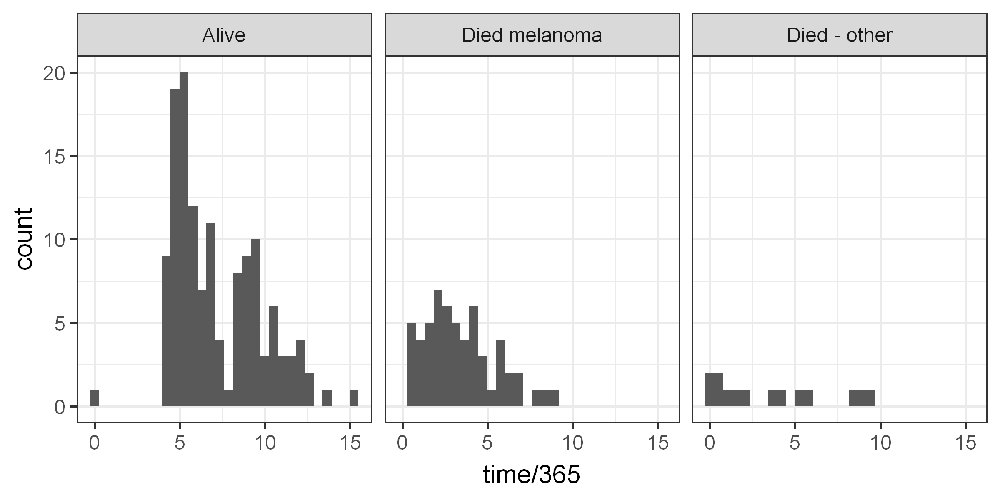

In [227]:
library(ggplot2)
options(repr.plot.width =6, repr.plot.height = 3, repr.plot.res = 400)

melanoma %>%
ggplot(aes(x = time/365)) +
geom_histogram() +
facet_grid(. ~ status.factor)


In [228]:
# 5-year mortality
melanoma <- melanoma %>%
mutate(mort_5yr =if_else((time/365) < 5 &(status == 1),"Yes", # then
                         "No") %>% # else
       fct_relevel("No") %>%
       ff_label("5-year survival"))


In [229]:
p1 <- melanoma %>%
ggplot(aes(x = ulcer.factor, fill = mort_5yr)) +geom_bar() +
theme(legend.position = "none")
p2 <- melanoma %>%ggplot(aes(x = ulcer.factor, fill = mort_5yr)) +
geom_bar(position = "fill") +
ylab("proportion")

In [230]:
library(finalfit)
dependent <- "ulcer.factor"
explanatory <- c("age", "sex.factor", "year", "t_stage.factor")
melanoma %>%
summary_factorlist(dependent, explanatory, p = TRUE,
add_dependent_label = TRUE)

Dependent: Ulcerated tumour,,Absent,Present,p
<chr>,<chr>,<chr>,<chr>,<chr>
Age (years),Mean (SD),50.6 (15.9),54.8 (17.4),0.072
Sex,Female,79 (68.7),47 (52.2),0.024
,Male,36 (31.3),43 (47.8),
Year,Mean (SD),1970.0 (2.7),1969.8 (2.4),0.637
T-stage,T1,51 (44.3),5 (5.6),<0.001
,T2,36 (31.3),17 (18.9),
,T3,21 (18.3),30 (33.3),
,T4,7 (6.1),38 (42.2),


In [231]:
head(melanoma, 2)

,time,status,sex,age,year,thickness,ulcer,sex.factor,ulcer.factor,status.factor,t_stage.factor,mort_5yr
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>
1,10,3,1,76,1972,6.76,1,Male,Present,Died - other,T4,No
2,30,3,1,56,1968,0.65,0,Male,Absent,Died - other,T1,No


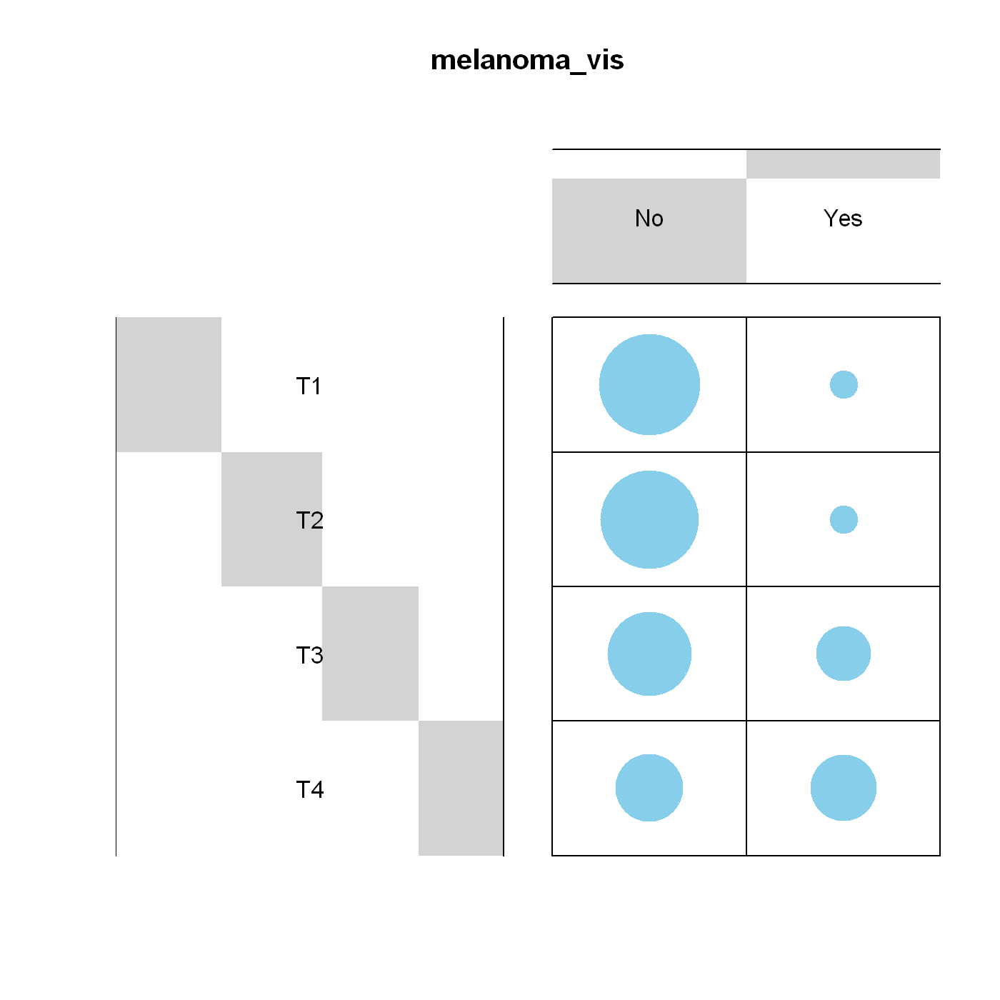

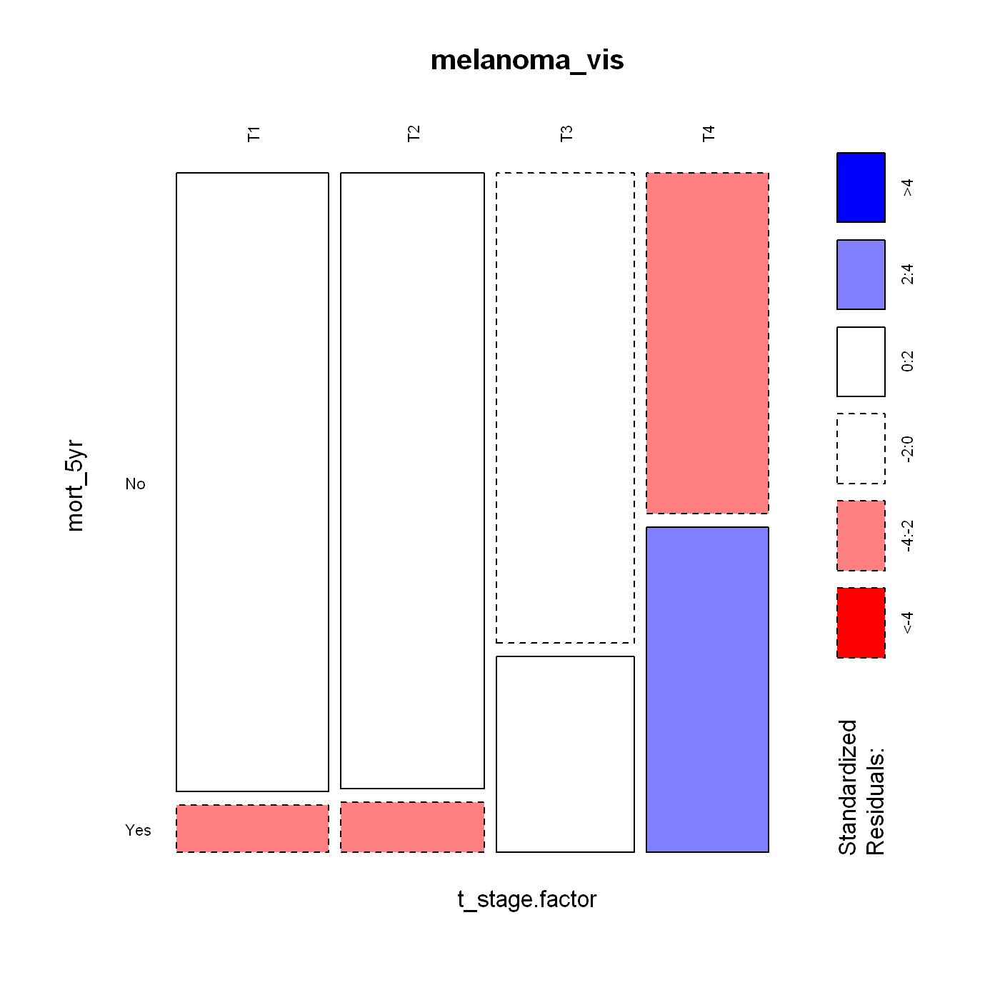

In [232]:
options(repr.plot.width =7, repr.plot.height = 7, repr.plot.res = 200)
melanoma_vis <- with(melanoma , table(t_stage.factor, mort_5yr))
dt <- as.table(as.matrix(melanoma_vis))
balloonplot(t(dt), main ="melanoma_vis", xlab ="", ylab="",
            label = FALSE, show.margins = FALSE)
mosaicplot(dt, shade = TRUE, las=2,
           main = "melanoma_vis")

1. Binary dependent variable - this is obvious, but as above we need
to check (alive, death from disease, death from other causes doesn’t
work);
2. Independence of observations - the observations should not be repeated measurements or matched data;
3. Linearity of continuous explanatory variables and the log-odds outcome - take age as an example. If the outcome, say death, gets more
frequent or less frequent as age rises, the model will work well. However, say children and the elderly are at high risk of death, but those
in middle years are not, then the relationship is not linear. Or more
correctly, it is not monotonic, meaning that the response does not
only go in one direction;
4. No multicollinearity - explanatory variables should not be highly correlated with each other.

**Linearity of continuous variables to the response**

`geom_smooth()` using formula = 'y ~ x'


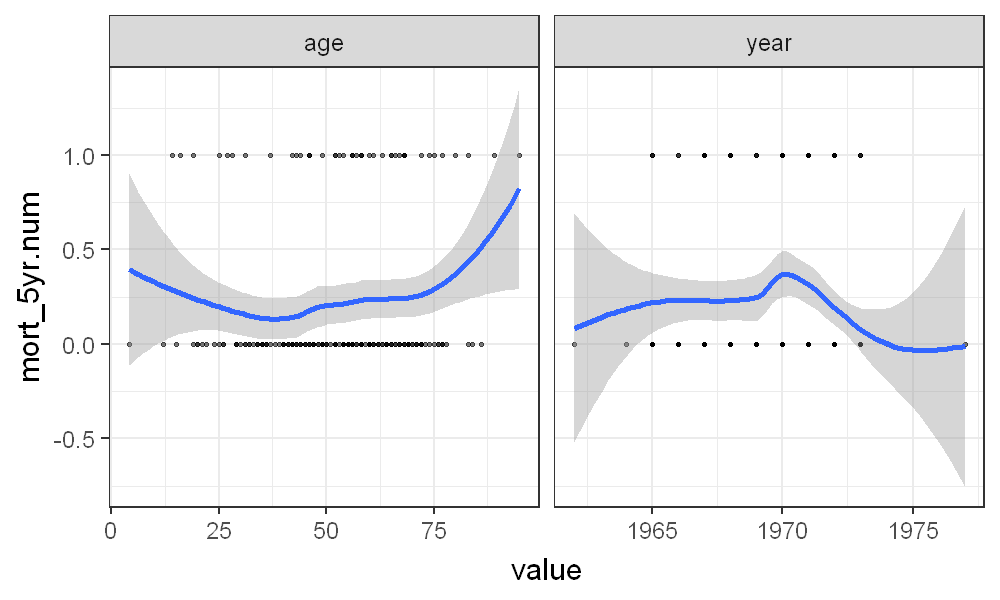

In [233]:
options(repr.plot.width =5, repr.plot.height = 3, repr.plot.res = 200)
melanoma %>%
mutate(
mort_5yr.num = as.numeric(mort_5yr) - 1
) %>%
select(mort_5yr.num, age, year) %>%
pivot_longer(all_of(c("age", "year")), names_to = "predictors") %>%
ggplot(aes(x = value, y = mort_5yr.num)) +
geom_point(size = 0.5, alpha = 0.5) +
geom_smooth(method = "loess") +
facet_wrap(~predictors, scales = "free_x")


This is on the probability scale, so it is not going to be straight. But it should
be monotonic - it should only ever go up or down.

**Multicollinearity**

To detect this, we can use a specific metric called the variance
inflation factor.

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


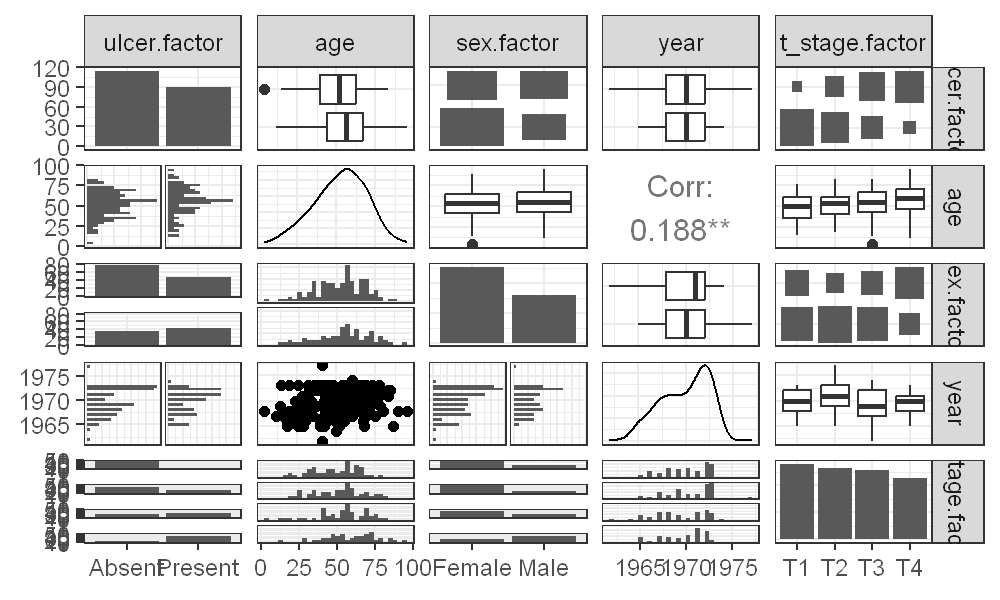

In [234]:
library(GGally)
options(repr.plot.width =5, repr.plot.height = 3, repr.plot.res = 200)

explanatory <- c("ulcer.factor", "age", "sex.factor",
"year", "t_stage.factor")
melanoma %>%
remove_labels() %>% # ggpairs doesn't work well with labels
ggpairs(columns = explanatory)


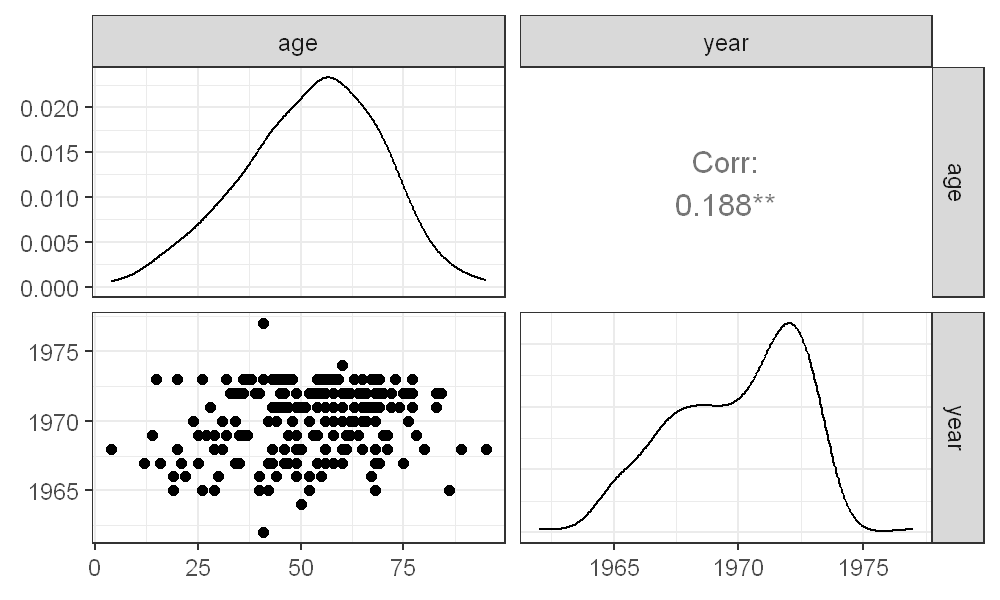

In [235]:
options(repr.plot.width =5, repr.plot.height = 3, repr.plot.res = 200)

select_explanatory <- c("age", "year")
melanoma %>%
remove_labels() %>%
ggpairs(columns = select_explanatory)


Continuous to categorical

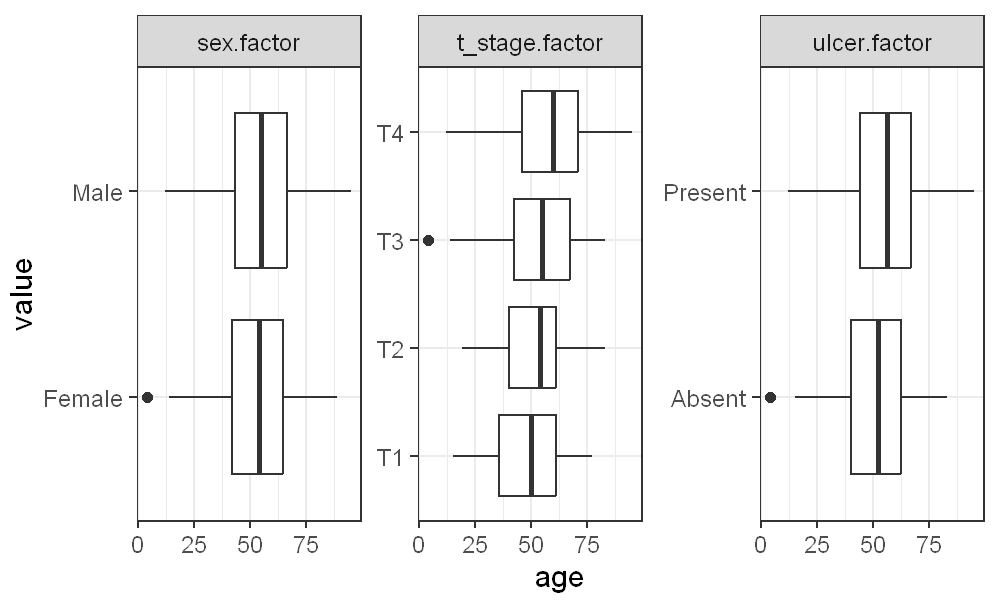

In [236]:
options(repr.plot.width =5, repr.plot.height = 3, repr.plot.res = 200)
select_explanatory <- c("age", "ulcer.factor",
"sex.factor", "t_stage.factor")
melanoma %>%
select(all_of(select_explanatory)) %>%
pivot_longer(-age) %>% # pivots all but age into two columns: name and value
ggplot(aes(value, age)) +
geom_boxplot() +
facet_wrap(~name, scale = "free", ncol = 3) +
coord_flip()

Categorical to categorical

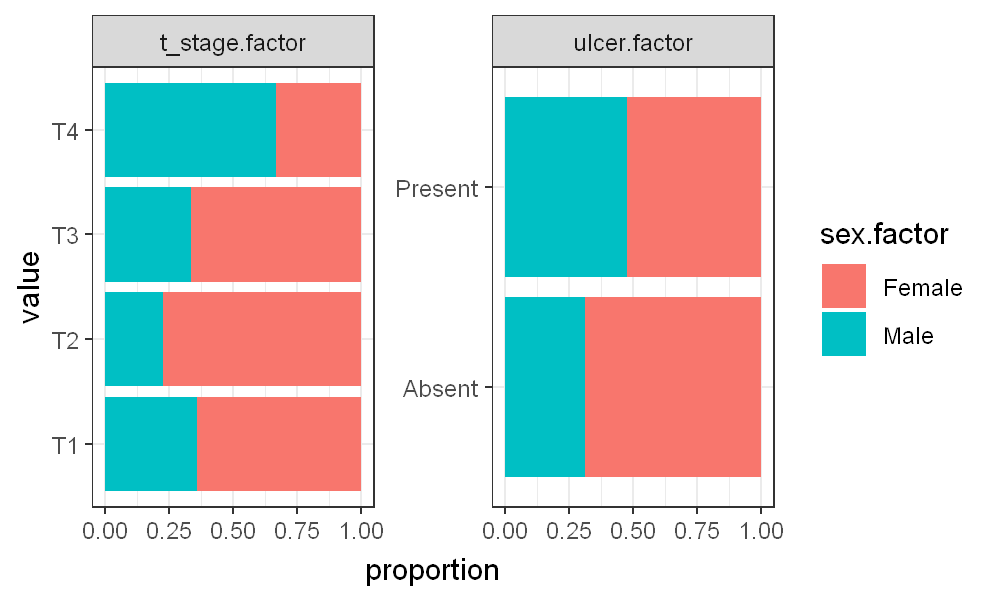

In [237]:

select_explanatory <- c("ulcer.factor", "sex.factor", "t_stage.factor")
options(repr.plot.width =5, repr.plot.height = 3, repr.plot.res = 200)
melanoma %>%select(one_of(select_explanatory)) %>%pivot_longer(-sex.factor) %>%
ggplot(aes(value, fill = sex.factor)) +
geom_bar(position = "fill") +
ylab("proportion") +
facet_wrap(~name, scale = "free", ncol = 2) +
coord_flip()

# VIF

In [238]:
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "age", "sex.factor","year", "t_stage.factor")
melanoma %>%
glmmulti(dependent, explanatory) %>%
car::vif()

,GVIF,Df,GVIF^(1/(2*Df))
ulcer.factor,1.313355,1,1.146017
age,1.102313,1,1.049911
sex.factor,1.124990,1,1.060655
year,1.102490,1,1.049995
t_stage.factor,1.475550,3,1.066987


In [239]:
fit1 <- glm(mort_5yr ~ ulcer.factor, data = melanoma, family = binomial)
summary(fit1)


Call:
glm(formula = mort_5yr ~ ulcer.factor, family = binomial, data = melanoma)

Coefficients:
                    Estimate Std. Error z value Pr(>|z|)    
(Intercept)          -2.3514     0.3309  -7.105 1.20e-12 ***
ulcer.factorPresent   1.8994     0.3953   4.805 1.55e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 215.78  on 204  degrees of freedom
Residual deviance: 188.24  on 203  degrees of freedom
AIC: 192.24

Number of Fisher Scoring iterations: 5


In [240]:
coef(fit1) %>% exp()

(Intercept) ulcer.factorPresent 
          0.0952381           6.6818182

In [241]:
confint(fit1) %>% exp()

Waiting for profiling to be done...



,2.5 %,97.5 %
(Intercept),0.04662675,0.1730265
ulcer.factorPresent,3.18089978,15.1827225


In [242]:
fit1 <- glm(mort_5yr ~ ulcer.factor, data = melanoma, family = binomial)
summary(fit1)


Call:
glm(formula = mort_5yr ~ ulcer.factor, family = binomial, data = melanoma)

Coefficients:
                    Estimate Std. Error z value Pr(>|z|)    
(Intercept)          -2.3514     0.3309  -7.105 1.20e-12 ***
ulcer.factorPresent   1.8994     0.3953   4.805 1.55e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 215.78  on 204  degrees of freedom
Residual deviance: 188.24  on 203  degrees of freedom
AIC: 192.24

Number of Fisher Scoring iterations: 5


In [243]:
coef(fit1) %>% exp()

(Intercept) ulcer.factorPresent 
          0.0952381           6.6818182

In [244]:
confint(fit1)  %>% exp()

Waiting for profiling to be done...



,2.5 %,97.5 %
(Intercept),0.04662675,0.1730265
ulcer.factorPresent,3.18089978,15.1827225


In [245]:
library(broom)
fit1 %>%
tidy(conf.int = TRUE, exp = TRUE)

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.0952381,0.3309438,-7.105059,1.202708e-12,0.04662675,0.1730265
ulcer.factorPresent,6.6818182,0.3953189,4.804704,1.549810e-06,3.18089978,15.1827225


In [246]:
fit1 %>%
glance()

null.deviance,df.null,logLik,AIC,BIC,deviance,df.residual,nobs
<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
215.7788,204,-94.11787,192.2357,198.8818,188.2357,203,205


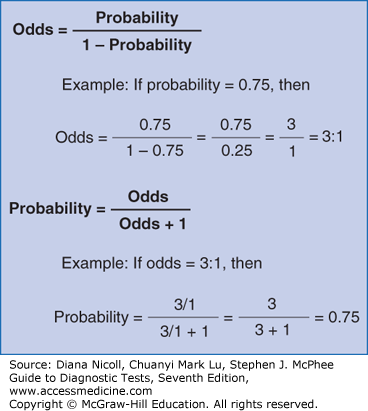

1. As few explanatory variables should be used as possible (parsimony);

2. Explanatory variables associated with the outcome variable in previous studies should be accounted for;

3. Demographic variables should be included in model exploration;

4. Population stratification should be incorporated if available;

5. Interactions should be checked and included if influential;

6. Final model selection should be performed using a “criterion-based approach”


• minimise the Akaike information criterion (AIC)

• maximise the c-statistic (area under the receiver operator curve).


In [247]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- "ulcer.factor"
melanoma %>%
finalfit(dependent, explanatory, metrics = TRUE)

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[[1]]
 Dependent: 5-year survival                 No       Yes
           Ulcerated tumour  Absent 105 (91.3)  10 (8.7)
                            Present  55 (61.1) 35 (38.9)
           OR (univariable)         OR (multivariable)
                          -                          -
 6.68 (3.18-15.18, p<0.001) 6.68 (3.18-15.18, p<0.001)

[[2]]
                                                                                                                                
 Number in dataframe = 205, Number in model = 205, Missing = 0, AIC = 192.2, C-statistic = 0.717, H&L = Chi-sq(8) 0.00 (p=1.000)

In [248]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "age", "sex.factor", "t_stage.factor")
fit2 = melanoma %>%
finalfit(dependent, explanatory, metrics = TRUE)

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



In [249]:
fit2

,Dependent: 5-year survival,,No,Yes,OR (univariable),OR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
8,Ulcerated tumour,Absent,105 (91.3),10 (8.7),-,-
9,,Present,55 (61.1),35 (38.9),"6.68 (3.18-15.18, p<0.001)","3.21 (1.32-8.28, p=0.012)"
1,Age (years),Mean (SD),51.7 (16.0),55.3 (18.8),"1.01 (0.99-1.03, p=0.202)","1.00 (0.98-1.02, p=0.948)"
2,Sex,Female,105 (83.3),21 (16.7),-,-
3,,Male,55 (69.6),24 (30.4),"2.18 (1.12-4.30, p=0.023)","1.26 (0.57-2.76, p=0.558)"
4,T-stage,T1,52 (92.9),4 (7.1),-,-
5,,T2,49 (92.5),4 (7.5),"1.06 (0.24-4.71, p=0.936)","0.77 (0.16-3.58, p=0.733)"
6,,T3,36 (70.6),15 (29.4),"5.42 (1.80-20.22, p=0.005)","2.98 (0.86-12.10, p=0.098)"
7,,T4,23 (51.1),22 (48.9),"12.43 (4.21-46.26, p<0.001)","4.98 (1.34-21.64, p=0.021)"


We can either convert age to a categorical variable or include it with a
quadratic term (𝑥
2 + 𝑥, remember parabolas from school?).

`geom_smooth()` using formula = 'y ~ x'


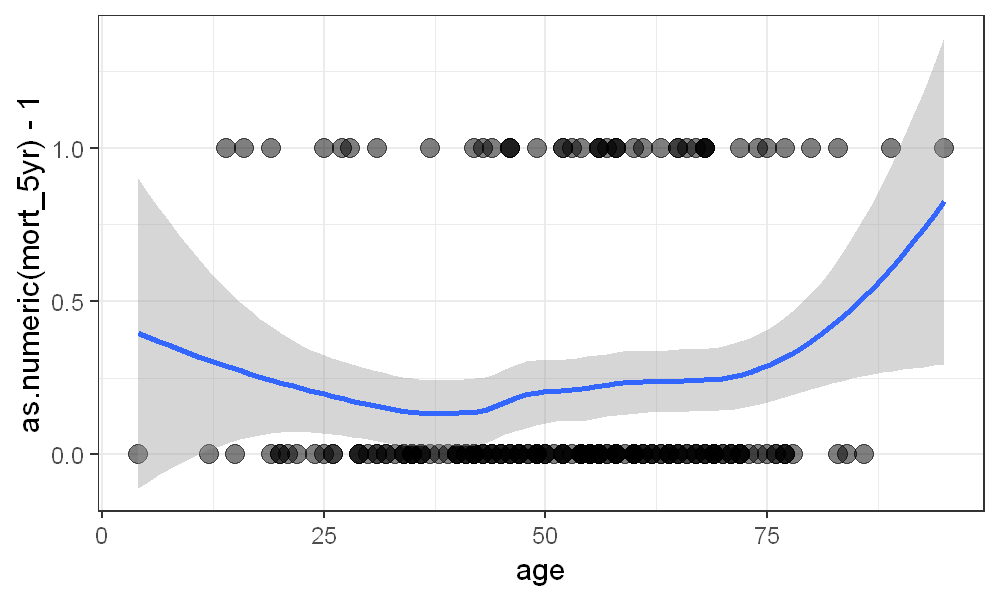

In [250]:
melanoma  %>% ggplot(aes(age, as.numeric(mort_5yr)-1)) + geom_point(alpha=0.5, size=3) + geom_smooth(method = "loess")

In [251]:
melanoma <- melanoma %>%
mutate(
age.factor = cut(age,
breaks = c(0, 25, 50, 75, 100)) %>%
    ff_label("Age (years)"))
# Add this to relevel:
# fct_relevel("(50,75]")
melanoma %>%
finalfit(dependent, c("ulcer.factor", "age.factor"), metrics = TRUE)
    

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[[1]]
 Dependent: 5-year survival                  No       Yes
           Ulcerated tumour   Absent 105 (91.3)  10 (8.7)
                             Present  55 (61.1) 35 (38.9)
                Age (years)   (0,25]  10 (71.4)  4 (28.6)
                             (25,50]  62 (84.9) 11 (15.1)
                             (50,75]  79 (76.0) 25 (24.0)
                            (75,100]   9 (64.3)  5 (35.7)
           OR (univariable)         OR (multivariable)
                          -                          -
 6.68 (3.18-15.18, p<0.001) 6.28 (2.97-14.35, p<0.001)
                          -                          -
  0.44 (0.12-1.84, p=0.229)  0.54 (0.13-2.44, p=0.400)
  0.79 (0.24-3.08, p=0.712)  0.81 (0.22-3.39, p=0.753)
  1.39 (0.28-7.23, p=0.686)  1.12 (0.20-6.53, p=0.894)

[[2]]
                                                                                                                                
 Number in dataframe = 205, Number in model = 205, Missing = 0, AIC = 196.6, C-statistic = 0.742, H&L = Chi-sq(8) 0.20 (p=1.000)

There is no strong relationship between the categorical representation of age
and the outcome. Let’s try a quadratic term.


In [252]:
glm(mort_5yr ~ ulcer.factor +I(age^2) + age,
data = melanoma, family = binomial) %>%
summary()


Call:
glm(formula = mort_5yr ~ ulcer.factor + I(age^2) + age, family = binomial, 
    data = melanoma)

Coefficients:
                      Estimate Std. Error z value Pr(>|z|)    
(Intercept)         -1.2636638  1.2058471  -1.048    0.295    
ulcer.factorPresent  1.8423431  0.3991559   4.616 3.92e-06 ***
I(age^2)             0.0006277  0.0004613   1.361    0.174    
age                 -0.0567465  0.0476011  -1.192    0.233    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 215.78  on 204  degrees of freedom
Residual deviance: 185.98  on 201  degrees of freedom
AIC: 193.98

Number of Fisher Scoring iterations: 5


In [253]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "I(age^2)", "age")
melanoma %>%
finalfit(dependent, explanatory, metrics = TRUE)

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[[1]]
 Dependent: 5-year survival                    No         Yes
           Ulcerated tumour    Absent  105 (91.3)    10 (8.7)
                              Present   55 (61.1)   35 (38.9)
                Age (years) Mean (SD) 51.7 (16.0) 55.3 (18.8)
                   I(age^2)                                  
           OR (univariable)         OR (multivariable)
                          -                          -
 6.68 (3.18-15.18, p<0.001) 6.31 (2.98-14.44, p<0.001)
  1.01 (0.99-1.03, p=0.202)  0.94 (0.86-1.04, p=0.233)
  1.00 (1.00-1.00, p=0.101)  1.00 (1.00-1.00, p=0.174)

[[2]]
                                                                                                                              
 Number in dataframe = 205, Number in model = 205, Missing = 0, AIC = 194, C-statistic = 0.748, H&L = Chi-sq(8) 5.24 (p=0.732)

The AIC is worse when adding age either as a factor or with a quadratic term
to the base model.

In [254]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "age.factor", "sex.factor", "t_stage.factor")
explanatory_multi <- c("ulcer.factor", "sex.factor", "t_stage.factor")
melanoma %>%
finalfit(dependent, explanatory, explanatory_multi,
keep_models = TRUE, metrics = TRUE)

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



,Dependent: 5-year survival,,No,Yes,OR (univariable),OR (multivariable full),OR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
11,Ulcerated tumour,Absent,105 (91.3),10 (8.7),-,-,-
12,,Present,55 (61.1),35 (38.9),"6.68 (3.18-15.18, p<0.001)","3.06 (1.25-7.93, p=0.017)","3.21 (1.32-8.28, p=0.012)"
1,Age (years),"(0,25]",10 (71.4),4 (28.6),-,-,-
2,,"(25,50]",62 (84.9),11 (15.1),"0.44 (0.12-1.84, p=0.229)","0.37 (0.08-1.80, p=0.197)",-
3,,"(50,75]",79 (76.0),25 (24.0),"0.79 (0.24-3.08, p=0.712)","0.60 (0.15-2.65, p=0.469)",-
4,,"(75,100]",9 (64.3),5 (35.7),"1.39 (0.28-7.23, p=0.686)","0.61 (0.09-4.04, p=0.599)",-
5,Sex,Female,105 (83.3),21 (16.7),-,-,-
6,,Male,55 (69.6),24 (30.4),"2.18 (1.12-4.30, p=0.023)","1.21 (0.54-2.68, p=0.633)","1.26 (0.57-2.76, p=0.559)"
7,T-stage,T1,52 (92.9),4 (7.1),-,-,-


 Given
all this, we will decide not to include age in the model.

In [255]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "sex.factor", "t_stage.factor")
explanatory_multi <- c("ulcer.factor", "t_stage.factor")
melanoma %>%
finalfit(dependent, explanatory, explanatory_multi,
keep_models = TRUE, metrics = TRUE)


Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



,Dependent: 5-year survival,,No,Yes,OR (univariable),OR (multivariable full),OR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
7,Ulcerated tumour,Absent,105 (91.3),10 (8.7),-,-,-
8,,Present,55 (61.1),35 (38.9),"6.68 (3.18-15.18, p<0.001)","3.21 (1.32-8.28, p=0.012)","3.26 (1.35-8.39, p=0.011)"
1,Sex,Female,105 (83.3),21 (16.7),-,-,-
2,,Male,55 (69.6),24 (30.4),"2.18 (1.12-4.30, p=0.023)","1.26 (0.57-2.76, p=0.559)",-
3,T-stage,T1,52 (92.9),4 (7.1),-,-,-
4,,T2,49 (92.5),4 (7.5),"1.06 (0.24-4.71, p=0.936)","0.77 (0.16-3.58, p=0.733)","0.75 (0.16-3.45, p=0.700)"
5,,T3,36 (70.6),15 (29.4),"5.42 (1.80-20.22, p=0.005)","2.99 (0.86-12.11, p=0.097)","2.96 (0.86-11.96, p=0.098)"
6,,T4,23 (51.1),22 (48.9),"12.43 (4.21-46.26, p<0.001)","5.01 (1.37-21.52, p=0.020)","5.33 (1.48-22.56, p=0.014)"


We will exclude sex from our final model as well.

In [256]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "t_stage.factor")
explanatory_multi <- c("ulcer.factor*t_stage.factor")
melanoma %>%
finalfit(dependent, explanatory, explanatory_multi,
keep_models = TRUE, metrics = TRUE)


Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



,Dependent: 5-year survival,,No,Yes,OR (univariable),OR (multivariable full),OR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
5,Ulcerated tumour,Absent,105 (91.3),10 (8.7),-,-,-
6,,Present,55 (61.1),35 (38.9),"6.68 (3.18-15.18, p<0.001)","3.26 (1.35-8.39, p=0.011)","4.00 (0.18-41.34, p=0.274)"
1,T-stage,T1,52 (92.9),4 (7.1),-,-,-
2,,T2,49 (92.5),4 (7.5),"1.06 (0.24-4.71, p=0.936)","0.75 (0.16-3.45, p=0.700)","0.94 (0.12-5.97, p=0.949)"
3,,T3,36 (70.6),15 (29.4),"5.42 (1.80-20.22, p=0.005)","2.96 (0.86-11.96, p=0.098)","3.76 (0.76-20.80, p=0.104)"
4,,T4,23 (51.1),22 (48.9),"12.43 (4.21-46.26, p<0.001)","5.33 (1.48-22.56, p=0.014)","2.67 (0.12-25.11, p=0.426)"
7,ulcer.factorPresent:t_stage.factorT2,Interaction,-,-,NA,NA,"0.57 (0.02-21.55, p=0.730)"
8,ulcer.factorPresent:t_stage.factorT3,Interaction,-,-,NA,NA,"0.62 (0.04-17.39, p=0.735)"
9,ulcer.factorPresent:t_stage.factorT4,Interaction,-,-,NA,NA,"1.85 (0.09-94.20, p=0.716)"


As a final we can check for a first-order interaction between ulceration and
T-stage. Just to remind us what this means, a significant interaction would
mean the effect of, say, ulceration on 5-year mortality would differ by T-stage.
For instance, perhaps the presence of ulceration confers a much greater risk of
death in advanced deep tumours compared with earlier superficial tumours.

There are no significant interaction terms.
Our final model table is therefore:

In [257]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "age.factor",
"sex.factor", "t_stage.factor")
explanatory_multi <- c("ulcer.factor", "t_stage.factor")
melanoma %>%
finalfit(dependent, explanatory, explanatory_multi, metrics = TRUE)

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



,Dependent: 5-year survival,,No,Yes,OR (univariable),OR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
11,Ulcerated tumour,Absent,105 (91.3),10 (8.7),-,-
12,,Present,55 (61.1),35 (38.9),"6.68 (3.18-15.18, p<0.001)","3.26 (1.35-8.39, p=0.011)"
1,Age (years),"(0,25]",10 (71.4),4 (28.6),-,-
2,,"(25,50]",62 (84.9),11 (15.1),"0.44 (0.12-1.84, p=0.229)",-
3,,"(50,75]",79 (76.0),25 (24.0),"0.79 (0.24-3.08, p=0.712)",-
4,,"(75,100]",9 (64.3),5 (35.7),"1.39 (0.28-7.23, p=0.686)",-
5,Sex,Female,105 (83.3),21 (16.7),-,-
6,,Male,55 (69.6),24 (30.4),"2.18 (1.12-4.30, p=0.023)",-
7,T-stage,T1,52 (92.9),4 (7.1),-,-


Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Warning message:
"Removed 2 rows containing missing values (`geom_errorbarh()`)."


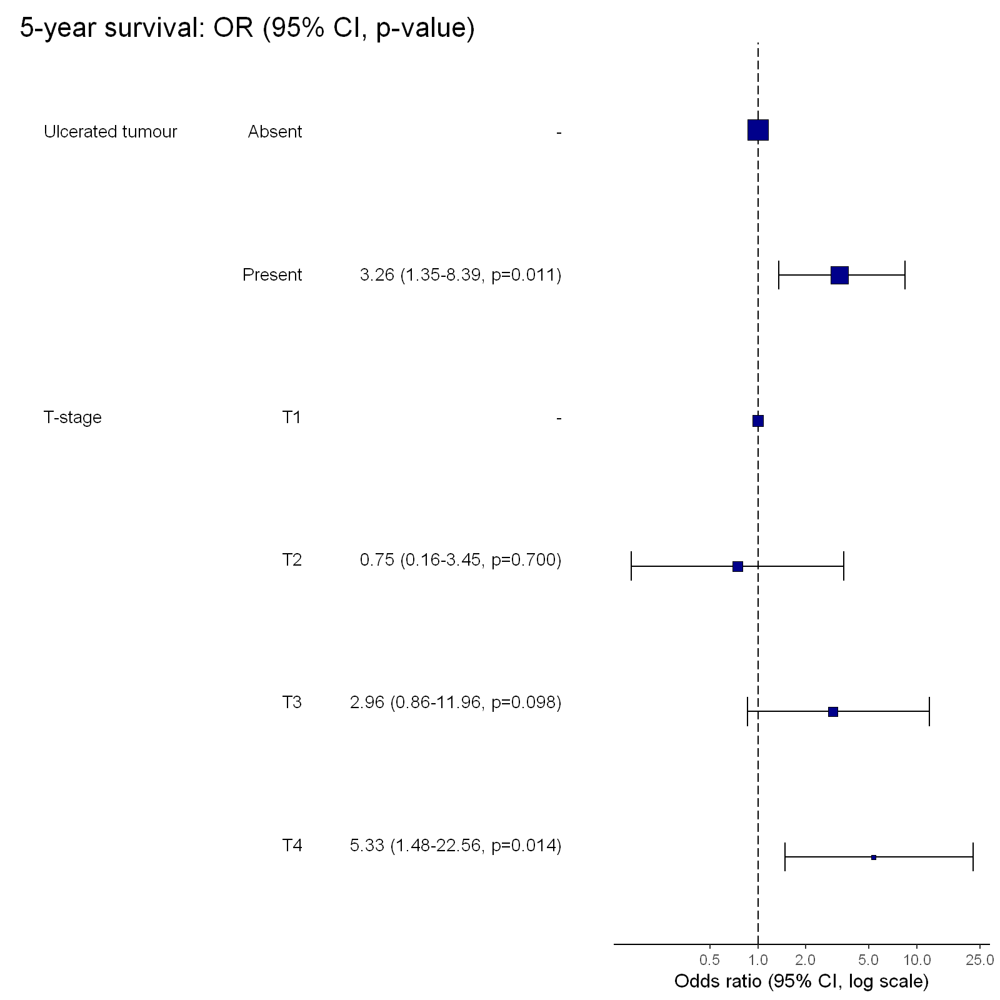

In [258]:
options(repr.plot.width =8, repr.plot.height = 8, repr.plot.res = 200)
dependent <- "mort_5yr"
explanatory_multi <- c("ulcer.factor", "t_stage.factor")
melanoma %>%
or_plot(dependent, explanatory_multi,
breaks = c(0.5, 1, 2, 5, 10, 25),
table_text_size = 3.5,
title_text_size = 16)

##  mixed effects model, multilevel model, or hierarchical model

Correlations may be as
simple as being treated within the same hospital. By virtue of this fact, these
patients may have commonalities that have not been captured by the observed
variables.

One approach is to include grouping variables as random effects. These may be
nested with each other, for example patients within hospitals within countries.
These are added in addition to the fixed effects we have been dealing with up
until now

In [259]:
# Simulate random hospital identifier
set.seed(1)
melanoma <- melanoma %>%
mutate(hospital_id = sample(1:4, 205, replace = TRUE))
melanoma <- melanoma %>%
mutate(hospital_id = c(rep(1:3, 50), rep(4, 55)))


### ‘random intercept model’

The random intercept
model constrains lines to be parallel, in a similar way to the additive models

`geom_smooth()` using formula = 'y ~ x'
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at 0.985"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 2.015"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  6.3233e-17"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 1"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at 0.985"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 2.015"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1.2779e-16"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parame

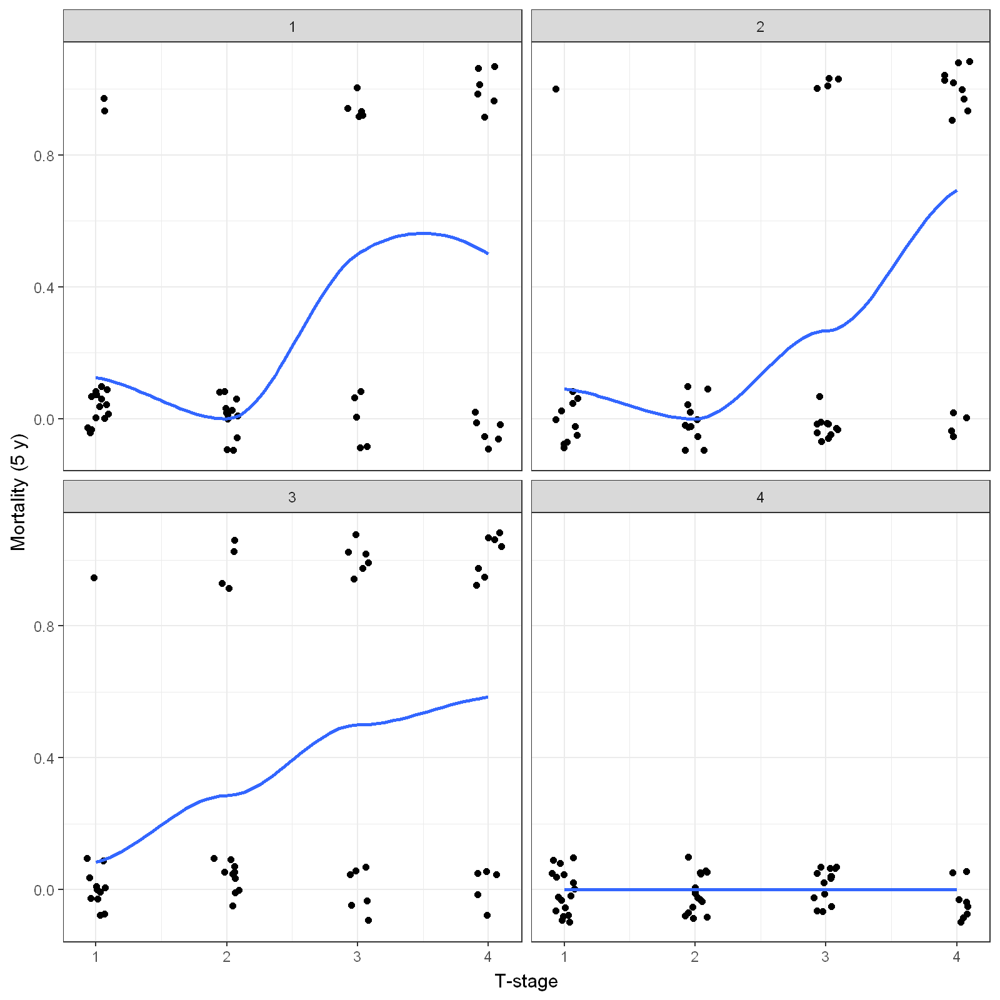

In [260]:
melanoma %>%
mutate(
mort_5yr.num = as.numeric(mort_5yr) - 1 # Convert factor to 0 and 1
) %>%
ggplot(aes(x = as.numeric(t_stage.factor), y = mort_5yr.num)) +
geom_jitter(width = 0.1, height = 0.1) +
geom_smooth(method = 'loess', se = FALSE) +
facet_wrap(~hospital_id) +
labs(x= "T-stage", y = "Mortality (5 y)")

In [261]:
library(lme4)


Loading required package: Matrix


Attaching package: 'Matrix'


The following objects are masked from 'package:tidyr':

    expand, pack, unpack




Generalized linear mixed model

In [262]:
melanoma %>%
glmer(mort_5yr ~ t_stage.factor + (1 | hospital_id),
data = ., family = "binomial") %>%
summary()


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: mort_5yr ~ t_stage.factor + (1 | hospital_id)
   Data: .

     AIC      BIC   logLik deviance df.resid 
   174.6    191.2    -82.3    164.6      200 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.4507 -0.3930 -0.2891 -0.0640  3.4591 

Random effects:
 Groups      Name        Variance Std.Dev.
 hospital_id (Intercept) 2.619    1.618   
Number of obs: 205, groups:  hospital_id, 4

Fixed effects:
                 Estimate Std. Error z value Pr(>|z|)    
(Intercept)      -3.13132    1.01451  -3.087  0.00203 ** 
t_stage.factorT2  0.02256    0.74792   0.030  0.97593    
t_stage.factorT3  1.82349    0.62920   2.898  0.00375 ** 
t_stage.factorT4  2.61190    0.62806   4.159  3.2e-05 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Correlation of Fixed Effects:
            (Intr) t_s.T2 t_s.T3
t_stg.fctT2 -0.365              

In [263]:
dependent <- "mort_5yr"
explanatory <- "t_stage.factor"
random_effect <- "hospital_id" # Is the same as:
random_effect <- "(1 | hospital_id)"
melanoma %>%
finalfit(dependent, explanatory,
random_effect = random_effect,
metrics = TRUE)


Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[[1]]
 Dependent: 5-year survival           No       Yes            OR (univariable)
                    T-stage T1 52 (92.9)   4 (7.1)                           -
                            T2 49 (92.5)   4 (7.5)   1.06 (0.24-4.71, p=0.936)
                            T3 36 (70.6) 15 (29.4)  5.42 (1.80-20.22, p=0.005)
                            T4 23 (51.1) 22 (48.9) 12.43 (4.21-46.26, p<0.001)
             OR (multilevel)
                           -
   1.02 (0.24-4.43, p=0.976)
  6.19 (1.80-21.26, p=0.004)
 13.63 (3.98-46.66, p<0.001)

[[2]]
                                                                             
 Number in model = 205, Number of groups = 4, AIC = 174.6, C-statistic = 0.86

In [264]:
library(finalfit)
dependent <- "mort_5yr"
explanatory <- c("ulcer.factor", "age.factor",
"sex.factor", "t_stage.factor")
explanatory_multi <- c("ulcer.factor", "t_stage.factor")
random_effect <- "hospital_id"
melanoma %>%
finalfit(dependent, explanatory, explanatory_multi, random_effect,
keep_models = TRUE,
metrics = TRUE)


Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases



,Dependent: 5-year survival,,No,Yes,OR (univariable),OR (multivariable full),OR (multilevel full),OR (multilevel)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
11,Ulcerated tumour,Absent,105 (91.3),10 (8.7),-,-,-,-
12,,Present,55 (61.1),35 (38.9),"6.68 (3.18-15.18, p<0.001)","3.06 (1.25-7.93, p=0.017)","2.37 (0.88-6.38, p=0.087)","2.49 (0.94-6.59, p=0.065)"
1,Age (years),"(0,25]",10 (71.4),4 (28.6),-,-,-,-
2,,"(25,50]",62 (84.9),11 (15.1),"0.44 (0.12-1.84, p=0.229)","0.37 (0.08-1.80, p=0.197)","0.22 (0.04-1.26, p=0.088)",-
3,,"(50,75]",79 (76.0),25 (24.0),"0.79 (0.24-3.08, p=0.712)","0.60 (0.15-2.65, p=0.469)","0.29 (0.05-1.54, p=0.146)",-
4,,"(75,100]",9 (64.3),5 (35.7),"1.39 (0.28-7.23, p=0.686)","0.61 (0.09-4.04, p=0.599)","0.18 (0.02-1.51, p=0.114)",-
5,Sex,Female,105 (83.3),21 (16.7),-,-,-,-
6,,Male,55 (69.6),24 (30.4),"2.18 (1.12-4.30, p=0.023)","1.21 (0.54-2.68, p=0.633)","1.28 (0.54-3.07, p=0.575)",-
7,T-stage,T1,52 (92.9),4 (7.1),-,-,-,-


As can be seen, incorporating the (made-up) hospital identifier has altered our
coefficients. It has also improved the model discrimination with a c-statistic
of 0.830 from 0.802. Note that the AIC should not be used to compare mixed
effects models estimated in this way with glm() models (the former uses a
restricted maximum likelihood [REML] approach by default, while glm() uses
maximum likelihood).

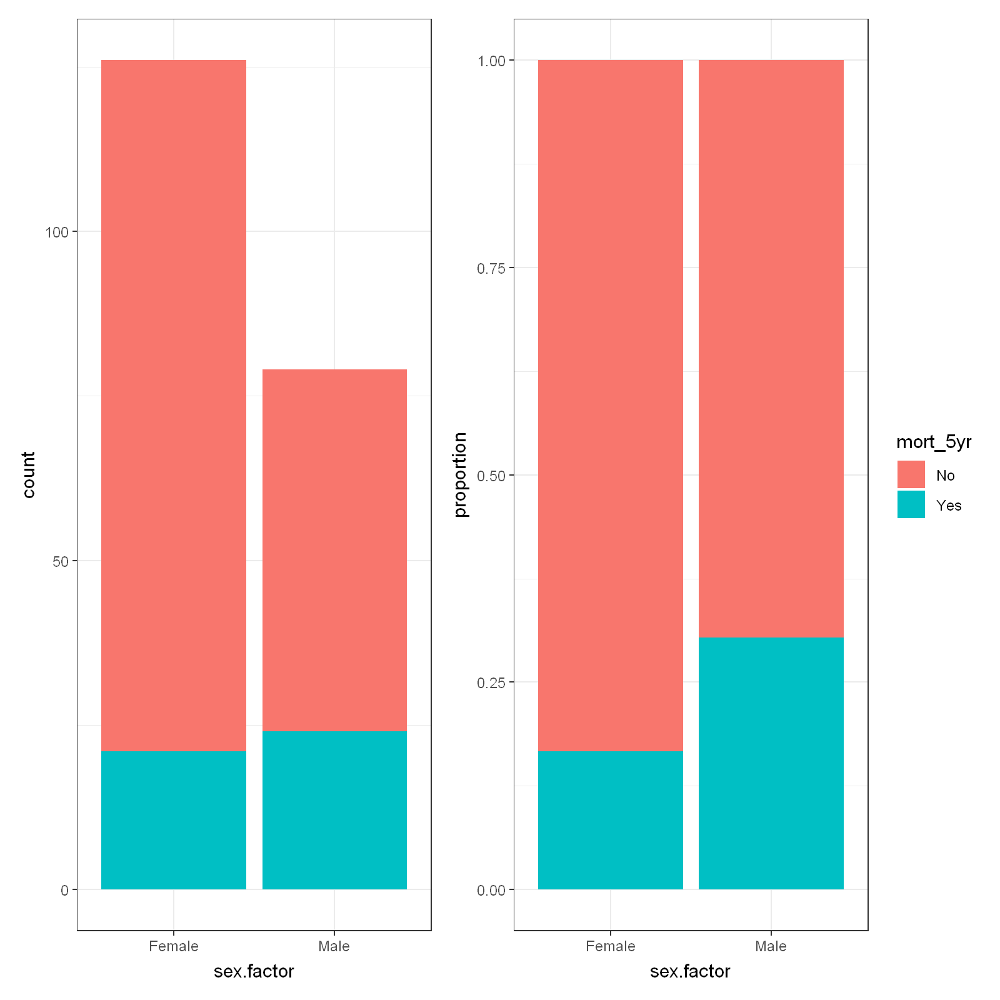

In [265]:
melanoma <- melanoma %>%
mutate(sex.factor = factor(sex) %>%
fct_recode("Female" = "0",
"Male" = "1") %>%
ff_label("Sex"),
ulcer.factor = factor(ulcer) %>%
fct_recode("Present" = "1",
"Absent" = "0") %>%
ff_label("Ulcerated tumour"),
age = ff_label(age, "Age (years)"),
year = ff_label(year, "Year"),
status.factor = factor(status) %>%
fct_recode("Died melanoma" = "1",
"Alive" = "2",
"Died - other" = "3") %>%
fct_relevel("Alive") %>%
ff_label("Status"),
t_stage.factor =
thickness %>%
cut(breaks = c(0, 1.0, 2.0, 4.0,
max(thickness, na.rm=TRUE)),
include.lowest = TRUE)
)
# Plot
p1 <- melanoma %>%
ggplot(aes(x = sex.factor, fill = mort_5yr)) +
geom_bar() +
theme(legend.position = "none")
p2 <- melanoma %>%
ggplot(aes(x = sex.factor, fill = mort_5yr)) +
geom_bar(position = "fill") +
ylab("proportion")
p1 + p2


In [266]:
## Recode T-stage first
melanoma <- melanoma %>%
mutate(
t_stage.factor =
fct_recode(t_stage.factor,
T1 = "[0,1]",
T2 = "(1,2]",
T3 = "(2,4]",
T4 = "(4,17.4]") %>%
ff_label("T-stage")
)

In [267]:
dependent = "sex.factor"
explanatory = c("age", "t_stage.factor", "ulcer.factor")
melanoma %>%
summary_factorlist(dependent, explanatory, p = TRUE, na_include = TRUE,
cont = "median")

label,levels,Female,Male,p
<chr>,<chr>,<chr>,<chr>,<chr>
Age (years),Median (IQR),54.0 (42.0 to 64.8),55.0 (43.5 to 66.5),0.346
T-stage,T1,36 (28.6),20 (25.3),<0.001
,T2,41 (32.5),12 (15.2),
,T3,34 (27.0),17 (21.5),
,T4,15 (11.9),30 (38.0),
Ulcerated tumour,Absent,79 (62.7),36 (45.6),0.024
,Present,47 (37.3),43 (54.4),


In [268]:
dependent = "mort_5yr"
explanatory = c("sex.factor", "age", "t_stage.factor", "ulcer.factor")
melanoma %>%
finalfit(dependent, explanatory, metrics = TRUE)

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Setting levels: control = 0, case = 1

Setting direction: controls < cases



,Dependent: 5-year survival,,No,Yes,OR (univariable),OR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2,Sex,Female,105 (83.3),21 (16.7),-,-
3,,Male,55 (69.6),24 (30.4),"2.18 (1.12-4.30, p=0.023)","1.26 (0.57-2.76, p=0.558)"
1,Age (years),Mean (SD),51.7 (16.0),55.3 (18.8),"1.01 (0.99-1.03, p=0.202)","1.00 (0.98-1.02, p=0.948)"
4,T-stage,T1,52 (92.9),4 (7.1),-,-
5,,T2,49 (92.5),4 (7.5),"1.06 (0.24-4.71, p=0.936)","0.77 (0.16-3.58, p=0.733)"
6,,T3,36 (70.6),15 (29.4),"5.42 (1.80-20.22, p=0.005)","2.98 (0.86-12.10, p=0.098)"
7,,T4,23 (51.1),22 (48.9),"12.43 (4.21-46.26, p<0.001)","4.98 (1.34-21.64, p=0.021)"
8,Ulcerated tumour,Absent,105 (91.3),10 (8.7),-,-
9,,Present,55 (61.1),35 (38.9),"6.68 (3.18-15.18, p<0.001)","3.21 (1.32-8.28, p=0.012)"


Waiting for profiling to be done...

Waiting for profiling to be done...

Waiting for profiling to be done...

Warning message:
"Removed 3 rows containing missing values (`geom_errorbarh()`)."


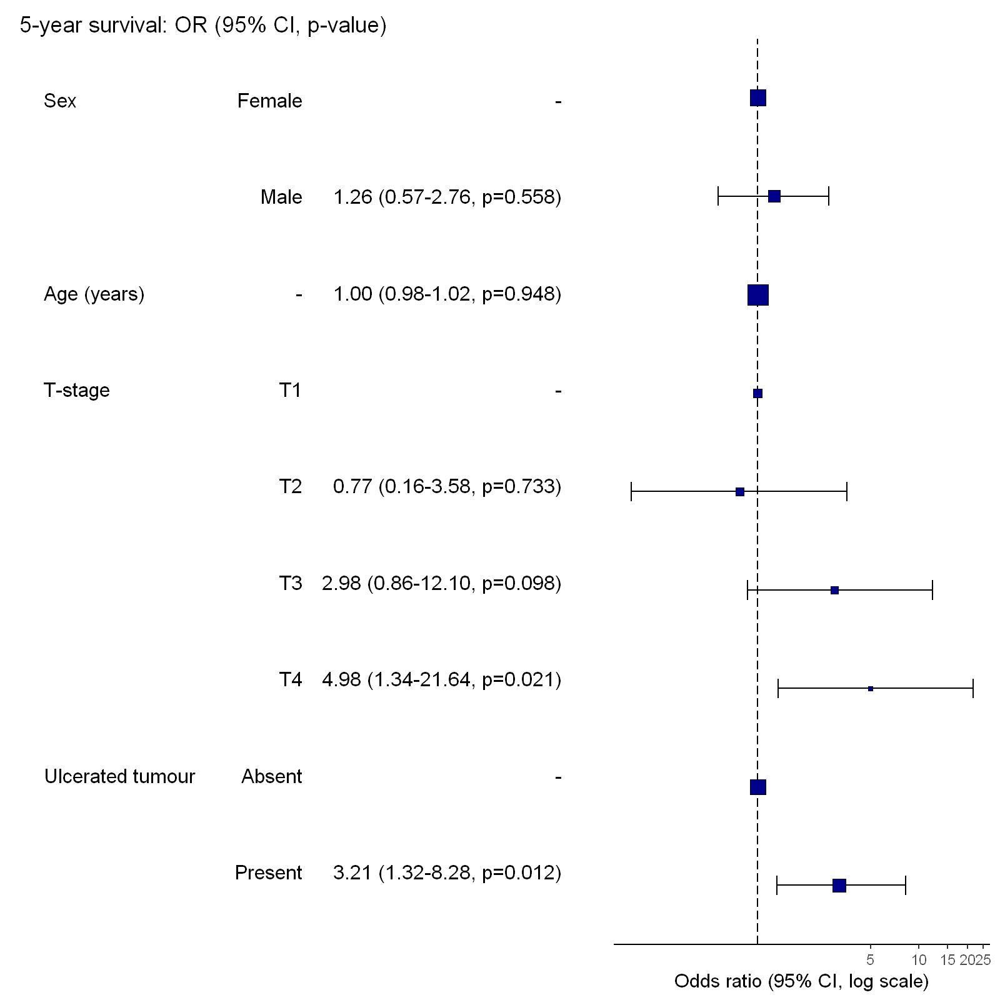

In [269]:
dependent = "mort_5yr"
explanatory = c("sex.factor", "age", "t_stage.factor", "ulcer.factor")
melanoma %>%
or_plot(dependent, explanatory)

# Time-to-event data and surviva

In [270]:
library(tidyverse)
library(finalfit)
melanoma <- boot::melanoma #F1 here for help page with data dictionary

In [271]:
head(melanoma)

,time,status,sex,age,year,thickness,ulcer
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,10,3,1,76,1972,6.76,1
2,30,3,1,56,1968,0.65,0
3,35,2,1,41,1977,1.34,0
4,99,3,0,71,1968,2.90,0
5,185,1,1,52,1965,12.08,1
6,204,1,1,28,1971,4.84,1


In [272]:
library(dplyr)
library(forcats)
melanoma <- melanoma %>%
mutate(
# Overall survival
status_os = if_else(status == 2, 0, # "still alive"
1), # "died of melanoma" or "died of other causes"
# Diease-specific survival
status_dss = if_else(status == 2, 0, # "still alive"
if_else(status == 1, 1, # "died of melanoma"
0)), # "died of other causes is censored"
# Competing risks regression
status_crr = if_else(status == 2, 0, # "still alive"
if_else(status == 1, 1, # "died of melanoma"
2)), # "died of other causes"
# Label and recode other variables
age = ff_label(age, "Age (years)"), # ff_label table friendly labels
thickness = ff_label(thickness, "Tumour thickness (mm)"),
sex = factor(sex) %>%
fct_recode("Male" = "1",
"Female" = "0") %>%
ff_label("Sex"),
ulcer = factor(ulcer) %>%
fct_recode("No" = "0",
"Yes" = "1") %>%
ff_label("Ulcerated tumour")
)

We will use the excellent survival package to produce the Kaplan Meier (KM)
survival estimator (Terry M. Therneau and Patricia M. Grambsch (2000),
Therneau (2020)). This is a non-parametric statistic used to estimate the
survival function from time-to-event data.

In [273]:
library(survival)
survival_object <- melanoma %$%
Surv(time, status_os)
# Explore:
head(survival_object) # + marks censoring, in this case "Alive"

[1]  10   30   35+  99  185  204 

In [274]:
# Expressing time in years
survival_object <- melanoma %$%
Surv(time/365, status_os)


In [275]:
# Overall survival in whole cohort
my_survfit <- survfit(survival_object ~ 1, data = melanoma)
my_survfit # 205 patients, 71 events


Call: survfit(formula = survival_object ~ 1, data = melanoma)

       n events median 0.95LCL 0.95UCL
[1,] 205     71     NA    9.15      NA

In [276]:
summary(my_survfit, times = c(0, 1, 2, 3, 4, 5))

Call: survfit(formula = survival_object ~ 1, data = melanoma)

 time n.risk n.event survival std.err lower 95% CI upper 95% CI
    0    205       0    1.000  0.0000        1.000        1.000
    1    193      11    0.946  0.0158        0.916        0.978
    2    183      10    0.897  0.0213        0.856        0.940
    3    167      16    0.819  0.0270        0.767        0.873
    4    160       7    0.784  0.0288        0.730        0.843
    5    122      10    0.732  0.0313        0.673        0.796

In [277]:
library(survminer)

Loading required package: ggpubr


Attaching package: 'survminer'


The following object is masked from 'package:survival':

    myeloma




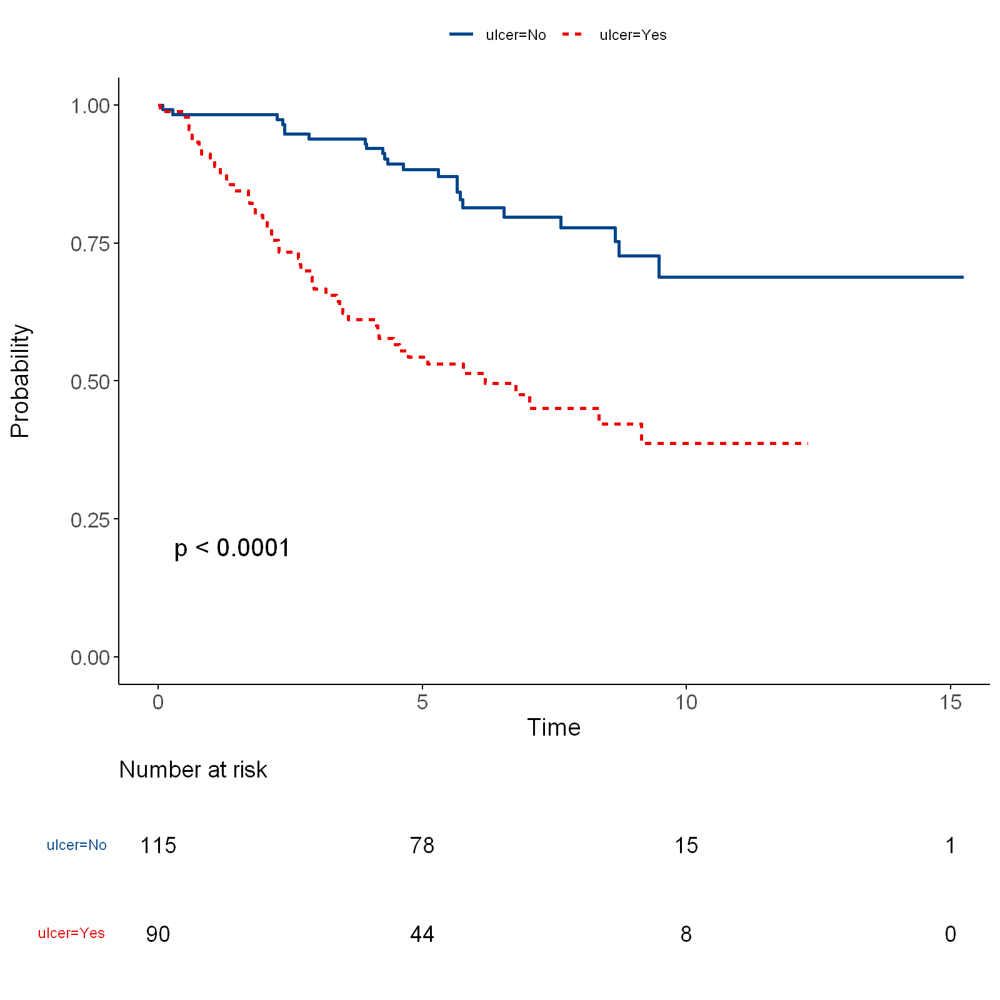

In [278]:
dependent_os <- "Surv(time/365, status_os)"
explanatory <- c("ulcer")
melanoma %>%
surv_plot(dependent_os, explanatory, pval = TRUE)


In [279]:
library(survival)
coxph(Surv(time, status_os) ~ age + sex + thickness + ulcer, data = melanoma) %>%
summary()

Call:
coxph(formula = Surv(time, status_os) ~ age + sex + thickness + 
    ulcer, data = melanoma)

  n= 205, number of events= 71 

              coef exp(coef) se(coef)     z Pr(>|z|)    
age       0.021831  1.022071 0.007752 2.816 0.004857 ** 
sexMale   0.413460  1.512040 0.240132 1.722 0.085105 .  
thickness 0.099467  1.104582 0.034455 2.887 0.003891 ** 
ulcerYes  0.952083  2.591100 0.267966 3.553 0.000381 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

          exp(coef) exp(-coef) lower .95 upper .95
age           1.022     0.9784    1.0067     1.038
sexMale       1.512     0.6614    0.9444     2.421
thickness     1.105     0.9053    1.0325     1.182
ulcerYes      2.591     0.3859    1.5325     4.381

Concordance= 0.739  (se = 0.03 )
Likelihood ratio test= 47.89  on 4 df,   p=1e-09
Wald test            = 46.72  on 4 df,   p=2e-09
Score (logrank) test = 52.77  on 4 df,   p=1e-10


In [280]:
exp(0.9)

[1] 2.459603

In [281]:
exp(1.1)

[1] 3.004166

In [282]:
dependent_os <- "Surv(time, status_os)"
dependent_dss <- "Surv(time, status_dss)"

In [283]:
dependent_crr <- "Surv(time, status_crr)"
explanatory <- c("age", "sex", "thickness", "ulcer")
melanoma %>% finalfit(dependent_os, explanatory)

,"Dependent: Surv(time, status_os)",,all,HR (univariable),HR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>
1,Age (years),Mean (SD),52.5 (16.7),"1.03 (1.01-1.05, p<0.001)","1.02 (1.01-1.04, p=0.005)"
2,Sex,Female,126 (61.5),-,-
3,,Male,79 (38.5),"1.93 (1.21-3.07, p=0.006)","1.51 (0.94-2.42, p=0.085)"
4,Tumour thickness (mm),Mean (SD),2.9 (3.0),"1.16 (1.10-1.23, p<0.001)","1.10 (1.03-1.18, p=0.004)"
5,Ulcerated tumour,No,115 (56.1),-,-
6,,Yes,90 (43.9),"3.52 (2.14-5.80, p<0.001)","2.59 (1.53-4.38, p<0.001)"


# Reduced model

In [284]:
explanatory_multi <- c("age", "thickness", "ulcer")
melanoma %>% finalfit(dependent_os, explanatory,
                      explanatory_multi, keep_models = TRUE)

,"Dependent: Surv(time, status_os)",,all,HR (univariable),HR (multivariable full),HR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Age (years),Mean (SD),52.5 (16.7),"1.03 (1.01-1.05, p<0.001)","1.02 (1.01-1.04, p=0.005)","1.02 (1.01-1.04, p=0.003)"
2,Sex,Female,126 (61.5),-,-,-
3,,Male,79 (38.5),"1.93 (1.21-3.07, p=0.006)","1.51 (0.94-2.42, p=0.085)",-
4,Tumour thickness (mm),Mean (SD),2.9 (3.0),"1.16 (1.10-1.23, p<0.001)","1.10 (1.03-1.18, p=0.004)","1.10 (1.03-1.18, p=0.003)"
5,Ulcerated tumour,No,115 (56.1),-,-,-
6,,Yes,90 (43.9),"3.52 (2.14-5.80, p<0.001)","2.59 (1.53-4.38, p<0.001)","2.72 (1.61-4.57, p<0.001)"


## Testing for proportional hazards

An assumption of CPH regression is that the hazard (think risk) associated
with a particular variable does not change over time. For example, is the
magnitude of the increase in risk of death associated with tumour ulceration
the same in the early post-operative period as it is in later years?

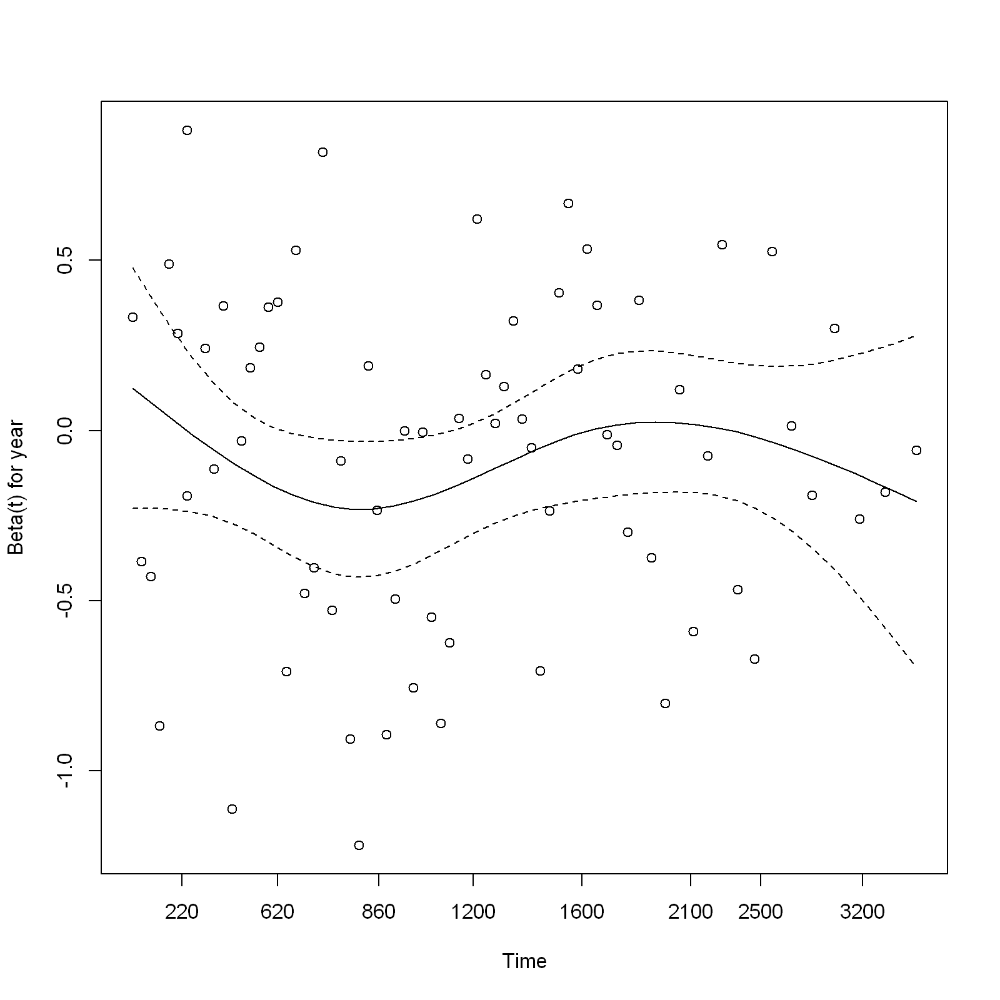

In [285]:
explanatory <- c("age", "sex", "thickness", "ulcer", "year")
melanoma %>%
coxphmulti(dependent_os, explanatory) %>%
cox.zph() %>%
{zph_result <<- .} %>%
plot(var=5)

No variable significantly differs from zero
at the 5% significance level.

In [286]:
zph_result

          chisq df     p
age       2.067  1 0.151
sex       0.505  1 0.477
thickness 2.837  1 0.092
ulcer     4.325  1 0.038
year      0.451  1 0.502
GLOBAL    7.891  5 0.162

In [287]:
explanatory <- c("age", "sex", "ulcer", "thickness",
"strata(year)")
melanoma %>%
finalfit(dependent_os, explanatory)

,"Dependent: Surv(time, status_os)",,all,HR (univariable),HR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>
1,Age (years),Mean (SD),52.5 (16.7),"1.03 (1.01-1.05, p<0.001)","1.03 (1.01-1.05, p=0.002)"
2,Sex,Female,126 (61.5),-,-
3,,Male,79 (38.5),"1.93 (1.21-3.07, p=0.006)","1.75 (1.06-2.87, p=0.027)"
6,Ulcerated tumour,No,115 (56.1),-,-
7,,Yes,90 (43.9),"3.52 (2.14-5.80, p<0.001)","2.61 (1.47-4.63, p=0.001)"
5,Tumour thickness (mm),Mean (SD),2.9 (3.0),"1.16 (1.10-1.23, p<0.001)","1.08 (1.01-1.16, p=0.027)"
4,strata(year),,,-,-


ng a cluster() term is similar to a generalised estimating equations (GEE)
approach (something we’re not covering in this book). Here, a standard CPH
model is fitted but the standard errors of the estimated hazard ratios are
adjusted to account for correlations.

In [288]:
melanoma <- melanoma %>%
mutate(hospital_id = c(rep(1:10, 20), rep(11, 5)))
# Cluster model
explanatory <- c("age", "sex", "thickness", "ulcer",
"cluster(hospital_id)")
melanoma %>%
finalfit(dependent_os, explanatory)

,"Dependent: Surv(time, status_os)",,all,HR (univariable),HR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>
1,Age (years),Mean (SD),52.5 (16.7),"1.03 (1.01-1.05, p<0.001)","1.02 (1.00-1.04, p=0.016)"
3,Sex,Female,126 (61.5),-,-
4,,Male,79 (38.5),"1.93 (1.21-3.07, p=0.006)","1.51 (1.10-2.08, p=0.011)"
5,Tumour thickness (mm),Mean (SD),2.9 (3.0),"1.16 (1.10-1.23, p<0.001)","1.10 (1.04-1.17, p<0.001)"
6,Ulcerated tumour,No,115 (56.1),-,-
7,,Yes,90 (43.9),"3.52 (2.14-5.80, p<0.001)","2.59 (1.61-4.16, p<0.001)"
2,cluster(hospital_id),,,-,-


In [289]:
# Frailty model
explanatory <- c("age", "sex", "thickness", "ulcer",
"frailty(hospital_id)")
melanoma %>%
finalfit(dependent_os, explanatory)


,"Dependent: Surv(time, status_os)",,all,HR (univariable),HR (multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>
1,Age (years),Mean (SD),52.5 (16.7),"1.03 (1.01-1.05, p<0.001)","1.02 (1.01-1.04, p=0.005)"
3,Sex,Female,126 (61.5),-,-
4,,Male,79 (38.5),"1.93 (1.21-3.07, p=0.006)","1.51 (0.94-2.42, p=0.085)"
5,Tumour thickness (mm),Mean (SD),2.9 (3.0),"1.16 (1.10-1.23, p<0.001)","1.10 (1.03-1.18, p=0.004)"
6,Ulcerated tumour,No,115 (56.1),-,-
7,,Yes,90 (43.9),"3.52 (2.14-5.80, p<0.001)","2.59 (1.53-4.38, p<0.001)"
2,frailty(hospital_id),,,-,-


Dependent variable is a survival object

Warning message:
"Removed 3 rows containing missing values (`geom_errorbarh()`)."
Warning message:
"Removed 1 rows containing missing values (`geom_point()`)."


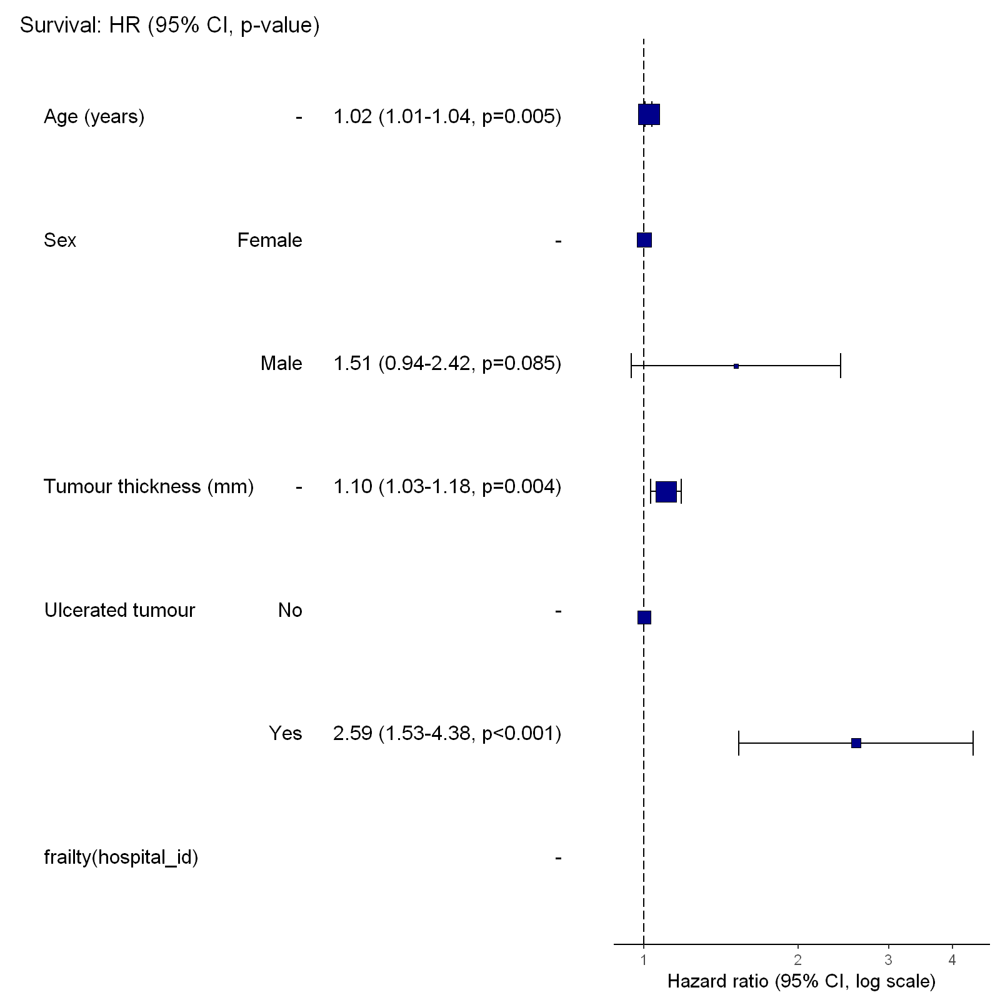

In [290]:
melanoma %>%
hr_plot(dependent_os, explanatory)

In [291]:
library(cmprsk)

In [292]:
explanatory <- c("age", "sex", "thickness", "ulcer")
dependent_dss <- "Surv(time, status_dss)"
dependent_crr <- "Surv(time, status_crr)"
melanoma %>%
# Summary table
summary_factorlist(dependent_dss, explanatory,
column = TRUE, fit_id = TRUE) %>%
# CPH univariable
ff_merge(
melanoma %>%
coxphmulti(dependent_dss, explanatory) %>%
fit2df(estimate_suffix = " (DSS CPH univariable)")
) %>%
# CPH multivariable
ff_merge(
melanoma %>%
coxphmulti(dependent_dss, explanatory) %>%
fit2df(estimate_suffix = " (DSS CPH multivariable)")
) %>%
# Fine and Gray competing risks regression
ff_merge(
melanoma %>%
crrmulti(dependent_crr, explanatory) %>%
fit2df(estimate_suffix = " (competing risks multivariable)")
) %>%
select(-fit_id, -index) %>%
dependent_label(melanoma, "Survival")


Dependent variable is a survival object



,Dependent: Survival,,all,HR (DSS CPH univariable),HR (DSS CPH multivariable),HR (competing risks multivariable)
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Age (years),Mean (SD),52.5 (16.7),"1.01 (1.00-1.03, p=0.141)","1.01 (1.00-1.03, p=0.141)","1.01 (0.99-1.02, p=0.520)"
2,Sex,Female,126 (61.5),-,-,-
3,,Male,79 (38.5),"1.54 (0.91-2.60, p=0.106)","1.54 (0.91-2.60, p=0.106)","1.50 (0.87-2.57, p=0.140)"
4,Tumour thickness (mm),Mean (SD),2.9 (3.0),"1.12 (1.04-1.20, p=0.004)","1.12 (1.04-1.20, p=0.004)","1.09 (1.01-1.18, p=0.019)"
5,Ulcerated tumour,No,115 (56.1),-,-,-
6,,Yes,90 (43.9),"3.20 (1.75-5.88, p<0.001)","3.20 (1.75-5.88, p<0.001)","3.09 (1.71-5.60, p<0.001)"


In [293]:
# Fit model
my_hazard = coxph(survival_object ~ sex + ulcer + age + thickness, data=melanoma)
summary(my_hazard)
# Melanoma thickness has a HR 1.11 (1.03 to 1.18).
# This is interpretted as a 11% increase in the
# risk of death at any time for each 1 mm increase in thickness.
# Check assumptions
ph = cox.zph(my_hazard)
ph


Call:
coxph(formula = survival_object ~ sex + ulcer + age + thickness, 
    data = melanoma)

  n= 205, number of events= 71 

              coef exp(coef) se(coef)     z Pr(>|z|)    
sexMale   0.413460  1.512040 0.240132 1.722 0.085105 .  
ulcerYes  0.952083  2.591100 0.267966 3.553 0.000381 ***
age       0.021831  1.022071 0.007752 2.816 0.004857 ** 
thickness 0.099467  1.104582 0.034455 2.887 0.003891 ** 
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

          exp(coef) exp(-coef) lower .95 upper .95
sexMale       1.512     0.6614    0.9444     2.421
ulcerYes      2.591     0.3859    1.5325     4.381
age           1.022     0.9784    1.0067     1.038
thickness     1.105     0.9053    1.0325     1.182

Concordance= 0.739  (se = 0.03 )
Likelihood ratio test= 47.89  on 4 df,   p=1e-09
Wald test            = 46.72  on 4 df,   p=2e-09
Score (logrank) test = 52.77  on 4 df,   p=1e-10


          chisq df     p
sex       0.478  1 0.489
ulcer     4.633  1 0.031
age       1.610  1 0.205
thickness 3.124  1 0.077
GLOBAL    7.706  4 0.103

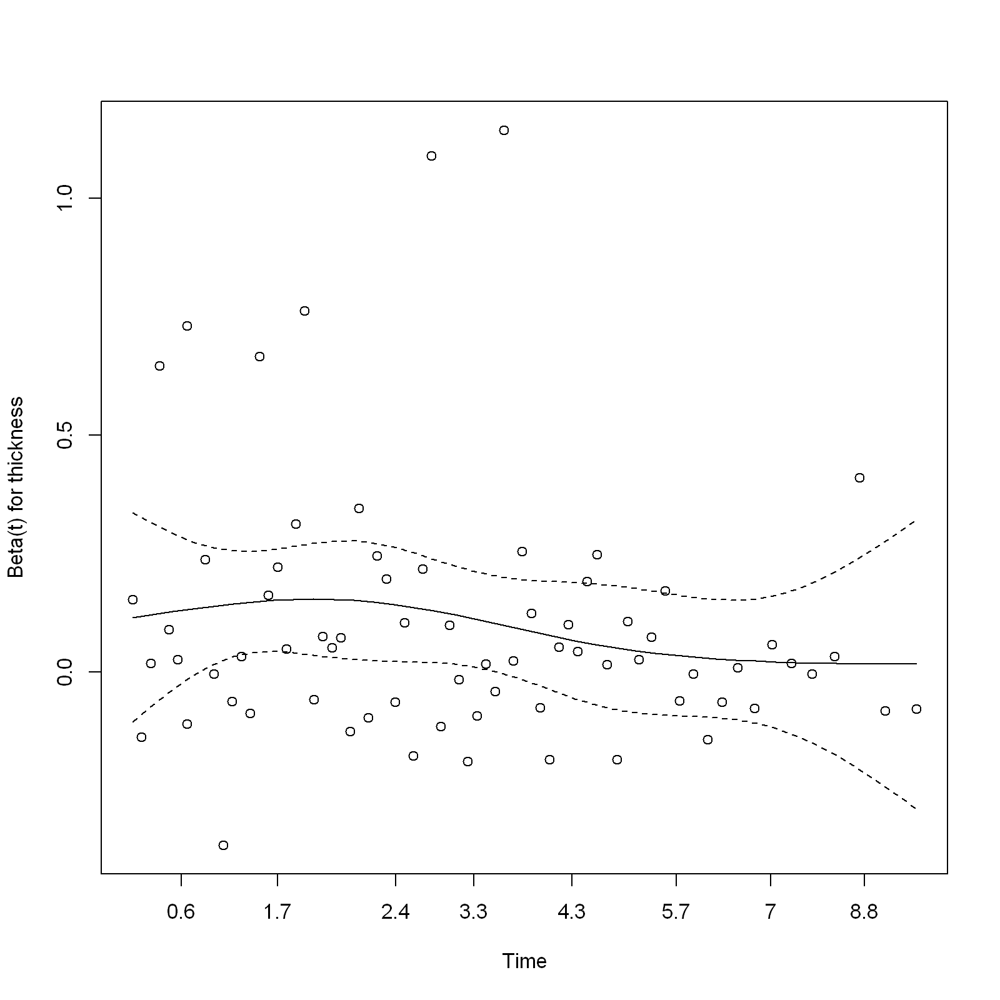

In [294]:
plot(ph, var=4)

# Workflow

In [296]:
library(finalfit)
library(dplyr)
set.seed(1)
colon_s <- colon_s %>%
mutate(
## Smoking missing completely at random
    smoking_mcar = sample(c("Smoker", "Non-smoker", NA),
                          n(), replace=TRUE,
                          prob = c(0.2, 0.7, 0.1)) %>%
    factor() %>%
    ff_label("Smoking (MCAR)"),
    
    ## Smoking missing conditional on patient sex
    smoking_mar = ifelse(sex.factor == "Female",
                         sample(c("Smoker", "Non-smoker", NA),
                                sum(sex.factor == "Female"),
                                replace = TRUE,
                                prob = c(0.1, 0.5, 0.4)),
                         
                         sample(c("Smoker", "Non-smoker", NA),
                                sum(sex.factor == "Male"),
                                replace=TRUE, prob = c(0.15, 0.75, 0.1))
                        ) %>%
    factor() %>%
    ff_label("Smoking (MAR)")
)


In [298]:
explanatory <- c("age", "sex.factor",
                 "nodes", "obstruct.factor",
                 "smoking_mcar", "smoking_mar")
dependent <- "mort_5yr"
colon_s %>% ff_glimpse(dependent, explanatory)

$Continuous
            label var_type   n missing_n missing_percent mean   sd  min
age   Age (years)    <dbl> 929         0             0.0 59.8 11.9 18.0
nodes       nodes    <dbl> 911        18             1.9  3.7  3.6  0.0
      quartile_25 median quartile_75  max
age          53.0   61.0        69.0 85.0
nodes         1.0    2.0         5.0 33.0

$Categorical
                           label var_type   n missing_n missing_percent
mort_5yr        Mortality 5 year    <fct> 915        14             1.5
sex.factor                   Sex    <fct> 929         0             0.0
obstruct.factor      Obstruction    <fct> 908        21             2.3
smoking_mcar      Smoking (MCAR)    <fct> 828       101            10.9
smoking_mar        Smoking (MAR)    <fct> 726       203            21.9
                levels_n                              levels  levels_count
mort_5yr               2        "Alive", "Died", "(Missing)"  511, 404, 14
sex.factor             2                    "Female", "Male"      445, 484
obstruct.factor        2            "No", "Yes", "(Missing)"  732, 176, 21
smoking_mcar           2 "Non-smoker", "Smoker", "(Missing)" 645, 183, 101
smoking_mar            2 "Non-smoker", "Smoker", "(Missing)" 585, 141, 203
                  levels_percent
mort_5yr        55.0, 43.5,  1.5
sex.factor                48, 52
obstruct.factor 78.8, 18.9,  2.3
smoking_mcar          69, 20, 11
smoking_mar           63, 15, 22

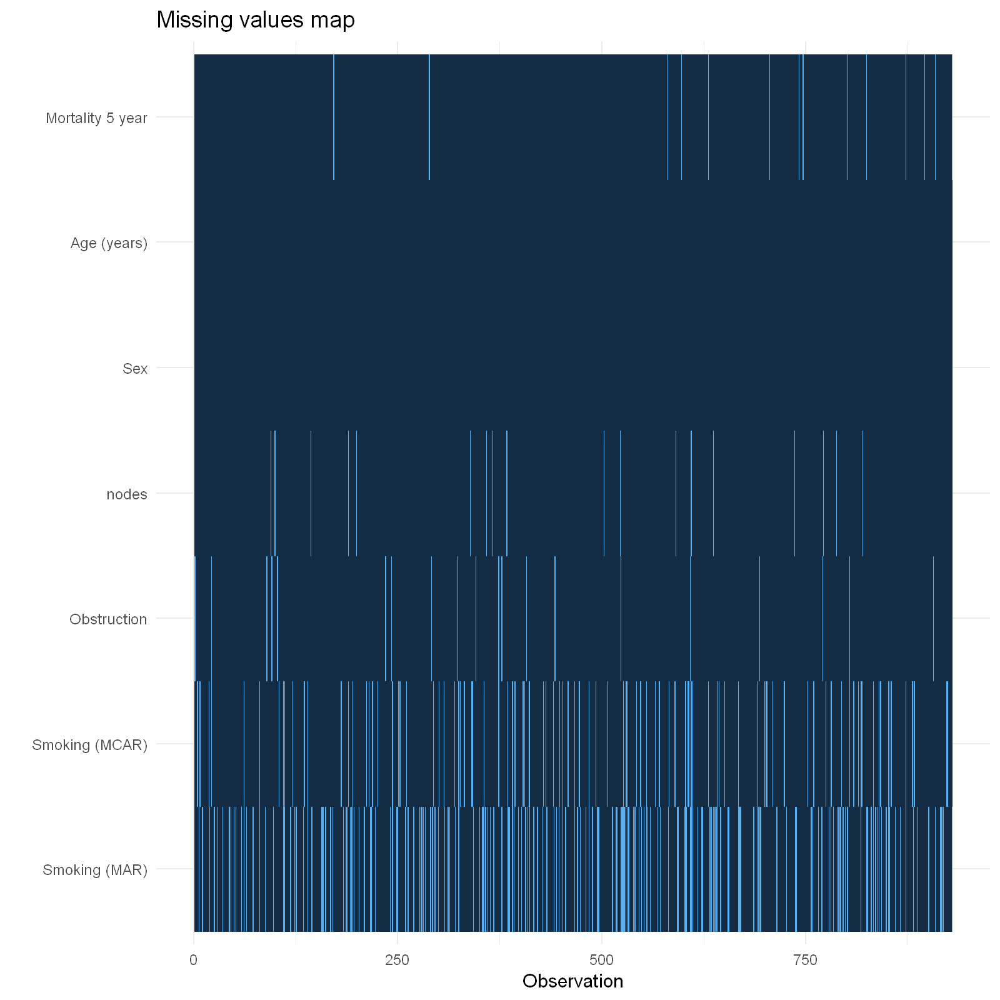

In [299]:
colon_s %>%
missing_plot(dependent, explanatory)

,age,sex.factor,mort_5yr,obstruct.factor,smoking_mcar,smoking_mar,
631,1,1,1,1,1,1,0
167,1,1,1,1,1,0,1
69,1,1,1,1,0,1,1
27,1,1,1,1,0,0,2
14,1,1,1,0,1,1,1
4,1,1,1,0,1,0,2
3,1,1,1,0,0,1,2
8,1,1,0,1,1,1,1
4,1,1,0,1,1,0,2
1,1,1,0,1,0,1,2


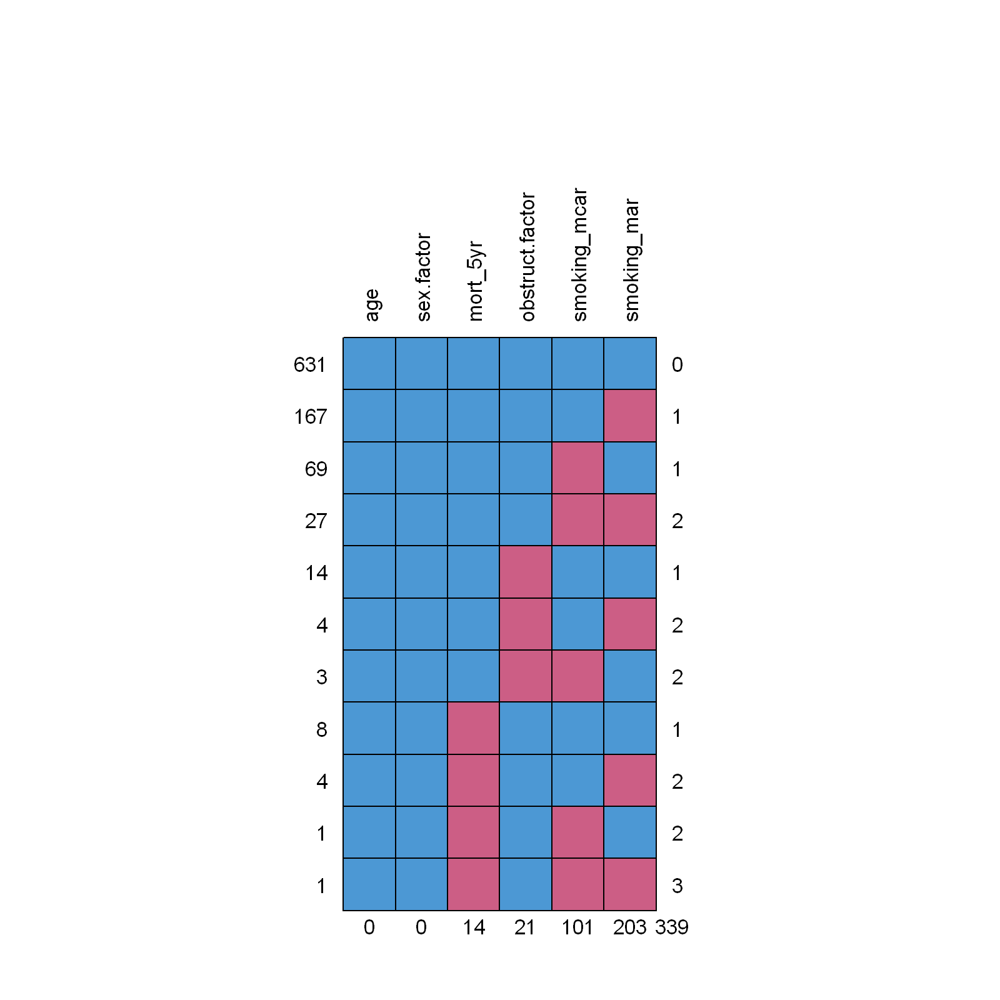

In [300]:
explanatory <- c("age", "sex.factor",
                 "obstruct.factor",
                 "smoking_mcar", "smoking_mar")
dependent <- "mort_5yr"
colon_s %>%
missing_pattern(dependent, explanatory)

In [302]:
#xplanatory or confounding variables
explanatory <- c("age", "sex.factor",
                 "nodes","smoking_mcar", "smoking_mar")
# Explanatory variable of interest
dependent <- "obstruct.factor" # Bowel obstruction
table1 <- colon_s %>%
summary_factorlist(dependent, explanatory,
na_include=TRUE, na_include_dependent = TRUE,
total_col = TRUE, add_col_totals = TRUE, p=TRUE)

In [303]:
table1

label,levels,No,Yes,(Missing),Total,p
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Total N (%),,732 (78.8),176 (18.9),21 (2.3),929,
Age (years),Mean (SD),60.2 (11.5),57.3 (13.3),63.9 (11.9),59.8 (11.9),0.004
Sex,Female,346 (47.3),91 (51.7),8 (38.1),445 (47.9),0.330
,Male,386 (52.7),85 (48.3),13 (61.9),484 (52.1),
nodes,Mean (SD),3.7 (3.7),3.5 (3.2),3.3 (3.1),3.7 (3.6),0.435
Smoking (MCAR),Non-smoker,500 (68.3),130 (73.9),15 (71.4),645 (69.4),0.080
,Smoker,154 (21.0),26 (14.8),3 (14.3),183 (19.7),
,(Missing),78 (10.7),20 (11.4),3 (14.3),101 (10.9),
Smoking (MAR),Non-smoker,456 (62.3),115 (65.3),14 (66.7),585 (63.0),0.822


Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."


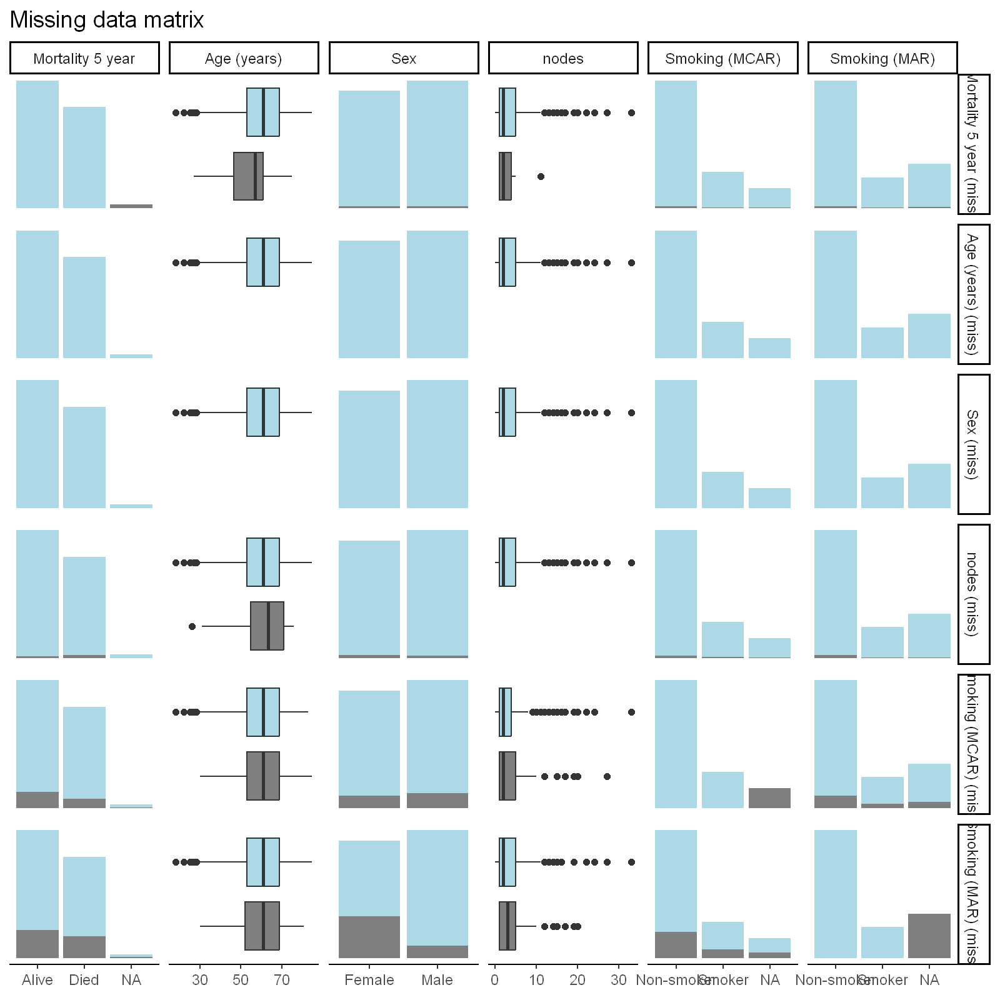

In [304]:
xplanatory <- c("age", "sex.factor",
"nodes", "obstruct.factor",
"smoking_mcar", "smoking_mar")
dependent <- "mort_5yr"
colon_s %>%
missing_pairs(dependent, explanatory)

Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 18 rows containing non-finite values (`stat_boxplot()`)."


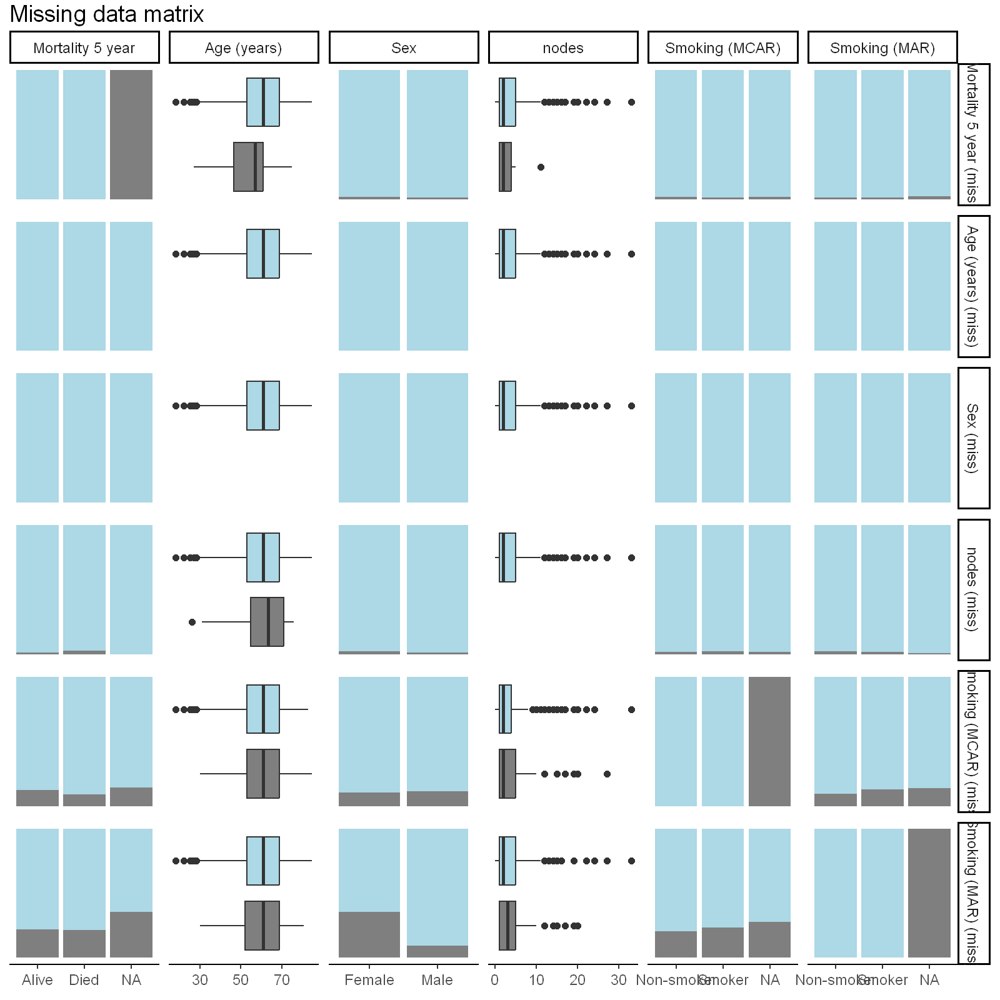

In [305]:
colon_s %>%
missing_pairs(dependent, explanatory, position = "fill")

In [306]:
explanatory <- c("age", "sex.factor",
"nodes", "obstruct.factor")
dependent <- "smoking_mcar"
missing_mcar <- colon_s %>%
missing_compare(dependent, explanatory)

In [307]:
dependent <- "smoking_mar"
missing_mar <- colon_s %>%
missing_compare(dependent, explanatory)

In [312]:
install.packages('https://cran.r-project.org/src/contrib/Archive/MissMech/MissMech_1.0.1.tar.gz',
                repos=NULL, type='source')

Installing package into 'C:/Users/kevin/AppData/Local/R/win-library/4.3'
(as 'lib' is unspecified)



In [318]:
library(MissMech)
explanatory <- c("age", "nodes")
dependent <- "mort_5yr"
colon_s %>%
select(all_of(explanatory)) %>%
MissMech::TestMCARNormality()  %>% tail()

$patused
     age nodes
[1,]   1     1
[2,]   1    NA

$patcnt
[1] 911  18

$imputation.number
[1] 1

$mu
           [,1]
age   59.754575
nodes  3.660345

$sigma
            age     nodes
[1,] 142.622221 -3.978525
[2,]  -3.978525 12.750364

$call
MissMech::TestMCARNormality(data = .)
